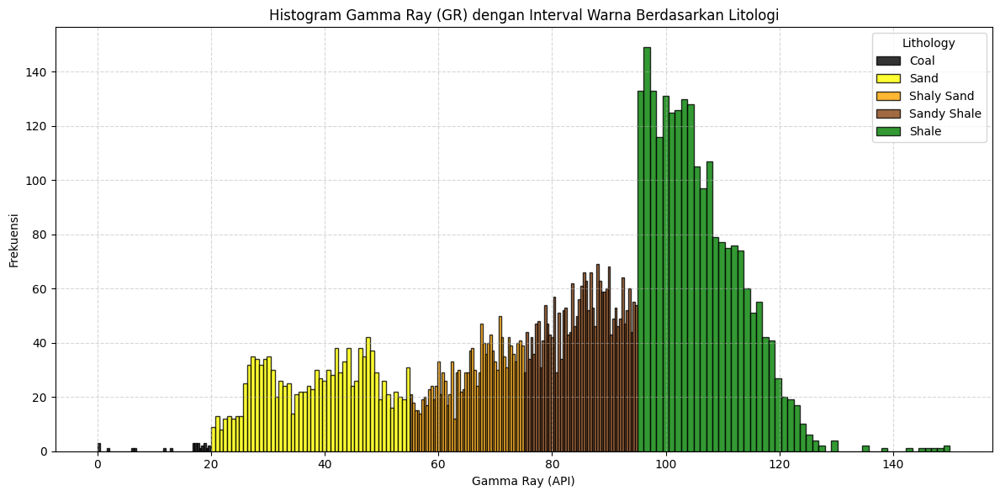

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import glob

# --- Load data CSV (ganti path sesuai kebutuhan lokal) ---
# Contoh:
df1 = pd.read_csv("/content/NTN-1_New.csv")
df2 = pd.read_csv("/content/NTN-2_New.csv")
df3 = pd.read_csv("/content/NTN-3_New.csv")
df6 = pd.read_csv("/content/NTN-6_New.csv")
df_all = pd.concat([df1, df2, df3, df6], ignore_index=True)

# --- Fungsi klasifikasi litologi berdasarkan Gamma Ray ---
def classify_lithology_local(gr_value):
    if gr_value < 20:
        return "Coal"
    elif gr_value < 55:
        return "Sand"
    elif gr_value < 75:
        return "Shaly Sand"
    elif gr_value < 95:
        return "Sandy Shale"
    else:
        return "Shale"

# --- Terapkan fungsi klasifikasi (jika belum) ---
df_all['Lithology'] = df_all['GR'].apply(classify_lithology_local)

# --- Buat histogram dengan warna berbeda tiap litologi ---
plt.figure(figsize=(12, 6))

# Daftar interval GR dan warna + label-nya
intervals = [
    (0, 20, 'black', 'Coal'),
    (20, 55, 'yellow', 'Sand'),
    (55, 75, 'orange', 'Shaly Sand'),
    (75, 95, 'saddlebrown', 'Sandy Shale'),
    (95, 150, 'green', 'Shale')  # Asumsi GR maksimum 200 API
]

# Plot histogram per interval
for lower, upper, color, label in intervals:
    mask = (df_all['GR'] >= lower) & (df_all['GR'] < upper)
    plt.hist(df_all['GR'][mask], bins=50, color=color, edgecolor='k', alpha=0.8, label=label)

# --- Tambahkan elemen visual ---
plt.title("Histogram Gamma Ray (GR) dengan Interval Warna Berdasarkan Litologi")
plt.xlabel("Gamma Ray (API)")
plt.ylabel("Frekuensi")
plt.legend(title="Lithology")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [ ]:
df_all

,DEPT,A,AI,BH_FL_BS,BS,CAL,CALI,COAL,DEN,DT,...,RW,SP,SP1,SWE_INDO,TEMP,VSH_GR,VSH_GRC,DEPTH,DEPTH_MD,Lithology
0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Shale
1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Shale
2,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Shale
3,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Shale
4,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Shale
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8232,1982.0,NaN,NaN,NaN,12.25,NaN,NaN,NaN,NaN,72.18,...,NaN,-11.55,-6.57,NaN,275.08,NaN,NaN,1982.0,6502.63,Sand
8233,1983.0,NaN,NaN,NaN,12.25,NaN,NaN,NaN,NaN,72.22,...,NaN,-14.01,-10.08,NaN,275.18,NaN,NaN,1983.0,6505.91,Sand
8234,1984.0,NaN,NaN,NaN,12.25,NaN,NaN,NaN,NaN,71.96,...,NaN,-12.58,-9.72,NaN,275.28,NaN,NaN,1984.0,6509.19,Sand
8235,1985.0,NaN,NaN,NaN,12.25,NaN,NaN,NaN,NaN,72.04,...,NaN,-13.08,-11.28,NaN,275.38,NaN,NaN,1985.0,6512.47,Sand


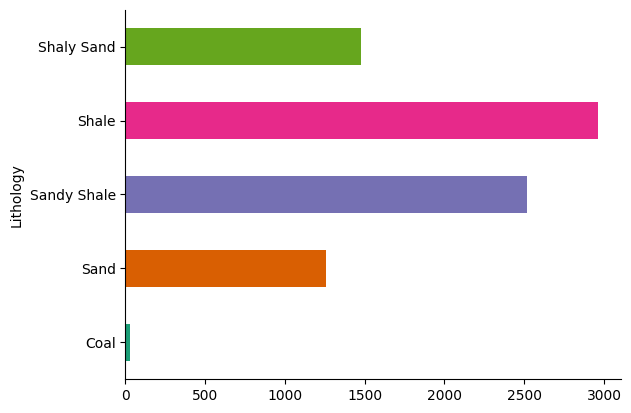

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
df_all.groupby('Lithology').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
lito = np.zeros([len(df_all['GR']), 1], float)
k = df_all['Lithology']
k1 = np.array(k)
for i in range(0, len(lito)):
  if k1[i] == 'Coal':
    lito[i] = 0
  elif k1[i] == 'Sand':
    lito[i] = 1
  elif k1[i] == 'Shaly Sand':
    lito[i] = 2
  elif k1[i] == 'Sandy Shale':
    lito[i] = 3
  else :
    lito[i] = 4

lito

array([[4.],
       [4.],
       [4.],
       ...,
       [1.],
       [1.],
       [1.]])

In [ ]:
import pandas as pd
# import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, BoundaryNorm
import seaborn as sns

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Dense, Dropout, Flatten, GlobalMaxPooling1D # Added GlobalMaxPooling1D

# import glob

In [ ]:
df_all['kode_lito'] = lito
df_all

,DEPT,A,AI,BH_FL_BS,BS,CAL,CALI,COAL,DEN,DT,...,SP,SP1,SWE_INDO,TEMP,VSH_GR,VSH_GRC,DEPTH,DEPTH_MD,Lithology,kode_lito
0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Shale,4.0
1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Shale,4.0
2,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Shale,4.0
3,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Shale,4.0
4,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Shale,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8232,1982.0,NaN,NaN,NaN,12.25,NaN,NaN,NaN,NaN,72.18,...,-11.55,-6.57,NaN,275.08,NaN,NaN,1982.0,6502.63,Sand,1.0
8233,1983.0,NaN,NaN,NaN,12.25,NaN,NaN,NaN,NaN,72.22,...,-14.01,-10.08,NaN,275.18,NaN,NaN,1983.0,6505.91,Sand,1.0
8234,1984.0,NaN,NaN,NaN,12.25,NaN,NaN,NaN,NaN,71.96,...,-12.58,-9.72,NaN,275.28,NaN,NaN,1984.0,6509.19,Sand,1.0
8235,1985.0,NaN,NaN,NaN,12.25,NaN,NaN,NaN,NaN,72.04,...,-13.08,-11.28,NaN,275.38,NaN,NaN,1985.0,6512.47,Sand,1.0


In [ ]:
df1_ = df1[['GR', 'DEN', 'NPHI', 'DT', 'RILD']]
df2_ = df2[['GR', 'DEN', 'NPHI', 'DT', 'RILD']]
df3_ = df3[['GR', 'DEN', 'NPHI', 'DT', 'RILD']]
df6_ = df6[['GR', 'DEN', 'NPHI', 'DT', 'RILD']]
df1_cleaned = df1_.dropna()
df2_cleaned = df2_.dropna()
df3_cleaned = df3_.dropna()
df6_cleaned = df6_.dropna()
# df_all_cleaned = df_all.dropna()
DF1 = np.array(df1_cleaned)
DF2 = np.array(df2_cleaned)
DF3 = np.array(df3_cleaned)
DF6 = np.array(df6_cleaned)
# DF_ALL = np.array(df_all_cleaned)
# print(DF1['GR']) # This line causes an IndexError because NumPy arrays are indexed by integers, not column names.

In [ ]:
# df_all1 = df_all.dropna()
Df_clean = df_all[['GR', 'DEN', 'NPHI', 'DT', 'RILD', 'kode_lito']]
df_clean1 = Df_clean.dropna()
Df_clean2 = np.array(df_clean1)#[0:1000]
print(Df_clean2.shape)

lab = df_clean1['kode_lito']
lab1 = np.array(lab)#[0:1000]
print(lab1.shape)
X_train, X_test, y_train, y_test = train_test_split(Df_clean2[:, 0:5] ,lab1, test_size=0.2, random_state=42)#Test size dan random stste bisa di ubah untuk lainnya

(4144, 6)
(4144,)


In [ ]:
# model = Sequential([
#     Conv1D(filters=16, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1), padding='same', strides=1),
#     MaxPooling1D(pool_size=2, strides=1),
#     Conv1D(filters=32, kernel_size=3, activation='relu', padding='same', strides=1),
#     MaxPooling1D(pool_size=2, strides=1),
#     Flatten(), # Flatten the output of the convolutional layers before the Dense layers
#     Dense(64, activation='relu'),
#     Dropout(0.4),
#     Dense(len(np.unique(y_train)), activation='softmax')  # Jumlah facies
# ])

# model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
# model.summary()
model = Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1), padding='same', strides=1),
    MaxPooling1D(pool_size=2, strides=1),
    Conv1D(filters=128, kernel_size=3, activation='relu', padding='same', strides=1),
    MaxPooling1D(pool_size=2, strides=1),
    Conv1D(filters=256, kernel_size=3, activation='relu', padding='same', strides=1),
    MaxPooling1D(pool_size=2, strides=1),
    Conv1D(filters=512, kernel_size=3, activation='relu', padding='same', strides=1),
    MaxPooling1D(pool_size=2, strides=1),
    Flatten(), # Flatten the output of the convolutional layers before the Dense layers
    Dense(256, activation='relu'),
    Dropout(0.4),
    Dense(len(np.unique(y_train)), activation='softmax')  # Jumlah facies
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_8 (Conv1D)               │ (None, 5, 64)          │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_4 (MaxPooling1D)  │ (None, 4, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_9 (Conv1D)               │ (None, 4, 128)         │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_5 (MaxPooling1D)  │ (None, 3, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_10 (Conv1D)              │ (None, 3, 256)         │        98,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_6 (MaxPooling1D)  │ (None, 2, 256)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_11 (Conv1D)              │ (None, 2, 512)         │       393,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_7 (MaxPooling1D)  │ (None, 1, 512)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 649,861 (2.48 MB)

 Trainable params: 649,861 (2.48 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X_train, y_train, epochs=25, batch_size=32,
                    validation_data=(X_test, y_test))

Epoch 1/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step - accuracy: 0.4538 - loss: 2.0247 - val_accuracy: 0.5995 - val_loss: 0.8368
Epoch 2/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - accuracy: 0.6269 - loss: 0.8011 - val_accuracy: 0.6948 - val_loss: 0.7054
Epoch 3/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7357 - loss: 0.6112 - val_accuracy: 0.6261 - val_loss: 0.7707
Epoch 4/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.7460 - loss: 0.5833 - val_accuracy: 0.7865 - val_loss: 0.5171
Epoch 5/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - accuracy: 0.7898 - loss: 0.5029 - val_accuracy: 0.8142 - val_loss: 0.4228
Epoch 6/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8171 - loss: 0.4396 - val_accuracy: 0.8323 - val_loss: 0.4128
Epoch 7/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.8174 - loss: 0.4356 - val_accuracy: 0.8359 - val_loss: 0.3620
Epoch 8/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.8377 - loss: 0.3979 - val_accu

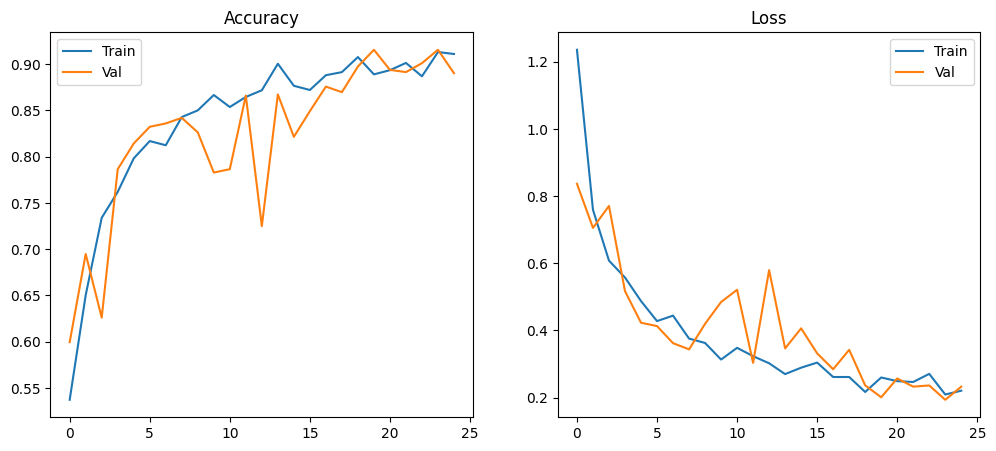

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title('Accuracy')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title('Loss')
plt.legend()

plt.show()

26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         1
         1.0       0.96      0.95      0.95       157
         2.0       0.85      0.94      0.89       160
         3.0       0.82      0.93      0.87       280
         4.0       1.00      0.77      0.87       231

    accuracy                           0.89       829
   macro avg       0.72      0.72      0.72       829
weighted avg       0.90      0.89      0.89       829



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


<Axes: >

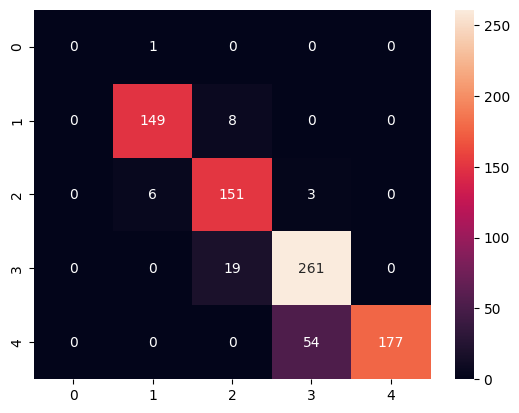

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

print(classification_report(y_test, y_pred_classes))
sns.heatmap(confusion_matrix(y_test, y_pred_classes), annot=True, fmt='d')

In [ ]:
y_pred_all = model.predict(X_test)
yy = np.argmax(y_pred_all, axis=1)
yy

26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


array([4, 1, 1, 3, 3, 2, 2, 2, 2, 3, 3, 2, 4, 3, 3, 1, 3, 4, 4, 4, 2, 4,
       3, 3, 2, 4, 3, 3, 3, 3, 3, 3, 1, 1, 3, 3, 2, 1, 2, 3, 3, 3, 4, 4,
       3, 1, 4, 4, 3, 2, 4, 2, 3, 2, 2, 2, 2, 2, 2, 1, 2, 3, 2, 4, 4, 3,
       4, 4, 1, 3, 1, 1, 1, 3, 3, 4, 4, 3, 4, 4, 2, 1, 4, 3, 4, 3, 1, 1,
       2, 4, 3, 1, 2, 3, 2, 1, 4, 3, 3, 3, 1, 1, 3, 3, 4, 1, 4, 3, 3, 3,
       2, 4, 3, 4, 3, 3, 4, 3, 1, 4, 3, 4, 3, 3, 3, 2, 2, 2, 2, 4, 3, 1,
       4, 4, 3, 3, 4, 3, 3, 4, 2, 1, 3, 3, 3, 3, 1, 1, 3, 2, 3, 4, 3, 4,
       3, 2, 4, 4, 1, 1, 4, 1, 4, 1, 4, 2, 2, 4, 3, 1, 2, 2, 4, 2, 3, 4,
       3, 4, 3, 2, 3, 2, 2, 3, 2, 3, 2, 1, 4, 3, 1, 3, 1, 2, 2, 3, 4, 1,
       3, 3, 2, 2, 3, 2, 3, 3, 4, 4, 4, 3, 1, 3, 3, 4, 2, 3, 3, 3, 1, 2,
       3, 1, 3, 1, 2, 3, 3, 2, 4, 3, 4, 1, 3, 3, 4, 4, 4, 4, 3, 3, 2, 3,
       4, 3, 1, 2, 1, 2, 2, 3, 2, 4, 2, 1, 1, 1, 3, 3, 1, 2, 2, 1, 3, 2,
       3, 4, 3, 1, 3, 3, 3, 3, 4, 3, 1, 3, 4, 3, 3, 2, 4, 3, 3, 2, 3, 2,
       3, 3, 3, 3, 4, 2, 3, 3, 1, 4, 1, 3, 4, 4, 1,

<class 'numpy.ndarray'>
(829, 5)


NameError: name 'cbar' is not defined

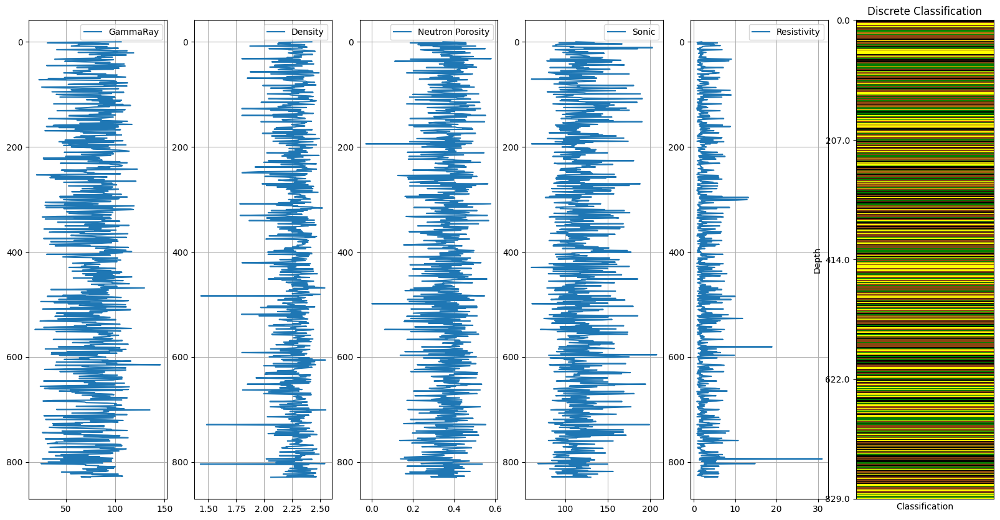

In [ ]:
L = np.zeros ((len(X_test),2),float)
print(type(X_test))
print(X_test.shape)
depth = np.linspace(0,len(yy),len(yy))
for i in range (0,len(X_test)):
  L[i,:] = yy[i]

plt.figure(figsize=(20,10))
plt.subplot(1,6,1)
plt.plot(X_test[:, 0],depth,label='GammaRay')
# plt.ylim(0,1970)
plt.gca().invert_yaxis()
plt.legend()
plt.grid()

plt.subplot(1,6,2)
plt.plot(X_test[:, 1],depth,label='Density')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()

plt.subplot(1,6,3)
plt.plot(X_test[:, 2],depth,label='Neutron Porosity')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()

plt.subplot(1,6,4)
plt.plot(X_test[:, 3],depth,label='Sonic')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()

plt.subplot(1,6,5)
plt.plot(X_test[:, 4],depth,label='Resistivity')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()

plt.subplot(1,6,6)
# plt.imshow(L, aspect='auto', cmap='facies', interpolation='nearest', origin='lower')
# plt.gca().invert_yaxis()
# plt.colorbar(ticks=[1, 2, 3, 4, 5])  # Adjust ticks as needed
# plt.title('Discrete Representation')

colors = ['black', 'yellow', 'orange', 'saddlebrown', 'green']
cmap = ListedColormap(colors)
bounds = [10, 15, 20, 30, 35]
norm = BoundaryNorm(bounds, cmap.N)

# plt.subplot(1,6,6)
# plt.contourf(L)
# plt.gca().invert_yaxis()
# plt.colorbar()
# Create a color map for discrete classes
# num_classes = 4
# cmap = plt.get_cmap('Spectral', num_classes)
# Plotting
plt.subplot(1,6,6)
# Classifications
plt.imshow(L, aspect='auto', cmap=cmap, interpolation='nearest', origin='lower')
# Set depth and labels
plt.yticks(ticks=np.linspace(0, len(yy)-1, num=5), labels=np.round(np.linspace(0, len(yy), num=5)))
plt.xticks([])
plt.gca().invert_yaxis()
plt.xlabel('Classification')
plt.ylabel('Depth')
plt.title('Discrete Classification')
# Adding colorbar
# cbar = plt.colorbar(ticks=range(num_classes))
cbar.ax.set_yticklabels(['Shale', 'Sandy Shale', 'Shaly Sand', 'Sand', 'Coal'])  # Customize labels corresponding to your data
plt.grid(False)
plt.show()

In [ ]:
L = np.zeros((len(X_test), 2), float)
# Prepare depth information
depth = np.linspace(0, len(yy), len(yy))
for i in range(len(X_test)):
    L[i, :] = yy[i]
# Create a facies color map
facies_colors = ['black', 'yellow', 'orange', 'saddlebrown', 'green']
lithology_labels_true = ['Coal', 'Sand', 'Shaly Sand', 'Sandy Shale', 'Shale']
cmap = ListedColormap(facies_colors)
bounds = [1, 2, 3, 4, 5]
norm = BoundaryNorm(bounds, cmap.N)
# Plotting the logs
plt.figure(figsize=(20, 10))
plt.subplot(1, 6, 1)
plt.plot(X_test[:, 0], depth, label='GammaRay')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.subplot(1, 6, 2)
plt.plot(X_test[:, 1], depth, label='Density')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.subplot(1, 6, 3)
plt.plot(X_test[:, 2], depth, label='Neutron Porosity')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.subplot(1, 6, 4)
plt.plot(X_test[:, 3], depth, label='Sonic')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.subplot(1, 6, 5)
plt.plot(X_test[:, 4], depth, label='Resistivity')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
# Integrate previously defined function for facies comparison
plt.subplot(1, 6, 6)
plt.imshow(L, aspect='auto', cmap=cmap, interpolation='nearest', origin='lower')
plt.yticks(ticks=np.linspace(0, len(yy)-1, num=5), labels=np.round(np.linspace(0, len(yy), num=5)))
plt.gca().invert_yaxis()
plt.xticks([])
plt.xlabel('Classification')
plt.ylabel('Depth')
plt.title('Discrete Classification')
# Adding colorbar with labels
colorbar_true = plt.colorbar(ticks=np.arange(len(lithology_labels_true)) + 0.5, label='Lithology') # Ticks centered between colors
colorbar_true.ax.set_yticklabels(lithology_labels_true)
# cbar = plt.colorbar(ticks=bounds, spacing ='proportional')
# cbar.set_ticks([0.5, 1.5, 2.5, 3.5, 4.5])
# cbar.ax.set_yticklabels([ 'Coal', 'Sand', 'Shaly Sand', 'Sandy Shale','Shale'])  # Customize according to your data
plt.grid(False)
plt.tight_layout()
plt.show()

In [ ]:
xtestbaru = Df_clean2[1000:None,0:5]
ytestbaru = lab1[1000:None]
prednew = model.predict(xtestbaru)
print(len(ytestbaru))

In [ ]:
cnnai = np.genfromtxt('/content/aicnntestcoba.txt')
depthcnn = np.linspace (0,40,40)

In [ ]:
L_ = np.zeros ((len(xtestbaru),2),float)
xl = np.linspace(0,2,2)
yl = np.linspace(0,len(L),len(L))
XL,YL = np.meshgrid(xl,yl)
print(XL.shape)
print(type(xtestbaru))
print(X_test.shape)
depth = np.linspace(0,len(ytestbaru),len(ytestbaru))
for i in range (0,len(xtestbaru)):
  L_[i,:] = ytestbaru[i]

plt.figure(figsize=(20,10))
plt.subplot(1,6,1)
plt.plot(xtestbaru[:, 0],depth,label='GammaRay')
# plt.ylim(0,1970)
plt.gca().invert_yaxis()
plt.legend()
plt.grid()

plt.subplot(1,6,2)
plt.plot(xtestbaru[:, 1],depth,label='Density')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()

plt.subplot(1,6,3)
plt.plot(xtestbaru[:, 2],depth,label='Neutron Porosity')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()

plt.subplot(1,6,4)
plt.plot(xtestbaru[:, 3],depth,label='Sonic')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()

plt.subplot(1,6,5)
plt.plot(xtestbaru[:, 4],depth,label='Resistivity')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()

# plt.subplot(1,6,6)
# plt.pcolormesh(L_)
# plt.gca().invert_yaxis()
# plt.colorbar()
lithology_colors_true = ['black', 'yellow', 'orange', 'saddlebrown', 'green']
lithology_labels_true = ['Coal', 'Sand', 'Shaly Sand', 'Sandy Shale', 'Shale']

plt.subplot(1,6,6)

# Reshape ytestbaru to match depth for pcolormesh
lith_true_reshaped = ytestbaru.reshape(-1, 1)
# Ensure depth is also reshaped if it's a new depth array for xtestbaru
# Assuming depth is correctly calculated for xtestbaru:
# depth = np.linspace(0, len(ytestbaru), len(ytestbaru))
depth_true_reshaped = depth.reshape(-1, 1)

# # Create depth boundaries
depth_true_boundaries = np.concatenate([depth_true_reshaped[0:1] - (depth_true_reshaped[1] - depth_true_reshaped[0])/2,
                                        (depth_true_reshaped[:-1] + depth_true_reshaped[1:]) / 2,
                                        depth_true_reshaped[-1:] + (depth_true_reshaped[-1] - depth_true_reshaped[-2])/2])


# Correct creation of X, Y, and C for pcolormesh with shading='flat'
# X and Y should define the vertices of the cells, C defines the color of each cell.
# C should have dimensions (ny, nx) where X has shape (ny+1, nx+1) and Y has shape (ny+1, nx+1).
# In our case, nx is 1 (a single column for lithology).
X_mesh_true, Y_mesh_true = np.meshgrid([0, 1], depth_true_boundaries)
C_mesh_true = lith_true_reshaped # C should have dimensions (ny, nx), which is (990, 1) in this case
# print(X_mesh_true)

plt.pcolormesh(X_mesh_true, Y_mesh_true, C_mesh_true, cmap=plt.cm.colors.ListedColormap(lithology_colors_true), vmin=0, vmax=len(lithology_colors_true), shading='flat')
# xaig = np.zeros((len(cnnai), 1), float) + 0.5
plt.plot((cnnai/100) + 0.5, depthcnn, '-r')
# plt.plot (aimb, xaig, '-m')

plt.gca().invert_yaxis()
plt.title('True Lithology')
# plt.xlabel('Lithology') # No numerical x-axis label needed
plt.xticks([]) # Hide x-axis ticks
plt.yticks(depth) # Keep y-axis ticks aligned with depth

# Add a colorbar with discrete lithology labels
colorbar_true = plt.colorbar(ticks=np.arange(len(lithology_labels_true)) + 0.5, label='Lithology') # Ticks centered between colors
colorbar_true.ax.set_yticklabels(lithology_labels_true)

In [ ]:

predict = model.predict(df_all[['GR', 'RHOB', 'NPHI', 'DT', 'ILD']])
df_all['predicted_kode_lito'] = np.argmax(predict, axis=1)
df_all['predicted_lithology'] = df_all['predicted_kode_lito'].apply(lambda x: lithology_labels_true[x])

# Save the DataFrame with original data and predictions to a CSV file
df_all.to_csv('predicted_lithology_results.csv', index=False)

print("Prediction results saved to 'predicted_lithology_results.csv'")


#Module Import

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch # Added Patch import
from matplotlib.colors import ListedColormap, BoundaryNorm
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, GlobalMaxPooling1D, Dense, Dropout
from sklearn.metrics import classification_report, confusion_matrix

#Preprocessing Data

In [ ]:

# Optimasi pada bagian loading data dan preprocessing

# Lebih rapi dalam mendefinisikan file path
file_paths = [
    "/content/NTN-1_New.csv",
    "/content/NTN-2_New.csv",
    "/content/NTN-3_New.csv",
    "/content/NTN-6_New.csv"
]

# Menggunakan list comprehension untuk membaca semua file
list_dfs = [pd.read_csv(f) for f in file_paths]
df_all = pd.concat(list_dfs, ignore_index=True)

# Fungsi klasifikasi litologi bisa dibuat lebih eksplisit dengan dictionary mapping
def classify_lithology(gr_value):
    if gr_value < 20:
        return "Coal"
    elif gr_value < 55:
        return "Sand"
    elif gr_value < 75:
        return "Shaly Sand"
    elif gr_value < 95:
        return "Sandy Shale"
    else:
        return "Shale"

df_all['Lithology'] = df_all['GR'].apply(classify_lithology)

# Mapping litologi ke angka bisa menggunakan dictionary dan apply
lithology_to_code = {
    'Coal': 0,
    'Sand': 1,
    'Shaly Sand': 2,
    'Sandy Shale': 3,
    'Shale': 4
}
df_all['kode_lito'] = df_all['Lithology'].map(lithology_to_code)

# Pemilihan kolom dan penanganan missing values
# Definisikan kolom fitur dan target secara eksplisit
feature_cols = ['GR', 'DEN', 'NPHI', 'DT', 'RILD']
target_col = 'kode_lito'

# Include 'DEPT' for plotting purposes, if available and relevant
if 'DEPT' in df_all.columns:
    Df_clean = df_all[feature_cols + [target_col, 'DEPT']].dropna()
else:
    Df_clean = df_all[feature_cols + [target_col]].dropna()
    print("Warning: 'DEPT' column not found. Logs will be plotted against index.")


# Split data
# If DEPT is included, split it along with features and target
if 'DEPT' in Df_clean.columns:
    X = Df_clean[feature_cols].values
    y = Df_clean[target_col].values
    depth_cleaned = Df_clean['DEPT'].values
    # Splitting while keeping depth aligned
    X_train, X_test, y_train, y_test, depth_train, depth_test = train_test_split(
        X, y, depth_cleaned, test_size=0.2, random_state=42
    )
else:
    X = Df_clean[feature_cols].values
    y = Df_clean[target_col].values
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )
    # Create dummy depth for plotting if original depth is not available
    depth_train = np.arange(len(X_train))
    depth_test = np.arange(len(X_test))


# Scaling fitur bisa membantu kinerja model neural network
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reshape data for Conv1D (membutuhkan dimensi 3D: samples, timesteps, features)
# Dalam kasus ini, setiap 'timestep' adalah satu set fitur, dan features adalah jumlah log.
X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1))
X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1))


In [ ]:
# Model CNN1D
model = Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), padding='same'),
    Conv1D(filters=128, kernel_size=3, activation='relu', padding='same'),
    Conv1D(filters=256, kernel_size=3, activation='relu', padding='same'),
    Conv1D(filters=512, kernel_size=3, activation='relu', padding='same'),
    GlobalMaxPooling1D(), # Use GlobalMaxPooling1D to flatten the output


    Dense(256, activation='relu'),
    Dropout(0.4),
    Dense(len(np.unique(y_train)), activation='softmax')
])


model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 5, 64)          │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 5, 128)         │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 5, 256)         │        98,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 5, 512)         │       393,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d            │ (None, 512)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 649,861 (2.48 MB)

 Trainable params: 649,861 (2.48 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6083 - loss: 0.8755 - val_accuracy: 0.8987 - val_loss: 0.2867
Epoch 2/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - accuracy: 0.8860 - loss: 0.2830 - val_accuracy: 0.9240 - val_loss: 0.2094
Epoch 3/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.9185 - loss: 0.2189 - val_accuracy: 0.9517 - val_loss: 0.1574
Epoch 4/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - accuracy: 0.9373 - loss: 0.1545 - val_accuracy: 0.9421 - val_loss: 0.1658
Epoch 5/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - accuracy: 0.9501 - loss: 0.1451 - val_accuracy: 0.9662 - val_loss: 0.0877
Epoch 6/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - accuracy: 0.9627 - loss: 0.0982 - val_accuracy: 0.9638 - val_loss: 0.1009
Epoch 7/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9599 - loss: 0.1170 - val_accuracy: 0.9421 - val_loss: 0.1361
Epoch 8/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.9590 - loss: 0.1142 - 

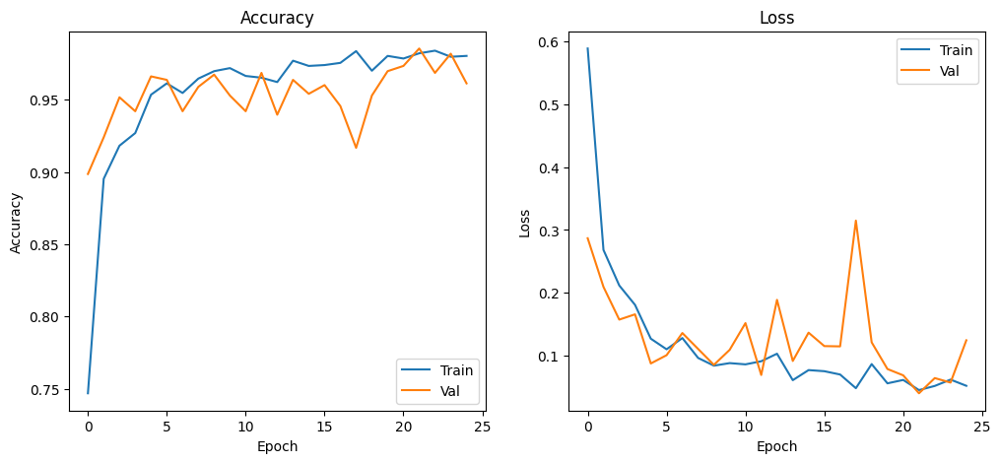

In [ ]:
history = model.fit(X_train_reshaped, y_train, epochs=25, batch_size=32,
                    validation_data=(X_test_reshaped, y_test))

# Evaluasi Model dan Plotting
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()



26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Classification Report:
              precision    recall  f1-score   support

        Coal       0.00      0.00      0.00         1
        Sand       0.99      0.98      0.98       157
  Shaly Sand       0.98      0.99      0.98       160
 Sandy Shale       0.91      1.00      0.95       280
       Shale       1.00      0.89      0.94       231

    accuracy                           0.96       829
   macro avg       0.78      0.77      0.77       829
weighted avg       0.96      0.96      0.96       829


Confusion Matrix:


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


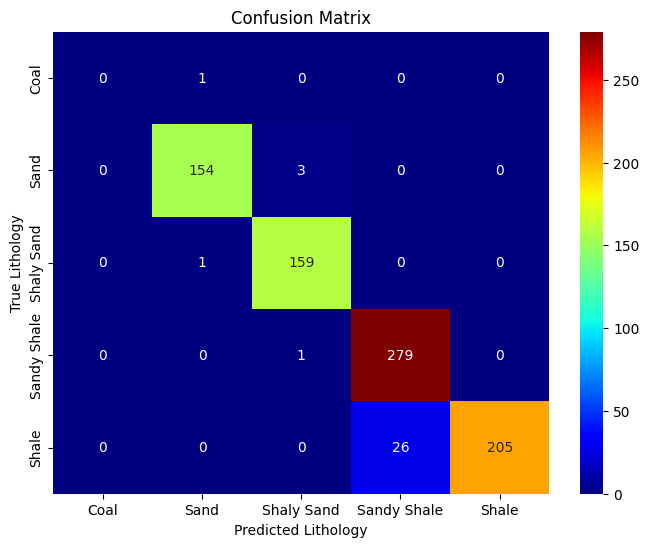

In [ ]:
y_pred = model.predict(X_test_reshaped)
y_pred_classes = np.argmax(y_pred, axis=1)

print("Classification Report:")
print(classification_report(y_test, y_pred_classes, target_names=lithology_to_code.keys())) # Gunakan label litologi asli

print("\nConfusion Matrix:")
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred_classes), annot=True, fmt='d', cmap='jet',
            xticklabels=lithology_to_code.keys(), yticklabels=lithology_to_code.keys())
plt.xlabel('Predicted Lithology')
plt.ylabel('True Lithology')
plt.title('Confusion Matrix')
plt.show()


# Define colormap and norm for plotting
lithology_colors_plot = ['black', 'yellow', 'orange', 'saddlebrown', 'green']
lithology_labels_plot = ['Coal', 'Sand', 'Shaly Sand', 'Sandy Shale', 'Shale']
cmap_plot = ListedColormap(lithology_colors_plot)
bounds_plot = np.arange(len(lithology_labels_plot) + 1)
norm_plot = BoundaryNorm(bounds_plot, cmap_plot.N)

In [ ]:
# Plotting Log Data dan Klasifikasi

# Function to plot logs and classification
def plot_logs_and_classification(X_data, depth_data, y_true=None, y_pred_classes=None, title_suffix="", lithology_to_code=None):
    num_features = X_data.shape[1]
    num_plots = num_features + 1 # Features + Classification track

    fig, axs = plt.subplots(1, num_plots, figsize=(3 * num_plots, 10), sharey=True)

    # Plot Log Tracks
    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    # Assign specific colors for consistency
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']

    for i in range(num_features):
        axs[i].plot(X_data[:, i], depth_data, color=log_colors[i], label=log_labels[i])
        axs[i].invert_yaxis()
        axs[i].set_title(log_labels[i])
        axs[i].set_xlabel(log_labels[i])
        if i == 0: # Only set ylabel for the first track
            axs[i].set_ylabel('Depth')
        axs[i].legend()
        axs[i].grid(True, linestyle='--', alpha=0.5)
        if log_labels[i] == 'Resistivity': # Set xscale for Resistivity
            axs[i].set_xscale('log')


    # Plot Classification Track
    # Use the globally defined colormap and norm
    cmap = cmap_plot
    norm = norm_plot
    lithology_labels = lithology_labels_plot
    num_classes = len(lithology_labels)

    # Define code_to_lithology mapping within the function or pass it
    if lithology_to_code is None:
         code_to_lithology = {i: label for i, label in enumerate(lithology_labels)}
    else:
         # Ensure lithology_labels and lithology_to_code are consistent
         # Create code_to_lithology from the passed dictionary
         code_to_lithology = {v: k for k, v in lithology_to_code.items()}
         # Reorder lithology_labels based on the sorted keys of lithology_to_code
         sorted_codes = sorted(lithology_to_code.values())
         lithology_labels = [k for k, v in sorted(lithology_to_code.items(), key=lambda item: item[1])]


    # Ensure depth_data is sorted for pcolormesh
    sort_indices = np.argsort(depth_data)
    depth_data_sorted = depth_data[sort_indices]

    if y_pred_classes is not None:
        classification_data = y_pred_classes[sort_indices].reshape(-1, 1) # Sort predictions by depth
        title = f'Predicted Lithology {title_suffix}'
    elif y_true is not None:
        classification_data = y_true[sort_indices].reshape(-1, 1) # Sort true values by depth
        title = f'True Lithology {title_suffix}'
    else:
        title = 'Classification'
        classification_data = np.zeros((len(depth_data_sorted), 1)) # Placeholder if no classification data


    # Create meshgrid for pcolormesh
    dummy_x = np.array([0, 1])
    # Create y-vertices by adding a boundary point at the end
    if len(depth_data_sorted) > 1:
        depth_boundaries = np.concatenate([depth_data_sorted[0:1] - (depth_data_sorted[1] - depth_data_sorted[0])/2,
                                            (depth_data_sorted[:-1] + depth_data_sorted[1:]) / 2,
                                            depth_data_sorted[-1:] + (depth_data_sorted[-1] - depth_data_sorted[-2])/2])
    else: # Handle case with only one data point
         depth_boundaries = np.array([depth_data_sorted[0] - 0.5, depth_data_sorted[0] + 0.5])


    X_mesh, Y_mesh = np.meshgrid(dummy_x, depth_boundaries)


    # Create the pcolormesh plot and store the returned object
    mesh = axs[num_features].pcolormesh(X_mesh, Y_mesh, classification_data, cmap=cmap, norm=norm, shading='flat')

    axs[num_features].set_title(title)
    axs[num_features].set_xlabel('Lithology')
    axs[num_features].set_xticks([]) # Hide x-axis ticks

    # Add a colorbar using the object returned by pcolormesh
    cbar = fig.colorbar(mesh, ax=axs[num_features], ticks=np.arange(num_classes) + 0.5)
    cbar.ax.set_yticklabels(lithology_labels)


    axs[num_features].invert_yaxis()
    axs[num_features].grid(False)
    plt.tight_layout()
    plt.show()



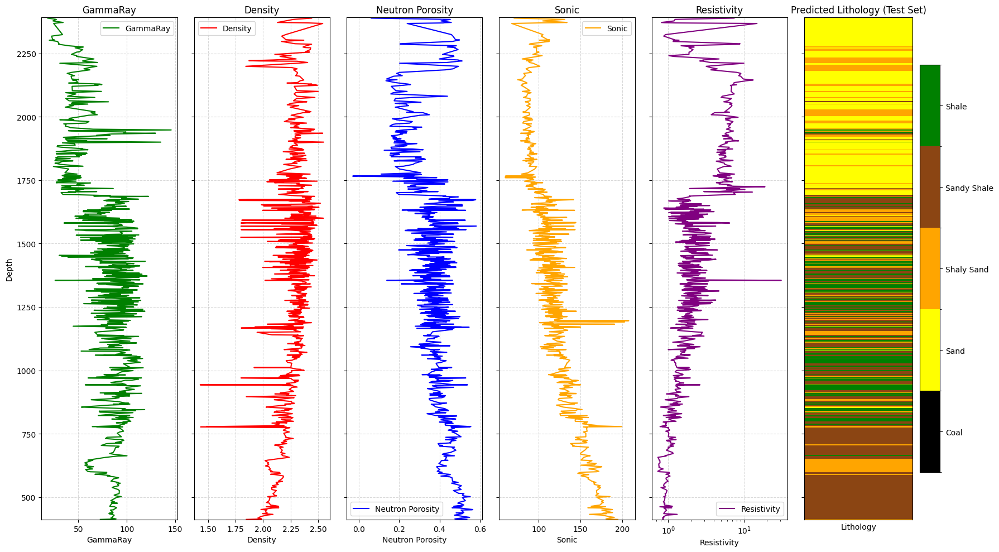

130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


NameError: name 'aigabung_np' is not defined

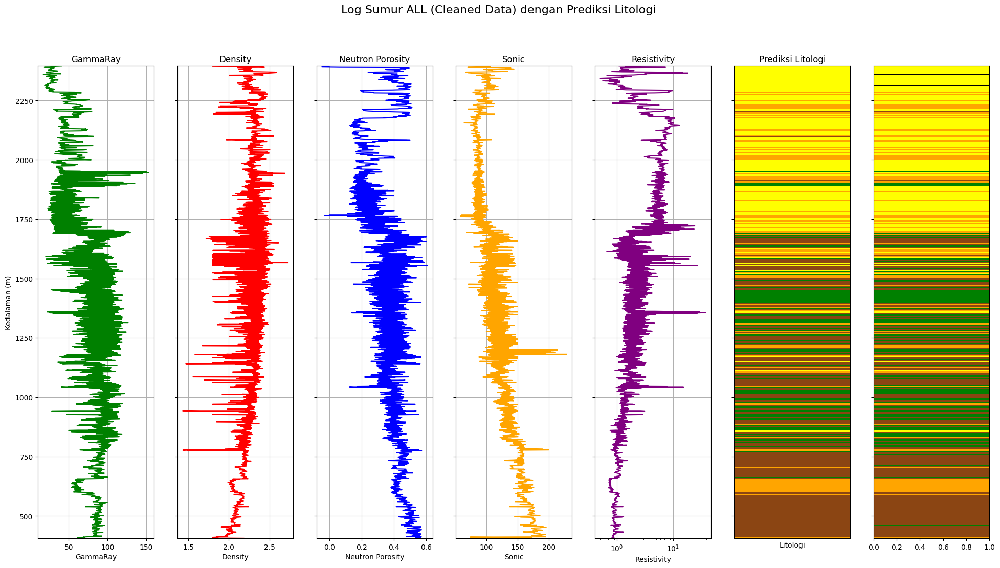

In [ ]:
from matplotlib.patches import Patch # Added Patch import
depthcnn = np.linspace (0,3333,3333)
# Plotting results for the test set (predicted vs true if available)
# Need to use the unscaled X_test for plotting log values, but sorted by depth
# Sort X_test by depth_test
sort_indices_test = np.argsort(depth_test)
X_test_sorted = X_test[sort_indices_test]
depth_test_sorted = depth_test[sort_indices_test]
y_test_sorted = y_test[sort_indices_test]
y_pred_classes_sorted = y_pred_classes[sort_indices_test]


plot_logs_and_classification(X_test_sorted, depth_test_sorted, y_true=y_test_sorted, y_pred_classes=y_pred_classes_sorted, title_suffix="(Test Set)", lithology_to_code=lithology_to_code)


# Predict on the entire cleaned dataset for a full log visualization
# Assuming Df_clean contains the features and DEPT after dropping NaNs
if 'DEPT' in Df_clean.columns:
    X_full_cleaned = Df_clean[feature_cols].values
    depth_full_cleaned = Df_clean['DEPT'].values
    y_full_cleaned_true = Df_clean[target_col].values

    # Scale the full cleaned data
    X_full_cleaned_scaled = scaler.transform(X_full_cleaned) # Use the scaler fitted on training data
    X_full_cleaned_reshaped = X_full_cleaned_scaled.reshape((X_full_cleaned_scaled.shape[0], X_full_cleaned_scaled.shape[1], 1))

    # Predict on the full cleaned data
    y_pred_full_cleaned_prob = model.predict(X_full_cleaned_reshaped)
    y_pred_full_cleaned_classes = np.argmax(y_pred_full_cleaned_prob, axis=1)

    # Plotting the full cleaned data log with predicted and true lithology
    # Sort data by depth for plotting
    sort_indices_full = np.argsort(depth_full_cleaned)
    X_full_cleaned_sorted = X_full_cleaned[sort_indices_full]
    depth_full_cleaned_sorted = depth_full_cleaned[sort_indices_full]
    y_full_cleaned_true_sorted = y_full_cleaned_true[sort_indices_full]
    y_pred_full_cleaned_classes_sorted = y_pred_full_cleaned_classes[sort_indices_full]


    fig_full, axs_full = plt.subplots(1, 7, figsize=(24, 12), sharey=True) # Added a column for True Lithology
    fig_full.suptitle('Log Sumur ALL (Cleaned Data) dengan Prediksi Litologi', fontsize=16)

    # Plot Log Tracks
    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']
    for i in range(X_full_cleaned_sorted.shape[1]):
        axs_full[i].plot(X_full_cleaned_sorted[:, i], depth_full_cleaned_sorted, color=log_colors[i]) # Assign colors
        axs_full[i].set_title(log_labels[i])
        axs_full[i].set_xlabel(log_labels[i])
        if i == 0: # Only set ylabel for the first track
            axs_full[i].set_ylabel('Kedalaman (m)')
        axs_full[i].invert_yaxis()
        axs_full[i].grid(True)
        if log_labels[i] == 'Resistivity': # Set xscale for Resistivity
            axs_full[i].set_xscale('log')


    # Plot Predicted Lithology Column
    # Use pcolormesh for colored bands
    # Create a dummy X grid and the depth grid for pcolormesh
    dummy_x_full = np.array([0, 1])
    if len(depth_full_cleaned_sorted) > 1:
        depth_boundaries_full_plot = np.concatenate([depth_full_cleaned_sorted[0:1] - (depth_full_cleaned_sorted[1] - depth_full_cleaned_sorted[0])/2,
                                                    (depth_full_cleaned_sorted[:-1] + depth_full_cleaned_sorted[1:]) / 2,
                                                    depth_full_cleaned_sorted[-1:] + (depth_full_cleaned_sorted[-1] - depth_full_cleaned_sorted[-2])/2])
    else: # Handle case with only one data point
         depth_boundaries_full_plot = np.array([depth_full_cleaned_sorted[0] - 0.5, depth_full_cleaned_sorted[0] + 0.5])


    X_mesh_full_pred, Y_mesh_full_pred = np.meshgrid(dummy_x_full, depth_boundaries_full_plot)
    C_mesh_full_pred = y_pred_full_cleaned_classes_sorted.reshape(-1, 1)


    mesh_full_pred = axs_full[5].pcolormesh(X_mesh_full_pred, Y_mesh_full_pred, C_mesh_full_pred, cmap=cmap_plot, norm=norm_plot, shading='flat')


    axs_full[5].set_title('Prediksi Litologi')
    axs_full[5].set_xlabel('Litologi')
    axs_full[5].set_xticks([]) # Hide X ticks
    axs_full[5].invert_yaxis()
    axs_full[5].grid(False) # Turn off grid in lithology plot
    # Plot True Lithology Column for comparison
    # Use pcolormesh for colored bands for the true lithology
    # Use the same depth boundaries as the predicted lithology
    C_mesh_full_true = y_full_cleaned_true_sorted.reshape(-1, 1)

    mesh_full_true = axs_full[6].pcolormesh(X_mesh_full_pred, Y_mesh_full_pred, C_mesh_full_true, cmap=cmap_plot, norm=norm_plot, shading='flat')
    plt.plot((aigabung_np/30000) + 0.5, depthcnn, '-r')
    # xaig = np.zeros((len(L), 1), float) + 1.5
    # plt.plot(aigabung, xaig, '-r')
    # plt.plot (aimb, xaig, '-m')
    axs_full[6].set_title('Litologi Sebenarnya')
    axs_full[6].set_xlabel('Litologi')
    axs_full[6].set_xticks([]) # Hide X ticks
    axs_full[6].invert_yaxis()
    axs_full[6].grid(False) # Turn off grid in lithology plot

    # Create a discrete legend
    legend_elements_full = [Patch(facecolor=color, label=label) for label, color in zip(lithology_labels_plot, lithology_colors_plot)]
    # Add colorbar to the true lithology plot
    cbar_full_true = fig_full.colorbar(mesh_full_true, ax=axs_full[6], ticks=np.arange(len(lithology_labels_plot)) + 0.5)
    cbar_full_true.ax.set_yticklabels(lithology_labels_plot)

    axs_full[6].legend(handles=legend_elements_full, loc='upper right', title='Litologi')


    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

else:
    print("Skipping full log plot as 'DEPT' column is not available in cleaned data.")

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# Assume 'aigabung_np' is a NumPy array containing the values you want to plot
# and 'depthcnn' is a NumPy array containing the corresponding depth values for 'aigabung_np'.
# Ensure 'aigabung_np' and 'depthcnn' are defined before this plotting section.
# For example, if 'aigabung_np' is loaded from a file and corresponds to a specific depth range:
# aigabung_np = np.genfromtxt('/content/aicnntestcoba.txt')
# depthcnn = np.linspace(start_depth, end_depth, len(aigabung_np)) # Replace start_depth and end_depth

# Find the intersection of depths between the full cleaned data and aigabung_np
# This is important to plot aigabung_np on the correct depth scale.
# We will plot aigabung_np on the 'True Lithology' track for visual comparison.

# Assuming depth_full_cleaned_sorted is the sorted depth array from the cleaned full data
# and aigabung_np and depthcnn are defined and have the same length.

# Check if depthcnn is defined and has the same length as aigabung_np
if 'depthcnn' in locals() and 'aigabung_np' in locals() and len(depthcnn) == len(aigabung_np):

    # Find the indices in depth_full_cleaned_sorted that are closest to the depths in depthcnn
    # This is a simple way to align the two depth scales if they don't perfectly match.
    # A more robust approach might involve resampling one of the depth arrays.
    closest_indices_in_full_depth = np.searchsorted(depth_full_cleaned_sorted, depthcnn)
    # Ensure indices are within bounds
    closest_indices_in_full_depth = np.clip(closest_indices_in_full_depth, 0, len(depth_full_cleaned_sorted) - 1)
    aligned_aigabung_depth = depth_full_cleaned_sorted[closest_indices_in_full_depth]

    # Normalize aigabung_np values for plotting on the lithology track (0 to 1 range)
    # Assuming aigabung_np values are positive and you want to map them to the track width.
    # You might need to adjust the normalization based on the expected range of aigabung_np.
    # A simple normalization to 0-1:
    min_aigabung = np.min(aigabung_np)
    max_aigabung = np.max(aigabung_np)
    if max_aigabung > min_aigabung:
        normalized_aigabung = (aigabung_np - min_aigabung) / (max_aigabung - min_aigabung)
    else:
        normalized_aigabung = np.zeros_like(aigabung_np) # Avoid division by zero

    # Define the x-position for plotting aigabung_np on the lithology track.
    # The lithology track width is effectively 1 (from 0 to 1 in pcolormesh).
    # We can plot aigabung_np somewhere within this range, e.g., centered at 0.5 or offset slightly.
    # Let's plot it starting from x=0 and scaling to 1.
    x_position_aigabung = normalized_aigabung

    # Plot aigabung_np on the True Lithology track (axs_full[6])
    axs_full[6].plot(x_position_aigabung, aligned_aigabung_depth, color='red', linestyle='-', label='AIGabung')
    axs_full[6].legend(loc='upper right') # Add legend to the true lithology track

else:
    print("Skipping plotting of aigabung_np: aigabung_np or depthcnn not defined, or lengths mismatch.")


plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


Skipping plotting of aigabung_np: aigabung_np or depthcnn not defined, or lengths mismatch.


<Figure size 640x480 with 0 Axes>

In [ ]:
df1_features = df1[['GR', 'DEN', 'NPHI', 'DT', 'RILD']]
df2_features = df2[['GR', 'DEN', 'NPHI', 'DT', 'RILD']]
df3_features = df3[['GR', 'DEN', 'NPHI', 'DT', 'RILD']]
df6_features = df6[['GR', 'DEN', 'NPHI', 'DT', 'RILD']]

# Menghapus baris dengan nilai NaN (missing values)
df1_cleaned = df1_features.dropna()
df2_cleaned = df2_features.dropna()
df3_cleaned = df3_features.dropna()
df6_cleaned = df6_features.dropna()

# Mengubah DataFrame yang sudah bersih menjadi array NumPy
DF1 = np.array(df1_cleaned)
DF2 = np.array(df2_cleaned)
DF3 = np.array(df3_cleaned)
DF6 = np.array(df6_cleaned)

print("Shape of DF1:", DF1.shape)
print("Shape of DF2:", DF2.shape)
print("Shape of DF3:", DF3.shape)
print("Shape of DF6:", DF6.shape)


Shape of DF1: (1989, 5)
Shape of DF2: (791, 5)
Shape of DF3: (605, 5)
Shape of DF6: (759, 5)


63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step

DataFrame with predicted lithology for all wells:
   DEPT   A  AI  BH_FL_BS  BS  CAL  CALI  COAL  DEN  DT  ...  SP  SP1  \
0   0.0 NaN NaN       NaN NaN  NaN   NaN   NaN  NaN NaN  ... NaN  NaN   
1   1.0 NaN NaN       NaN NaN  NaN   NaN   NaN  NaN NaN  ... NaN  NaN   
2   2.0 NaN NaN       NaN NaN  NaN   NaN   NaN  NaN NaN  ... NaN  NaN   
3   3.0 NaN NaN       NaN NaN  NaN   NaN   NaN  NaN NaN  ... NaN  NaN   
4   4.0 NaN NaN       NaN NaN  NaN   NaN   NaN  NaN NaN  ... NaN  NaN   

   SWE_INDO  TEMP  VSH_GR  VSH_GRC  predicted_kode_lito  predicted_lithology  \
0       NaN   NaN     NaN      NaN                  NaN                  NaN   
1       NaN   NaN     NaN      NaN                  NaN                  NaN   
2       NaN   NaN     NaN      NaN                  NaN                  NaN   
3       NaN   NaN     NaN      Na

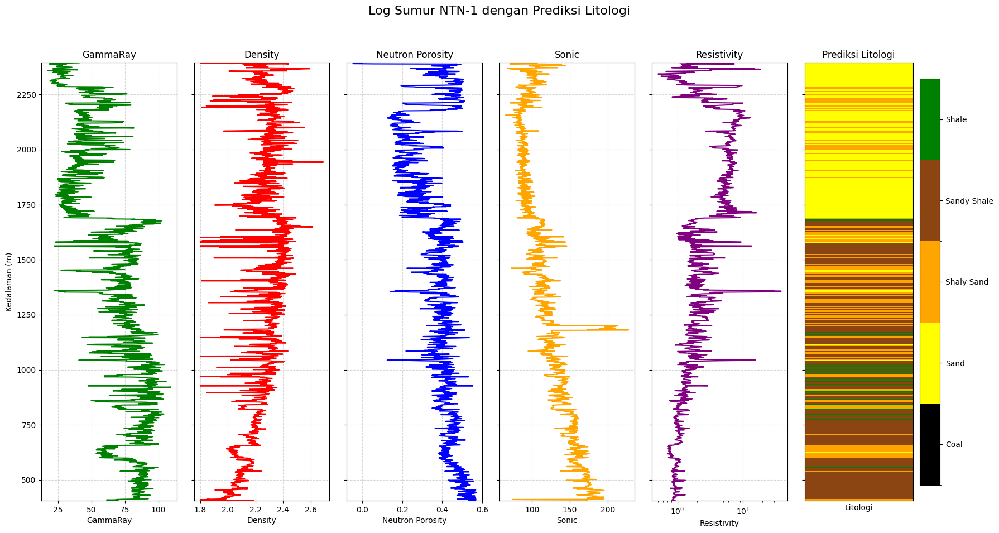

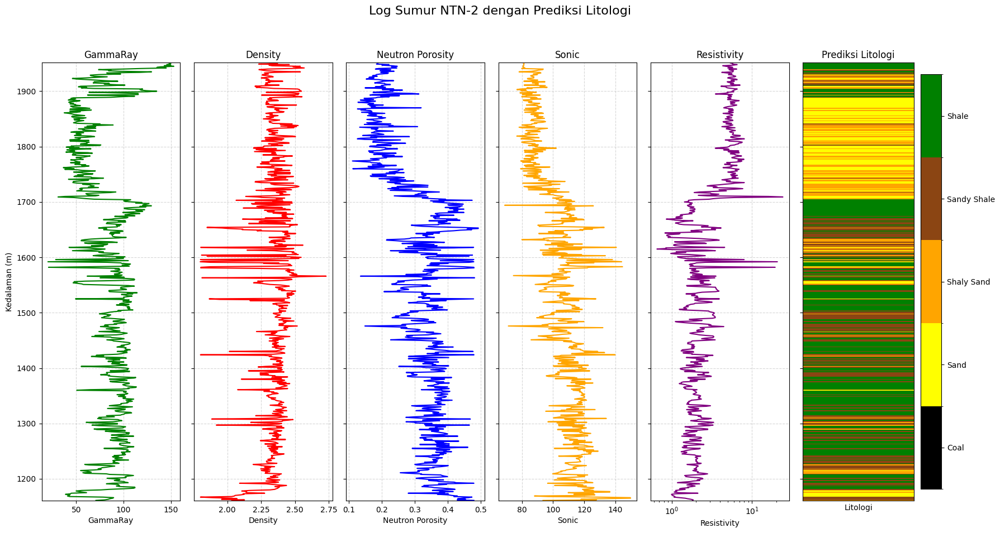

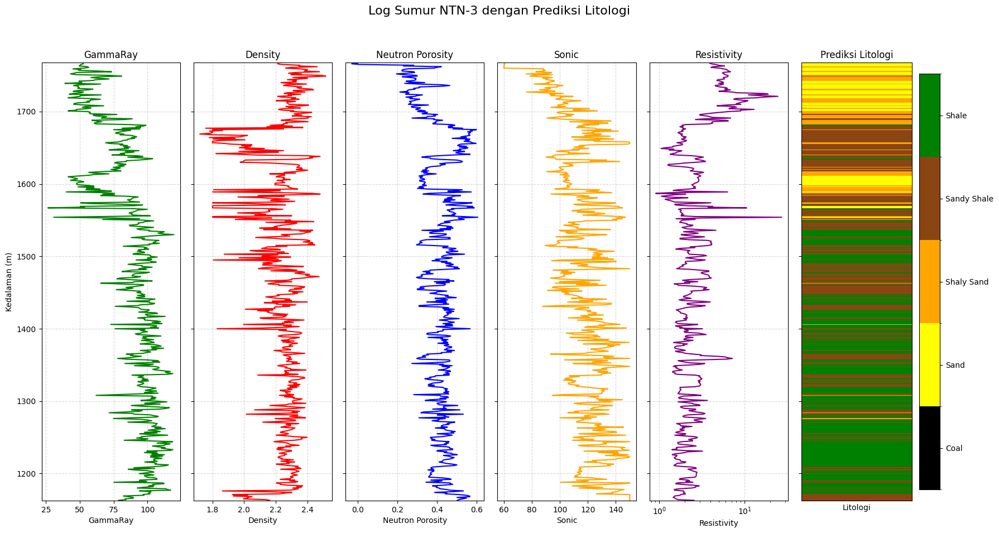

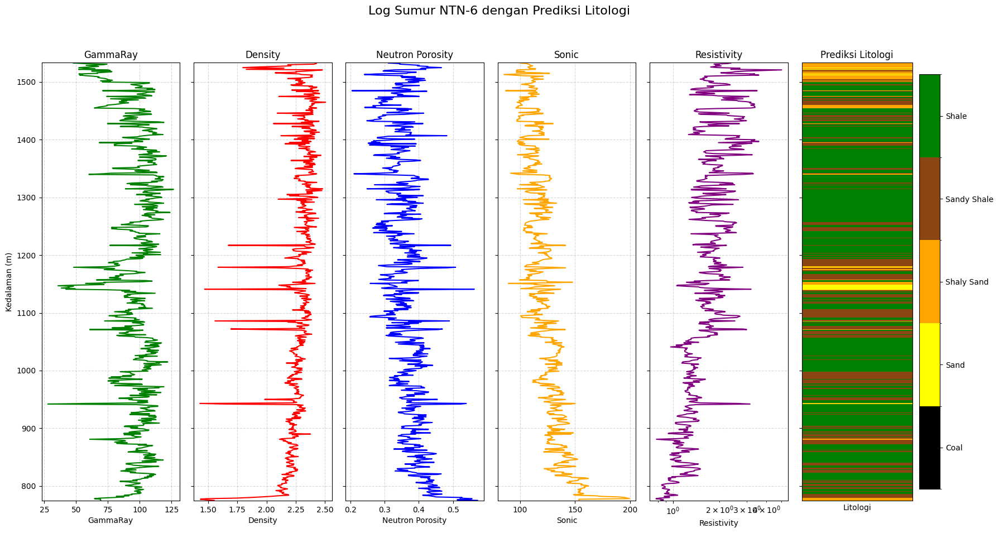

In [ ]:
# Predict lithology for each well separately using the trained model

# Function to predict lithology for a single well DataFrame
def predict_well_lithology(df_well, model, scaler, feature_cols, lithology_labels_plot):
    # Select features and drop NaNs
    df_well_cleaned = df_well[feature_cols].dropna()

    if df_well_cleaned.empty:
        print(f"Warning: No valid data found in the well for prediction.")
        return pd.DataFrame(), None # Return empty DataFrame and None for predictions

    # Store original index (depth) for plotting
    original_index = df_well_cleaned.index.values

    # Scale features
    X_well_scaled = scaler.transform(df_well_cleaned.values)

    # Reshape for CNN input
    X_well_reshaped = X_well_scaled.reshape((X_well_scaled.shape[0], X_well_scaled.shape[1], 1))

    # Predict probabilities
    y_pred_well_prob = model.predict(X_well_reshaped)

    # Get predicted class (index)
    y_pred_well_classes = np.argmax(y_pred_well_prob, axis=1)

    # Create a DataFrame with original index and predicted lithology code
    predicted_df = pd.DataFrame({
        'predicted_kode_lito': y_pred_well_classes
    }, index=original_index)

    # Map code back to lithology label
    predicted_df['predicted_lithology'] = predicted_df['predicted_kode_lito'].apply(
        lambda x: lithology_labels_plot[x] if 0 <= x < len(lithology_labels_plot) else 'Unknown'
    )

    # Merge predicted lithology back to the original well DataFrame based on index
    df_well_with_pred = df_well.copy()
    # Use merge_asof if depth is not perfectly aligned, otherwise merge on index or a depth column
    # Assuming the index of df_well_cleaned corresponds to the index of df_well where features exist
    df_well_with_pred = df_well_with_pred.merge(
        predicted_df[['predicted_kode_lito', 'predicted_lithology']],
        left_index=True,
        right_index=True,
        how='left' # Keep all rows from original df_well
    )

    return df_well_with_pred, y_pred_well_classes # Return DataFrame with predictions and raw predictions


# Predict and store results for each well
df1_with_pred, y_pred_classes_df1 = predict_well_lithology(df1, model, scaler, feature_cols, lithology_labels_plot)
df2_with_pred, y_pred_classes_df2 = predict_well_lithology(df2, model, scaler, feature_cols, lithology_labels_plot)
df3_with_pred, y_pred_classes_df3 = predict_well_lithology(df3, model, scaler, feature_cols, lithology_labels_plot)
df6_with_pred, y_pred_classes_df6 = predict_well_lithology(df6, model, scaler, feature_cols, lithology_labels_plot)

# Concatenate the results back into a single DataFrame if needed, or process each well separately
df_all_with_pred = pd.concat([df1_with_pred, df2_with_pred, df3_with_pred, df6_with_pred], ignore_index=True)

print("\nDataFrame with predicted lithology for all wells:")
print(df_all_with_pred.head())

# Optionally, save the results to new CSV files for each well or the combined DataFrame
df_all_with_pred.to_csv('df_all_with_predictions.csv', index=False)
print("\nPrediction results saved to 'df_all_with_predictions.csv'")

# Function to plot logs and predicted lithology for a single well
def plot_well_prediction(df_well_with_pred, well_name, feature_cols, lithology_labels_plot):
    # Ensure 'DEPT' and prediction columns exist
    if 'DEPT' not in df_well_with_pred.columns or 'predicted_kode_lito' not in df_well_with_pred.columns:
        print(f"Skipping plot for {well_name}: Required columns ('DEPT', 'predicted_kode_lito') not found.")
        return

    # Drop rows where features or prediction are NaN to get clean data for plotting
    # Consider dropping NaNs based on feature_cols and the predicted column
    cols_to_check = feature_cols + ['predicted_kode_lito', 'DEPT']
    df_plot = df_well_with_pred[cols_to_check].dropna()

    if df_plot.empty:
        print(f"No valid data for plotting in {well_name} after dropping NaNs.")
        return

    # Sort by depth for correct plotting
    df_plot = df_plot.sort_values(by='DEPT')

    depth_data = df_plot['DEPT'].values
    X_data = df_plot[feature_cols].values
    y_pred_classes = df_plot['predicted_kode_lito'].values

    num_features = X_data.shape[1]
    num_plots = num_features + 1 # Features + Classification track

    fig, axs = plt.subplots(1, num_plots, figsize=(3 * num_plots, 10), sharey=True)
    fig.suptitle(f'Log Sumur {well_name} dengan Prediksi Litologi', fontsize=16)

    # Plot Log Tracks
    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']

    for i in range(num_features):
        axs[i].plot(X_data[:, i], depth_data, color=log_colors[i], label=feature_cols[i]) # Use feature_cols for label
        axs[i].invert_yaxis()
        axs[i].set_title(log_labels[i])
        axs[i].set_xlabel(log_labels[i])
        if i == 0: # Only set ylabel for the first track
            axs[i].set_ylabel('Kedalaman (m)')
        axs[i].grid(True, linestyle='--', alpha=0.5)
        if log_labels[i] == 'Resistivity':
            axs[i].set_xscale('log')


    # Plot Predicted Lithology Column
    cmap = cmap_plot
    norm = norm_plot
    lithology_labels = lithology_labels_plot
    num_classes = len(lithology_labels)

    # Create meshgrid for pcolormesh
    dummy_x = np.array([0, 1])
    if len(depth_data) > 1:
        depth_boundaries_plot = np.concatenate([depth_data[0:1] - (depth_data[1] - depth_data[0])/2,
                                            (depth_data[:-1] + depth_data[1:]) / 2,
                                            depth_data[-1:] + (depth_data[-1] - depth_data[-2])/2])
    else: # Handle case with only one data point
         depth_boundaries_plot = np.array([depth_data[0] - 0.5, depth_data[0] + 0.5])

    X_mesh, Y_mesh = np.meshgrid(dummy_x, depth_boundaries_plot)
    C_mesh = y_pred_classes.reshape(-1, 1)

    mesh = axs[num_features].pcolormesh(X_mesh, Y_mesh, C_mesh, cmap=cmap, norm=norm, shading='flat')

    axs[num_features].set_title('Prediksi Litologi')
    axs[num_features].set_xlabel('Litologi')
    axs[num_features].set_xticks([]) # Hide x-axis ticks
    axs[num_features].invert_yaxis()
    axs[num_features].grid(False)

    # Add a colorbar
    cbar = fig.colorbar(mesh, ax=axs[num_features], ticks=np.arange(num_classes) + 0.5)
    cbar.ax.set_yticklabels(lithology_labels)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to make room for suptitle
    plt.show()


# Plot results for each well
plot_well_prediction(df1_with_pred, "NTN-1", feature_cols, lithology_labels_plot)
plot_well_prediction(df2_with_pred, "NTN-2", feature_cols, lithology_labels_plot)
plot_well_prediction(df3_with_pred, "NTN-3", feature_cols, lithology_labels_plot)
plot_well_prediction(df6_with_pred, "NTN-6", feature_cols, lithology_labels_plot)



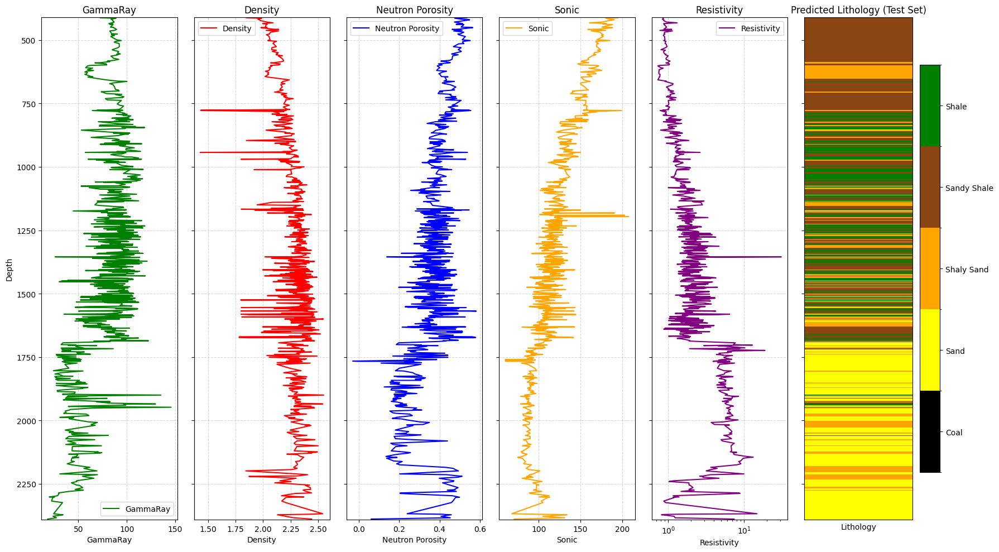

130/130 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step


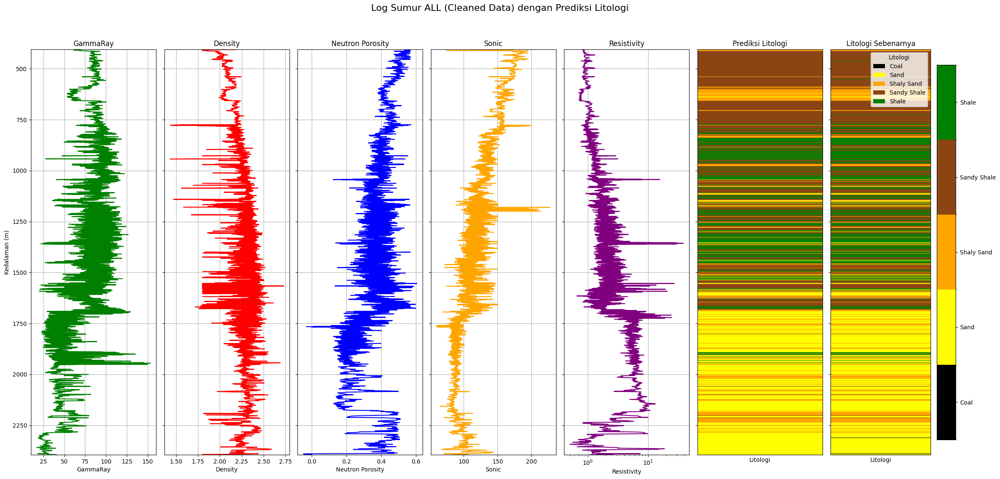

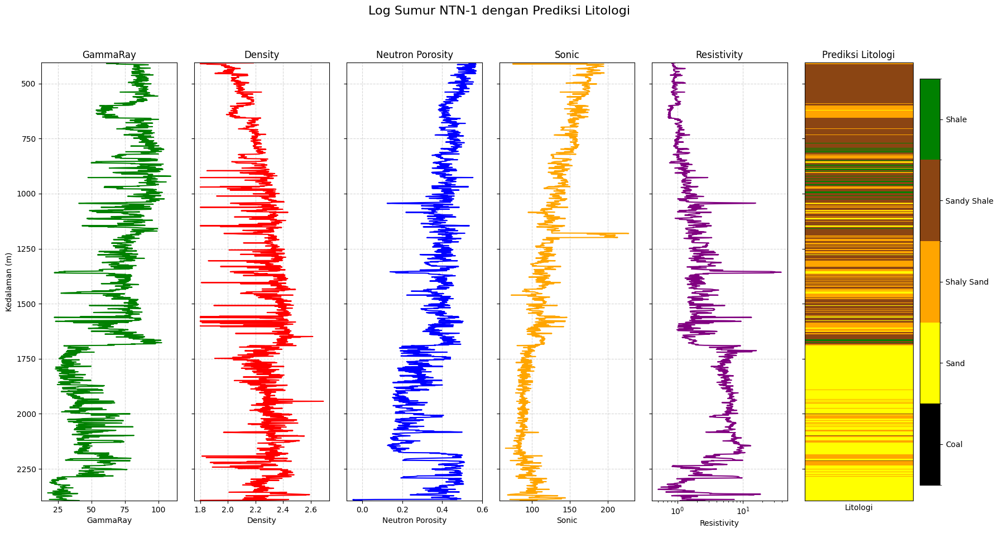

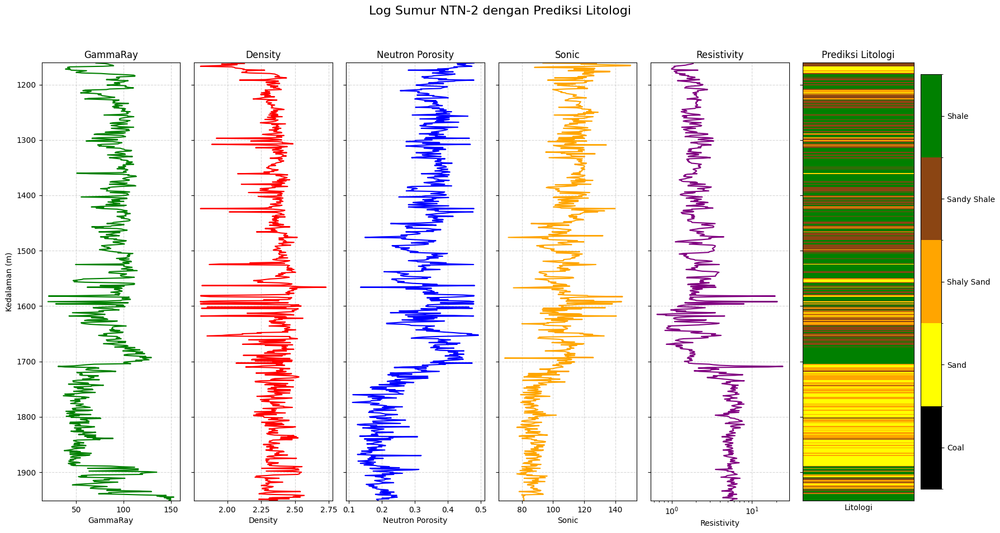

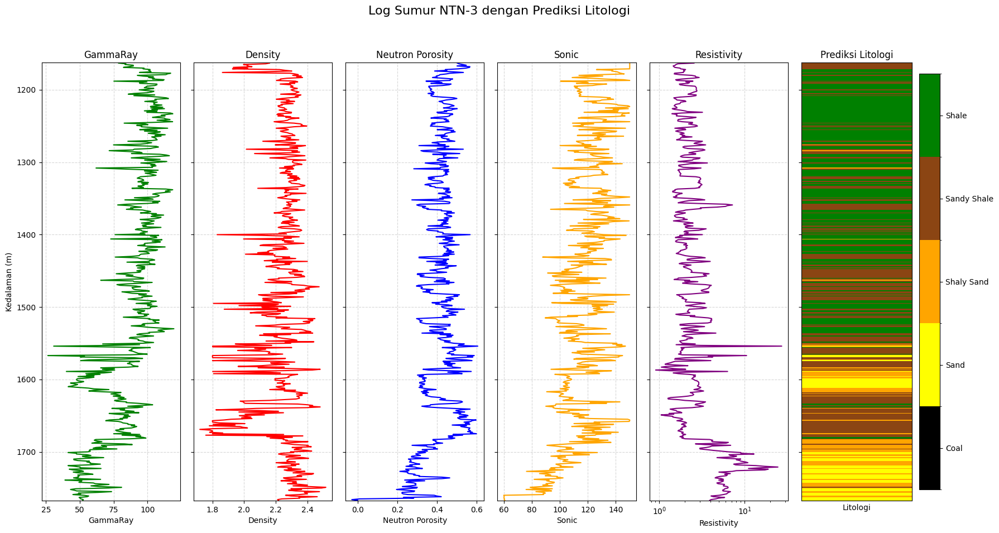

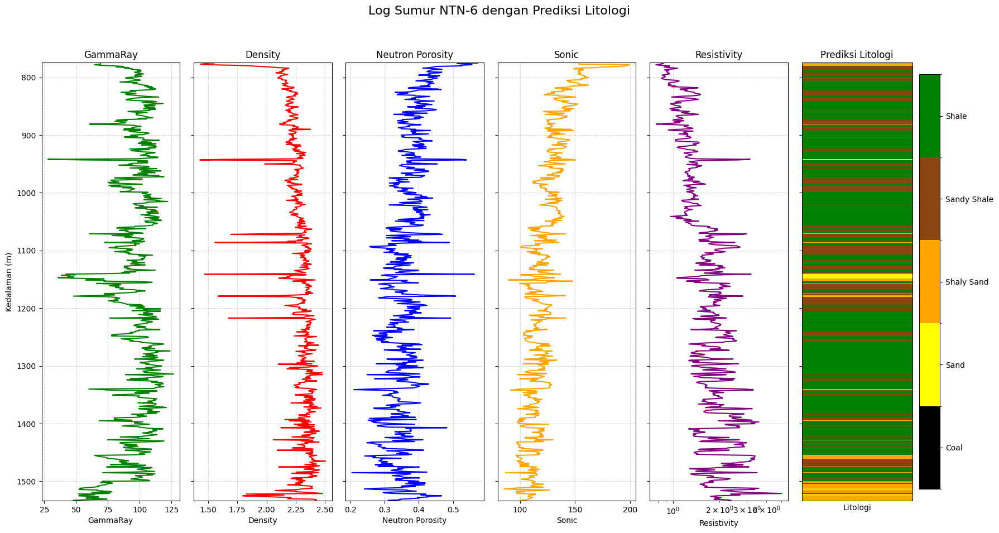

In [ ]:
# Function to plot logs and classification
def plot_logs_and_classification(X_data, depth_data, y_true=None, y_pred_classes=None, title_suffix="", lithology_to_code=None):
    num_features = X_data.shape[1]
    num_plots = num_features + 1 # Features + Classification track

    fig, axs = plt.subplots(1, num_plots, figsize=(3 * num_plots, 10), sharey=True)

    # Plot Log Tracks
    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    # Assign specific colors for consistency
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']

    for i in range(num_features):
        axs[i].plot(X_data[:, i], depth_data, color=log_colors[i], label=log_labels[i])
        #axs[i].invert_yaxis() # Removed invert_yaxis here
        axs[i].set_title(log_labels[i])
        axs[i].set_xlabel(log_labels[i])
        if i == 0: # Only set ylabel for the first track
            axs[i].set_ylabel('Depth')
        axs[i].legend()
        axs[i].grid(True, linestyle='--', alpha=0.5)
        if log_labels[i] == 'Resistivity': # Set xscale for Resistivity
            axs[i].set_xscale('log')


    # Plot Classification Track
    # Use the globally defined colormap and norm
    cmap = cmap_plot
    norm = norm_plot
    lithology_labels = lithology_labels_plot
    num_classes = len(lithology_labels)

    # Define code_to_lithology mapping within the function or pass it
    if lithology_to_code is None:
         code_to_lithology = {i: label for i, label in enumerate(lithology_labels)}
    else:
         # Ensure lithology_labels and lithology_to_code are consistent
         # Create code_to_lithology from the passed dictionary
         code_to_lithology = {v: k for k, v in lithology_to_code.items()}
         # Reorder lithology_labels based on the sorted keys of lithology_to_code
         sorted_codes = sorted(lithology_to_code.values())
         lithology_labels = [k for k, v in sorted(lithology_to_code.items(), key=lambda item: item[1])]


    # Ensure depth_data is sorted for pcolormesh
    sort_indices = np.argsort(depth_data)
    depth_data_sorted = depth_data[sort_indices]

    if y_pred_classes is not None:
        classification_data = y_pred_classes[sort_indices].reshape(-1, 1) # Sort predictions by depth
        title = f'Predicted Lithology {title_suffix}'
    elif y_true is not None:
        classification_data = y_true[sort_indices].reshape(-1, 1) # Sort true values by depth
        title = f'True Lithology {title_suffix}'
    else:
        title = 'Classification'
        classification_data = np.zeros((len(depth_data_sorted), 1)) # Placeholder if no classification data


    # Create meshgrid for pcolormesh
    dummy_x = np.array([0, 1])
    # Create y-vertices by adding a boundary point at the end
    if len(depth_data_sorted) > 1:
        depth_boundaries = np.concatenate([depth_data_sorted[0:1] - (depth_data_sorted[1] - depth_data_sorted[0])/2,
                                            (depth_data_sorted[:-1] + depth_data_sorted[1:]) / 2,
                                            depth_data_sorted[-1:] + (depth_data_sorted[-1] - depth_data_sorted[-2])/2])
    else: # Handle case with only one data point
         depth_boundaries = np.array([depth_data_sorted[0] - 0.5, depth_data_sorted[0] + 0.5])


    X_mesh, Y_mesh = np.meshgrid(dummy_x, depth_boundaries)


    # Create the pcolormesh plot and store the returned object
    mesh = axs[num_features].pcolormesh(X_mesh, Y_mesh, classification_data, cmap=cmap, norm=norm, shading='flat')

    axs[num_features].set_title(title)
    axs[num_features].set_xlabel('Lithology')
    axs[num_features].set_xticks([]) # Hide x-axis ticks

    # Add a colorbar using the object returned by pcolormesh
    cbar = fig.colorbar(mesh, ax=axs[num_features], ticks=np.arange(num_classes) + 0.5)
    cbar.ax.set_yticklabels(lithology_labels)


    axs[num_features].invert_yaxis() # Added invert_yaxis here
    axs[num_features].grid(False)
    plt.tight_layout()
    plt.show()



# Plotting results for the test set (predicted vs true if available)
# Need to use the unscaled X_test for plotting log values, but sorted by depth
# Sort X_test by depth_test
sort_indices_test = np.argsort(depth_test)
X_test_sorted = X_test[sort_indices_test]
depth_test_sorted = depth_test[sort_indices_test]
y_test_sorted = y_test[sort_indices_test]
y_pred_classes_sorted = y_pred_classes[sort_indices_test]


plot_logs_and_classification(X_test_sorted, depth_test_sorted, y_true=y_test_sorted, y_pred_classes=y_pred_classes_sorted, title_suffix="(Test Set)", lithology_to_code=lithology_to_code)


# Predict on the entire cleaned dataset for a full log visualization
# Assuming Df_clean contains the features and DEPT after dropping NaNs
if 'DEPT' in Df_clean.columns:
    X_full_cleaned = Df_clean[feature_cols].values
    depth_full_cleaned = Df_clean['DEPT'].values
    y_full_cleaned_true = Df_clean[target_col].values

    # Scale the full cleaned data
    X_full_cleaned_scaled = scaler.transform(X_full_cleaned) # Use the scaler fitted on training data
    X_full_cleaned_reshaped = X_full_cleaned_scaled.reshape((X_full_cleaned_scaled.shape[0], X_full_cleaned_scaled.shape[1], 1))

    # Predict on the full cleaned data
    y_pred_full_cleaned_prob = model.predict(X_full_cleaned_reshaped)
    y_pred_full_cleaned_classes = np.argmax(y_pred_full_cleaned_prob, axis=1)

    # Plotting the full cleaned data log with predicted and true lithology
    # Sort data by depth for plotting
    sort_indices_full = np.argsort(depth_full_cleaned)
    X_full_cleaned_sorted = X_full_cleaned[sort_indices_full]
    depth_full_cleaned_sorted = depth_full_cleaned[sort_indices_full]
    y_full_cleaned_true_sorted = y_full_cleaned_true[sort_indices_full]
    y_pred_full_cleaned_classes_sorted = y_pred_full_cleaned_classes[sort_indices_full]


    fig_full, axs_full = plt.subplots(1, 7, figsize=(24, 12), sharey=True) # Added a column for True Lithology
    fig_full.suptitle('Log Sumur ALL (Cleaned Data) dengan Prediksi Litologi', fontsize=16)

    # Plot Log Tracks
    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']
    for i in range(X_full_cleaned_sorted.shape[1]):
        axs_full[i].plot(X_full_cleaned_sorted[:, i], depth_full_cleaned_sorted, color=log_colors[i]) # Assign colors
        axs_full[i].set_title(log_labels[i])
        axs_full[i].set_xlabel(log_labels[i])
        if i == 0: # Only set ylabel for the first track
            axs_full[i].set_ylabel('Kedalaman (m)')
        axs_full[i].invert_yaxis() # Removed invert_yaxis here
        axs_full[i].grid(True)
        if log_labels[i] == 'Resistivity': # Set xscale for Resistivity
            axs_full[i].set_xscale('log')


    # Plot Predicted Lithology Column
    # Use pcolormesh for colored bands
    # Create a dummy X grid and the depth grid for pcolormesh
    dummy_x_full = np.array([0, 1])
    if len(depth_full_cleaned_sorted) > 1:
        depth_boundaries_full_plot = np.concatenate([depth_full_cleaned_sorted[0:1] - (depth_full_cleaned_sorted[1] - depth_full_cleaned_sorted[0])/2,
                                                    (depth_full_cleaned_sorted[:-1] + depth_full_cleaned_sorted[1:]) / 2,
                                                    depth_full_cleaned_sorted[-1:] + (depth_full_cleaned_sorted[-1] - depth_full_cleaned_sorted[-2])/2])
    else: # Handle case with only one data point
         depth_boundaries_full_plot = np.array([depth_full_cleaned_sorted[0] - 0.5, depth_full_cleaned_sorted[0] + 0.5])


    X_mesh_full_pred, Y_mesh_full_pred = np.meshgrid(dummy_x_full, depth_boundaries_full_plot)
    C_mesh_full_pred = y_pred_full_cleaned_classes_sorted.reshape(-1, 1)


    mesh_full_pred = axs_full[5].pcolormesh(X_mesh_full_pred, Y_mesh_full_pred, C_mesh_full_pred, cmap=cmap_plot, norm=norm_plot, shading='flat')


    axs_full[5].set_title('Prediksi Litologi')
    axs_full[5].set_xlabel('Litologi')
    axs_full[5].set_xticks([]) # Hide X ticks
    axs_full[5].invert_yaxis() # Added invert_yaxis here
    axs_full[5].grid(False) # Turn off grid in lithology plot
    # Plot True Lithology Column for comparison
    # Use pcolormesh for colored bands for the true lithology
    # Use the same depth boundaries as the predicted lithology
    C_mesh_full_true = y_full_cleaned_true_sorted.reshape(-1, 1)

    mesh_full_true = axs_full[6].pcolormesh(X_mesh_full_pred, Y_mesh_full_pred, C_mesh_full_true, cmap=cmap_plot, norm=norm_plot, shading='flat')
    # xaig = np.zeros((len(L), 1), float) + 1.5
    # plt.plot(aigabung, xaig, '-r')
    # plt.plot (aimb, xaig, '-m')
    axs_full[6].set_title('Litologi Sebenarnya')
    axs_full[6].set_xlabel('Litologi')
    axs_full[6].set_xticks([]) # Hide X ticks
    axs_full[6].invert_yaxis() # Added invert_yaxis here
    axs_full[6].grid(False) # Turn off grid in lithology plot

    # Create a discrete legend
    legend_elements_full = [Patch(facecolor=color, label=label) for label, color in zip(lithology_labels_plot, lithology_colors_plot)]
    # Add colorbar to the true lithology plot
    cbar_full_true = fig_full.colorbar(mesh_full_true, ax=axs_full[6], ticks=np.arange(len(lithology_labels_plot)) + 0.5)
    cbar_full_true.ax.set_yticklabels(lithology_labels_plot)

    axs_full[6].legend(handles=legend_elements_full, loc='upper right', title='Litologi')


    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

else:
    print("Skipping full log plot as 'DEPT' column is not available in cleaned data.")


# Function to plot logs and predicted lithology for a single well
def plot_well_prediction(df_well_with_pred, well_name, feature_cols, lithology_labels_plot):
    # Ensure 'DEPT' and prediction columns exist
    if 'DEPT' not in df_well_with_pred.columns or 'predicted_kode_lito' not in df_well_with_pred.columns:
        print(f"Skipping plot for {well_name}: Required columns ('DEPT', 'predicted_kode_lito') not found.")
        return

    # Drop rows where features or prediction are NaN to get clean data for plotting
    # Consider dropping NaNs based on feature_cols and the predicted column
    cols_to_check = feature_cols + ['predicted_kode_lito', 'DEPT']
    df_plot = df_well_with_pred[cols_to_check].dropna()

    if df_plot.empty:
        print(f"No valid data for plotting in {well_name} after dropping NaNs.")
        return

    # Sort by depth for correct plotting
    df_plot = df_plot.sort_values(by='DEPT')

    depth_data = df_plot['DEPT'].values
    X_data = df_plot[feature_cols].values
    y_pred_classes = df_plot['predicted_kode_lito'].values

    num_features = X_data.shape[1]
    num_plots = num_features + 1 # Features + Classification track

    fig, axs = plt.subplots(1, num_plots, figsize=(3 * num_plots, 10), sharey=True)
    fig.suptitle(f'Log Sumur {well_name} dengan Prediksi Litologi', fontsize=16)

    # Plot Log Tracks
    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']

    for i in range(num_features):
        axs[i].plot(X_data[:, i], depth_data, color=log_colors[i], label=feature_cols[i]) # Use feature_cols for label
        #axs[i].invert_yaxis() # Removed invert_yaxis here
        axs[i].set_title(log_labels[i])
        axs[i].set_xlabel(log_labels[i])
        if i == 0: # Only set ylabel for the first track
            axs[i].set_ylabel('Kedalaman (m)')
        axs[i].grid(True, linestyle='--', alpha=0.5)
        if log_labels[i] == 'Resistivity':
            axs[i].set_xscale('log')


    # Plot Predicted Lithology Column
    cmap = cmap_plot
    norm = norm_plot
    lithology_labels = lithology_labels_plot
    num_classes = len(lithology_labels)

    # Create meshgrid for pcolormesh
    dummy_x = np.array([0, 1])
    if len(depth_data) > 1:
        depth_boundaries_plot = np.concatenate([depth_data[0:1] - (depth_data[1] - depth_data[0])/2,
                                            (depth_data[:-1] + depth_data[1:]) / 2,
                                            depth_data[-1:] + (depth_data[-1] - depth_data[-2])/2])
    else: # Handle case with only one data point
         depth_boundaries_plot = np.array([depth_data[0] - 0.5, depth_data[0] + 0.5])

    X_mesh, Y_mesh = np.meshgrid(dummy_x, depth_boundaries_plot)
    C_mesh = y_pred_classes.reshape(-1, 1)

    mesh = axs[num_features].pcolormesh(X_mesh, Y_mesh, C_mesh, cmap=cmap, norm=norm, shading='flat')

    axs[num_features].set_title('Prediksi Litologi')
    axs[num_features].set_xlabel('Litologi')
    axs[num_features].set_xticks([]) # Hide x-axis ticks
    axs[num_features].invert_yaxis() # Added invert_yaxis here
    axs[num_features].grid(False)

    # Add a colorbar
    cbar = fig.colorbar(mesh, ax=axs[num_features], ticks=np.arange(num_classes) + 0.5)
    cbar.ax.set_yticklabels(lithology_labels)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to make room for suptitle
    plt.show()


# Plot results for each well
plot_well_prediction(df1_with_pred, "NTN-1", feature_cols, lithology_labels_plot)
plot_well_prediction(df2_with_pred, "NTN-2", feature_cols, lithology_labels_plot)
plot_well_prediction(df3_with_pred, "NTN-3", feature_cols, lithology_labels_plot)
plot_well_prediction(df6_with_pred, "NTN-6", feature_cols, lithology_labels_plot)


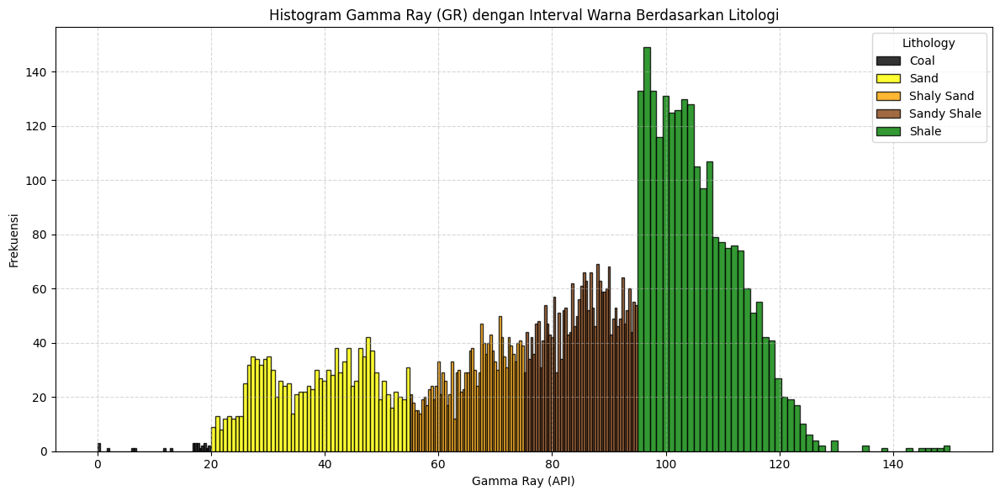

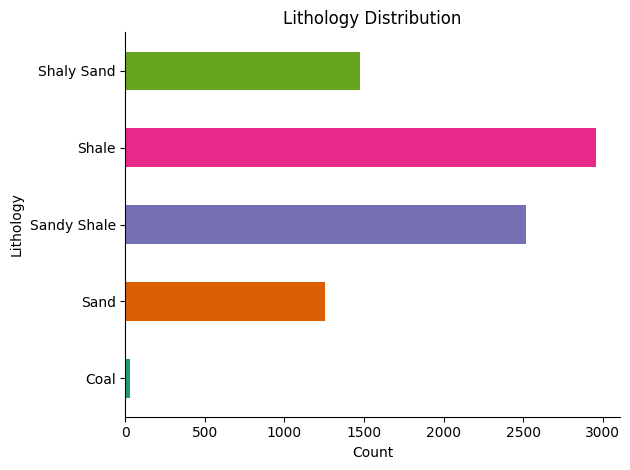

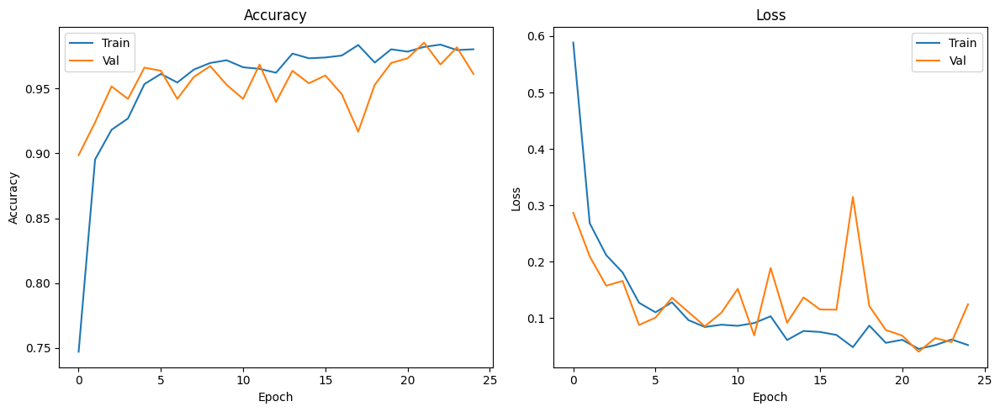


Confusion Matrix:


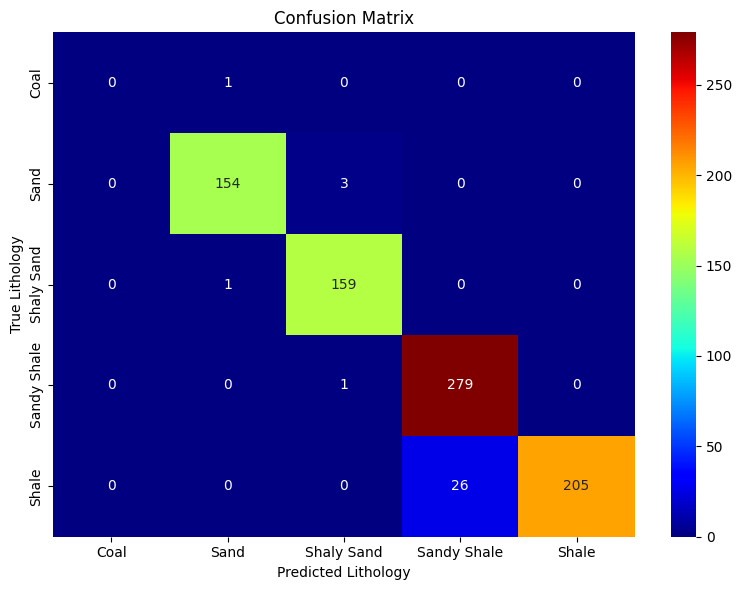

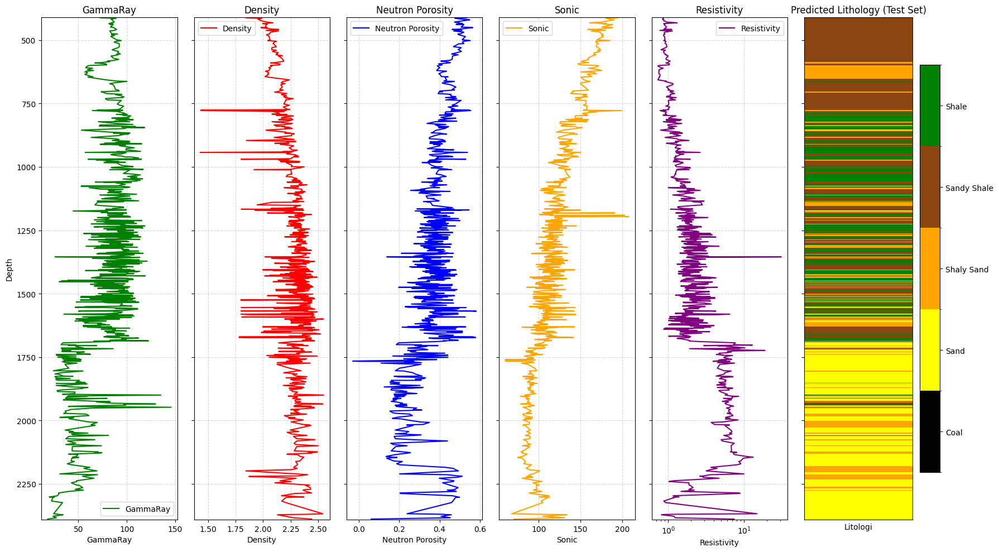

130/130 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step
Skipping plotting aigabung_np on full log plot: aigabung_np or depthcnn not defined or are not numpy arrays.


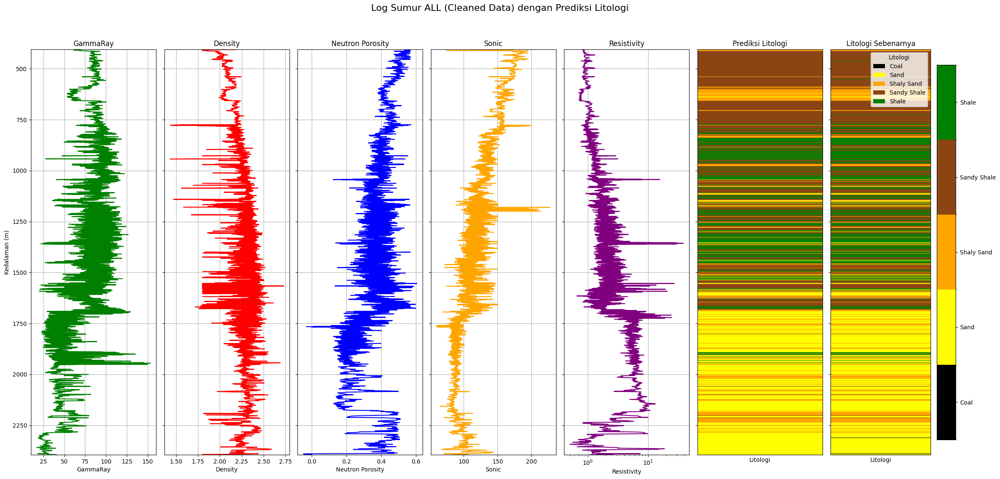

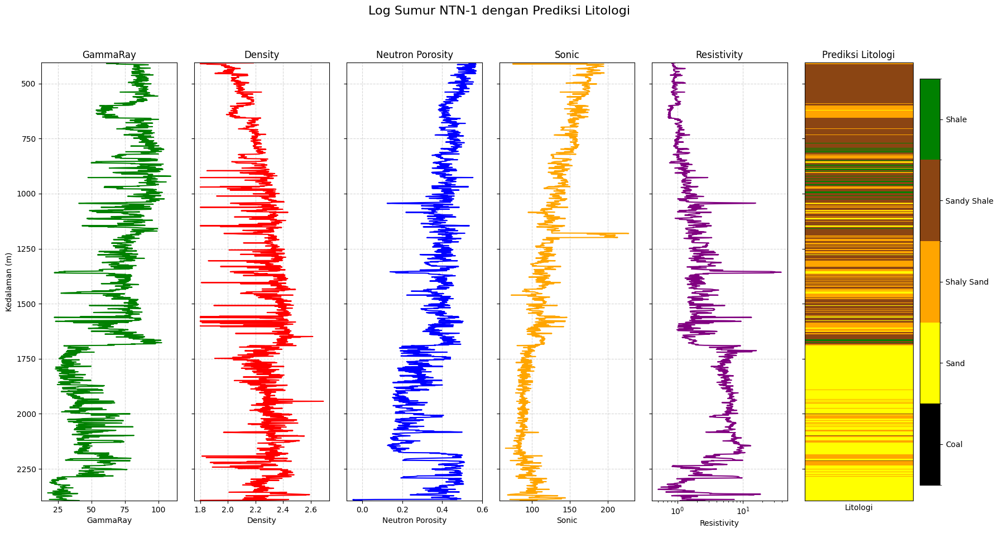

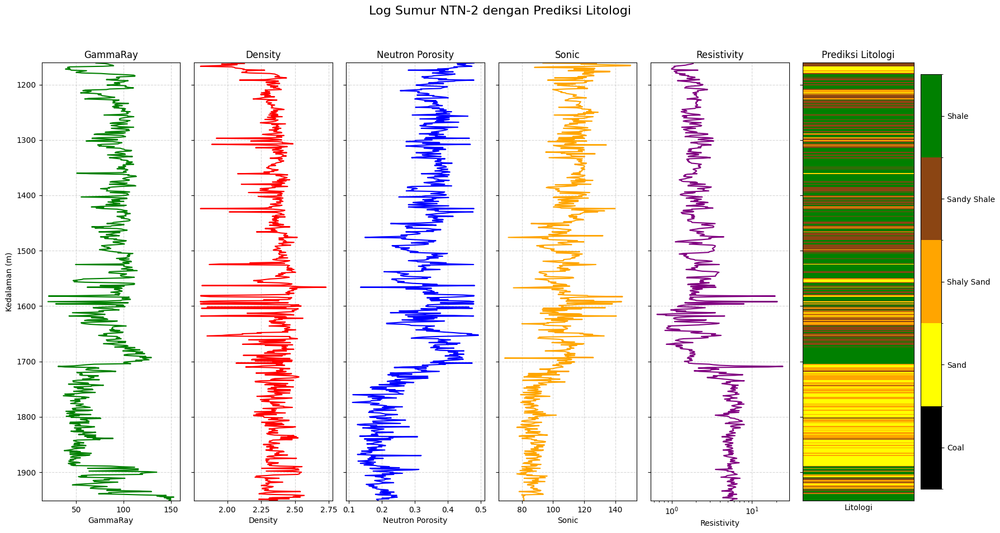

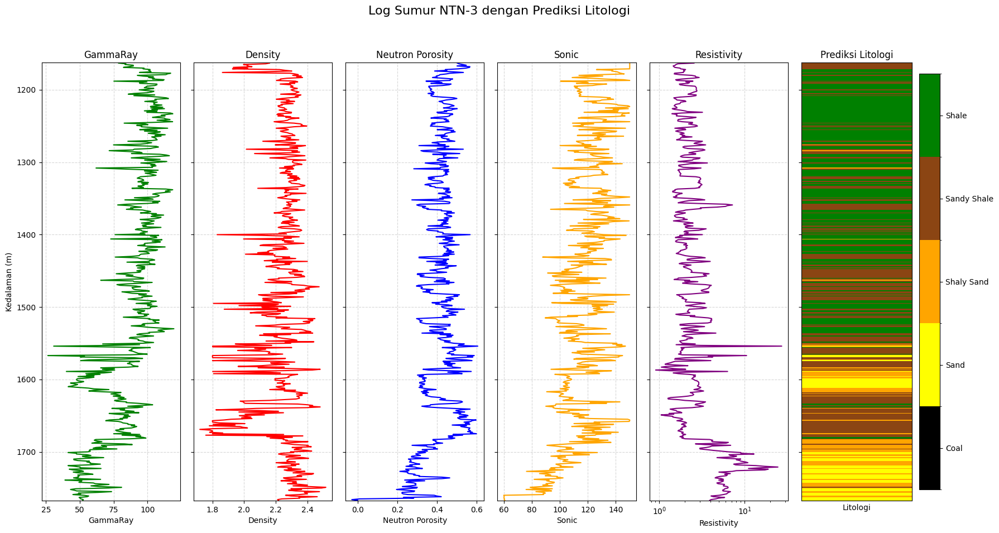

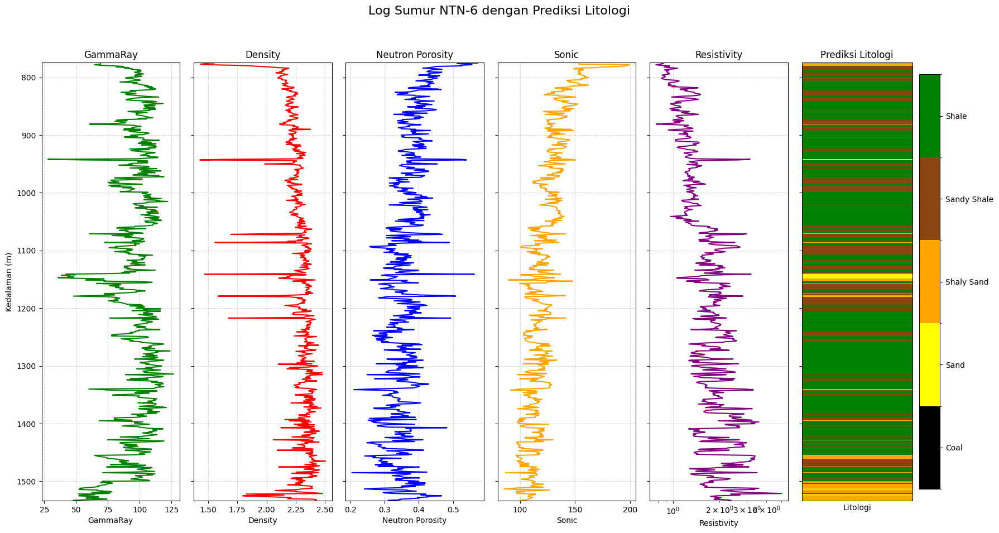

In [ ]:
#SVAE IMAGEE

import matplotlib.pyplot as plt
import numpy as np
# Modify the plot functions to save the figures

# Function to plot logs and classification and save the figure
def plot_logs_and_classification(X_data, depth_data, y_true=None, y_pred_classes=None, title_suffix="", lithology_to_code=None, filename=None):
    num_features = X_data.shape[1]
    num_plots = num_features + 1 # Features + Classification track

    fig, axs = plt.subplots(1, num_plots, figsize=(3 * num_plots, 10), sharey=True)

    # Plot Log Tracks
    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    # Assign specific colors for consistency
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']

    for i in range(num_features):
        axs[i].plot(X_data[:, i], depth_data, color=log_colors[i], label=log_labels[i])
        axs[i].set_title(log_labels[i])
        axs[i].set_xlabel(log_labels[i])
        if i == 0: # Only set ylabel for the first track
            axs[i].set_ylabel('Depth')
        axs[i].legend()
        axs[i].grid(True, linestyle='--', alpha=0.5)
        if log_labels[i] == 'Resistivity': # Set xscale for Resistivity
            axs[i].set_xscale('log')


    # Plot Classification Track
    # Use the globally defined colormap and norm
    cmap = cmap_plot
    norm = norm_plot
    lithology_labels = lithology_labels_plot
    num_classes = len(lithology_labels)

    # Define code_to_lithology mapping within the function or pass it
    if lithology_to_code is None:
         code_to_lithology = {i: label for i, label in enumerate(lithology_labels)}
    else:
         code_to_lithology = {v: k for k, v in lithology_to_code.items()}
         sorted_codes = sorted(lithology_to_code.values())
         lithology_labels = [k for k, v in sorted(lithology_to_code.items(), key=lambda item: item[1])]


    # Ensure depth_data is sorted for pcolormesh
    sort_indices = np.argsort(depth_data)
    depth_data_sorted = depth_data[sort_indices]

    if y_pred_classes is not None:
        classification_data = y_pred_classes[sort_indices].reshape(-1, 1) # Sort predictions by depth
        title = f'Predicted Lithology {title_suffix}'
    elif y_true is not None:
        classification_data = y_true[sort_indices].reshape(-1, 1) # Sort true values by depth
        title = f'True Lithology {title_suffix}'
    else:
        title = 'Classification'
        classification_data = np.zeros((len(depth_data_sorted), 1)) # Placeholder if no classification data


    # Create meshgrid for pcolormesh
    dummy_x = np.array([0, 1])
    if len(depth_data_sorted) > 1:
        depth_boundaries = np.concatenate([depth_data_sorted[0:1] - (depth_data_sorted[1] - depth_data_sorted[0])/2,
                                            (depth_data_sorted[:-1] + depth_data_sorted[1:]) / 2,
                                            depth_data_sorted[-1:] + (depth_data_sorted[-1] - depth_data_sorted[-2])/2])
    else:
         depth_boundaries = np.array([depth_data_sorted[0] - 0.5, depth_data_sorted[0] + 0.5])


    X_mesh, Y_mesh = np.meshgrid(dummy_x, depth_boundaries)


    mesh = axs[num_features].pcolormesh(X_mesh, Y_mesh, classification_data, cmap=cmap, norm=norm, shading='flat')

    axs[num_features].set_title(title)
    axs[num_features].set_xlabel('Litologi')
    axs[num_features].set_xticks([])
    axs[num_features].invert_yaxis()
    axs[num_features].grid(False)

    cbar = fig.colorbar(mesh, ax=axs[num_features], ticks=np.arange(num_classes) + 0.5)
    cbar.ax.set_yticklabels(lithology_labels)

    plt.tight_layout()

    # Save the figure if filename is provided
    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight') # Save with high resolution

    plt.show()

# Function to plot logs and predicted lithology for a single well and save the figure
def plot_well_prediction(df_well_with_pred, well_name, feature_cols, lithology_labels_plot, filename=None):
    if 'DEPT' not in df_well_with_pred.columns or 'predicted_kode_lito' not in df_well_with_pred.columns:
        print(f"Skipping plot for {well_name}: Required columns ('DEPT', 'predicted_kode_lito') not found.")
        return

    cols_to_check = feature_cols + ['predicted_kode_lito', 'DEPT']
    df_plot = df_well_with_pred[cols_to_check].dropna()

    if df_plot.empty:
        print(f"No valid data for plotting in {well_name} after dropping NaNs.")
        return

    df_plot = df_plot.sort_values(by='DEPT')

    depth_data = df_plot['DEPT'].values
    X_data = df_plot[feature_cols].values
    y_pred_classes = df_plot['predicted_kode_lito'].values

    num_features = X_data.shape[1]
    num_plots = num_features + 1

    fig, axs = plt.subplots(1, num_plots, figsize=(3 * num_plots, 10), sharey=True)
    fig.suptitle(f'Log Sumur {well_name} dengan Prediksi Litologi', fontsize=16)

    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']

    for i in range(num_features):
        axs[i].plot(X_data[:, i], depth_data, color=log_colors[i], label=feature_cols[i])
        axs[i].set_title(log_labels[i])
        axs[i].set_xlabel(log_labels[i])
        if i == 0:
            axs[i].set_ylabel('Kedalaman (m)')
        axs[i].grid(True, linestyle='--', alpha=0.5)
        if log_labels[i] == 'Resistivity':
            axs[i].set_xscale('log')


    cmap = cmap_plot
    norm = norm_plot
    lithology_labels = lithology_labels_plot
    num_classes = len(lithology_labels)

    dummy_x = np.array([0, 1])
    if len(depth_data) > 1:
        depth_boundaries_plot = np.concatenate([depth_data[0:1] - (depth_data[1] - depth_data[0])/2,
                                            (depth_data[:-1] + depth_data[1:]) / 2,
                                            depth_data[-1:] + (depth_data[-1] - depth_data[-2])/2])
    else:
         depth_boundaries_plot = np.array([depth_data[0] - 0.5, depth_data[0] + 0.5])

    X_mesh, Y_mesh = np.meshgrid(dummy_x, depth_boundaries_plot)
    C_mesh = y_pred_classes.reshape(-1, 1)

    mesh = axs[num_features].pcolormesh(X_mesh, Y_mesh, C_mesh, cmap=cmap, norm=norm, shading='flat')

    axs[num_features].set_title('Prediksi Litologi')
    axs[num_features].set_xlabel('Litologi')
    axs[num_features].set_xticks([])
    axs[num_features].invert_yaxis()
    axs[num_features].grid(False)

    cbar = fig.colorbar(mesh, ax=axs[num_features], ticks=np.arange(num_classes) + 0.5)
    cbar.ax.set_yticklabels(lithology_labels)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Save the figure if filename is provided
    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight') # Save with high resolution

    plt.show()


# Function to plot the full cleaned data log with predicted and true lithology and save the figure
def plot_full_log_with_prediction(X_data, depth_data, y_true, y_pred_classes, feature_cols, lithology_labels_plot, aigabung_np=None, depthcnn=None, filename=None):
    sort_indices_full = np.argsort(depth_data)
    X_full_cleaned_sorted = X_data[sort_indices_full]
    depth_full_cleaned_sorted = depth_data[sort_indices_full]
    y_full_cleaned_true_sorted = y_true[sort_indices_full]
    y_pred_full_cleaned_classes_sorted = y_pred_classes[sort_indices_full]

    fig_full, axs_full = plt.subplots(1, 7, figsize=(24, 12), sharey=True)
    fig_full.suptitle('Log Sumur ALL (Cleaned Data) dengan Prediksi Litologi', fontsize=16)

    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']
    for i in range(X_full_cleaned_sorted.shape[1]):
        axs_full[i].plot(X_full_cleaned_sorted[:, i], depth_full_cleaned_sorted, color=log_colors[i])
        axs_full[i].set_title(log_labels[i])
        axs_full[i].set_xlabel(log_labels[i])
        if i == 0:
            axs_full[i].set_ylabel('Kedalaman (m)')
        axs_full[i].invert_yaxis()
        axs_full[i].grid(True)
        if log_labels[i] == 'Resistivity':
            axs_full[i].set_xscale('log')

    cmap = cmap_plot
    norm = norm_plot
    lithology_labels = lithology_labels_plot
    num_classes = len(lithology_labels)

    dummy_x_full = np.array([0, 1])
    if len(depth_full_cleaned_sorted) > 1:
        depth_boundaries_full_plot = np.concatenate([depth_full_cleaned_sorted[0:1] - (depth_full_cleaned_sorted[1] - depth_full_cleaned_sorted[0])/2,
                                                    (depth_full_cleaned_sorted[:-1] + depth_full_cleaned_sorted[1:]) / 2,
                                                    depth_full_cleaned_sorted[-1:] + (depth_full_cleaned_sorted[-1] - depth_full_cleaned_sorted[-2])/2])
    else:
         depth_boundaries_full_plot = np.array([depth_full_cleaned_sorted[0] - 0.5, depth_full_cleaned_sorted[0] + 0.5])

    X_mesh_full_pred, Y_mesh_full_pred = np.meshgrid(dummy_x_full, depth_boundaries_full_plot)
    C_mesh_full_pred = y_pred_full_cleaned_classes_sorted.reshape(-1, 1)

    mesh_full_pred = axs_full[5].pcolormesh(X_mesh_full_pred, Y_mesh_full_pred, C_mesh_full_pred, cmap=cmap, norm=norm, shading='flat')

    axs_full[5].set_title('Prediksi Litologi')
    axs_full[5].set_xlabel('Litologi')
    axs_full[5].set_xticks([])
    axs_full[5].invert_yaxis()
    axs_full[5].grid(False)

    C_mesh_full_true = y_full_cleaned_true_sorted.reshape(-1, 1)
    mesh_full_true = axs_full[6].pcolormesh(X_mesh_full_pred, Y_mesh_full_pred, C_mesh_full_true, cmap=cmap, norm=norm, shading='flat')

    # Plot aigabung_np if provided
    if aigabung_np is not None and depthcnn is not None and len(depthcnn) == len(aigabung_np):
        closest_indices_in_full_depth = np.searchsorted(depth_full_cleaned_sorted, depthcnn)
        closest_indices_in_full_depth = np.clip(closest_indices_in_full_depth, 0, len(depth_full_cleaned_sorted) - 1)
        aligned_aigabung_depth = depth_full_cleaned_sorted[closest_indices_in_full_depth]

        min_aigabung = np.min(aigabung_np)
        max_aigabung = np.max(aigabung_np)
        if max_aigabung > min_aigabung:
            normalized_aigabung = (aigabung_np - min_aigabung) / (max_aigabung - min_aigabung)
        else:
            normalized_aigabung = np.zeros_like(aigabung_np)

        x_position_aigabung = normalized_aigabung
        axs_full[6].plot(x_position_aigabung, aligned_aigabung_depth, color='red', linestyle='-', label='AIGabung')
        axs_full[6].legend(loc='upper right')

    axs_full[6].set_title('Litologi Sebenarnya')
    axs_full[6].set_xlabel('Litologi')
    axs_full[6].set_xticks([])
    axs_full[6].invert_yaxis()
    axs_full[6].grid(False)

    legend_elements_full = [Patch(facecolor=color, label=label) for label, color in zip(lithology_labels_plot, lithology_colors_plot)]
    cbar_full_true = fig_full.colorbar(mesh_full_true, ax=axs_full[6], ticks=np.arange(len(lithology_labels_plot)) + 0.5)
    cbar_full_true.ax.set_yticklabels(lithology_labels_plot)

    axs_full[6].legend(handles=legend_elements_full, loc='upper right', title='Litologi')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Save the figure if filename is provided
    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight') # Save with high resolution

    plt.show()


# --- Save the first histogram plot ---
plt.figure(figsize=(12, 6))
intervals = [
    (0, 20, 'black', 'Coal'),
    (20, 55, 'yellow', 'Sand'),
    (55, 75, 'orange', 'Shaly Sand'),
    (75, 95, 'saddlebrown', 'Sandy Shale'),
    (95, 150, 'green', 'Shale')
]
for lower, upper, color, label in intervals:
    mask = (df_all['GR'] >= lower) & (df_all['GR'] < upper)
    plt.hist(df_all['GR'][mask], bins=50, color=color, edgecolor='k', alpha=0.8, label=label)

plt.title("Histogram Gamma Ray (GR) dengan Interval Warna Berdasarkan Litologi")
plt.xlabel("Gamma Ray (API)")
plt.ylabel("Frekuensi")
plt.legend(title="Lithology")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig('gr_histogram.png', dpi=300, bbox_inches='tight') # Save histogram
plt.show()

# --- Save the Lithology count bar chart ---
plt.figure() # Create a new figure for the bar chart
df_all.groupby('Lithology').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.title('Lithology Distribution')
plt.xlabel('Count')
plt.ylabel('Lithology')
plt.tight_layout()
plt.savefig('lithology_distribution.png', dpi=300, bbox_inches='tight') # Save bar chart
plt.show()


# --- Save the Accuracy and Loss plot ---
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.savefig('accuracy_loss.png', dpi=300, bbox_inches='tight') # Save accuracy/loss plot
plt.show()


# --- Save the Confusion Matrix plot ---
print("\nConfusion Matrix:")
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred_classes), annot=True, fmt='d', cmap='jet',
            xticklabels=lithology_to_code.keys(), yticklabels=lithology_to_code.keys())
plt.xlabel('Predicted Lithology')
plt.ylabel('True Lithology')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=300, bbox_inches='tight') # Save confusion matrix
plt.show()


# Plot and Save results for the test set
# Need to use the unscaled X_test for plotting log values, but sorted by depth
sort_indices_test = np.argsort(depth_test)
X_test_sorted = X_test[sort_indices_test]
depth_test_sorted = depth_test[sort_indices_test]
y_test_sorted = y_test[sort_indices_test]
y_pred_classes_sorted = y_pred_classes[sort_indices_test]

plot_logs_and_classification(X_test_sorted, depth_test_sorted, y_true=y_test_sorted, y_pred_classes=y_pred_classes_sorted, title_suffix="(Test Set)", lithology_to_code=lithology_to_code, filename='test_set_prediction_log.png')


# Plot and Save the full cleaned data log with predicted and true lithology
if 'DEPT' in Df_clean.columns:
    X_full_cleaned = Df_clean[feature_cols].values
    depth_full_cleaned = Df_clean['DEPT'].values
    y_full_cleaned_true = Df_clean[target_col].values

    X_full_cleaned_scaled = scaler.transform(X_full_cleaned)
    X_full_cleaned_reshaped = X_full_cleaned_scaled.reshape((X_full_cleaned_scaled.shape[0], X_full_cleaned_scaled.shape[1], 1))

    y_pred_full_cleaned_prob = model.predict(X_full_cleaned_reshaped)
    y_pred_full_cleaned_classes = np.argmax(y_pred_full_cleaned_prob, axis=1)

    # Check if aigabung_np and depthcnn are defined for plotting
    aigabung_exists = 'aigabung_np' in locals() and isinstance(aigabung_np, np.ndarray)
    depthcnn_exists = 'depthcnn' in locals() and isinstance(depthcnn, np.ndarray)

    if aigabung_exists and depthcnn_exists:
         plot_full_log_with_prediction(X_full_cleaned, depth_full_cleaned, y_full_cleaned_true, y_pred_full_cleaned_classes, feature_cols, lithology_labels_plot, aigabung_np=aigabung_np, depthcnn=depthcnn, filename='full_cleaned_data_log_prediction.png')
    else:
         print("Skipping plotting aigabung_np on full log plot: aigabung_np or depthcnn not defined or are not numpy arrays.")
         plot_full_log_with_prediction(X_full_cleaned, depth_full_cleaned, y_full_cleaned_true, y_pred_full_cleaned_classes, feature_cols, lithology_labels_plot, filename='full_cleaned_data_log_prediction.png')

else:
    print("Skipping full log plot as 'DEPT' column is not available in cleaned data.")


# Plot and Save results for each well
plot_well_prediction(df1_with_pred, "NTN-1", feature_cols, lithology_labels_plot, filename='well_NTN-1_prediction_log.png')
plot_well_prediction(df2_with_pred, "NTN-2", feature_cols, lithology_labels_plot, filename='well_NTN-2_prediction_log.png')
plot_well_prediction(df3_with_pred, "NTN-3", feature_cols, lithology_labels_plot, filename='well_NTN-3_prediction_log.png')
plot_well_prediction(df6_with_pred, "NTN-6", feature_cols, lithology_labels_plot, filename='well_NTN-6_prediction_log.png')


130/130 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step

Cross-tabulation of True vs Predicted Lithology:
predicted_lithology  Sand  Sandy Shale  Shale  Shaly Sand
Lithology                                                
Coal                    4            0      0           0
Sand                  836            0      0           6
Sandy Shale             0         1353      1           1
Shale                   0          114   1088           0
Shaly Sand              1            2      0         738


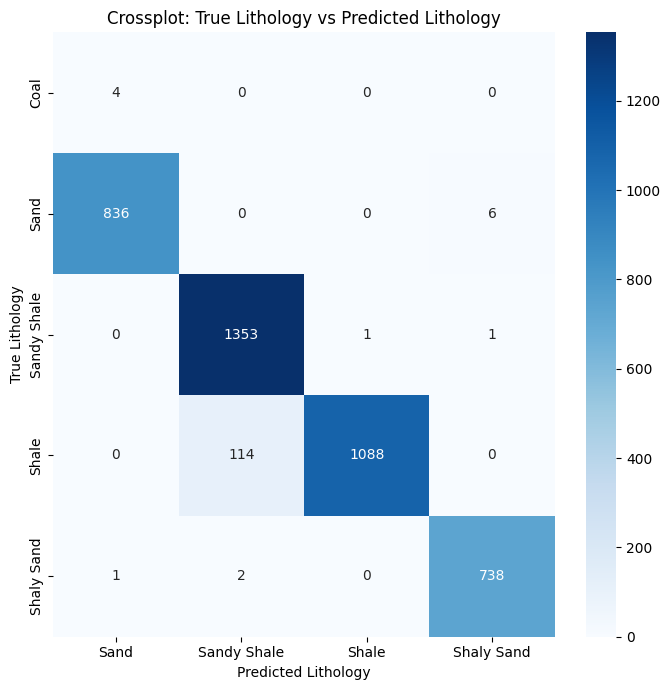

KeyError: "['kode_lito'] not in index"

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np # Import numpy for argmax and dropna

# Ensure df_all contains the original 'Lithology' and 'kode_lito' columns.
# These should have been added in cell 32hHP15ZkaHx.

# Make predictions on the entire df_all DataFrame
# First, select the features and handle NaNs for prediction
feature_cols = ['GR', 'DEN', 'NPHI', 'DT', 'RILD'] # Define feature columns again for clarity
# Create a temporary DataFrame for prediction to drop NaNs in features
df_for_prediction = df_all[feature_cols].dropna()

# Get the index of the rows that were kept after dropping NaNs
valid_indices = df_for_prediction.index

# Use the scaler fitted on the training data (from cell 32hHP15ZkaHx)
# Make sure 'scaler' object is available from the previous execution.
# If not available, you would need to refit it on the training data or the full cleaned data.
# Assuming 'scaler' is available:
X_full_scaled = scaler.transform(df_for_prediction.values)

# Reshape for CNN input
X_full_reshaped = X_full_scaled.reshape((X_full_scaled.shape[0], X_full_scaled.shape[1], 1))

# Predict lithology codes using the trained model (from cell huh6tAtkk2ZI)
# Make sure 'model' object is available from the previous execution.
# Assuming 'model' is available:
y_pred_full_prob = model.predict(X_full_reshaped)
y_pred_full_classes = np.argmax(y_pred_full_prob, axis=1)

# Create a pandas Series of the predictions, aligned with the original df_all index
# Initialize with NaN for all original indices, then fill in the predicted values
predicted_kode_lito_series = pd.Series(np.nan, index=df_all.index)
predicted_kode_lito_series[valid_indices] = y_pred_full_classes

# Add the predicted lithology codes and labels back to the original df_all DataFrame
df_all['predicted_kode_lito'] = predicted_kode_lito_series

# Map the predicted codes back to lithology labels
lithology_labels_plot = ['Coal', 'Sand', 'Shaly Sand', 'Sandy Shale', 'Shale'] # Define labels again
df_all['predicted_lithology'] = df_all['predicted_kode_lito'].apply(
    lambda x: lithology_labels_plot[int(x)] if pd.notna(x) and 0 <= int(x) < len(lithology_labels_plot) else None
)

# Ensure 'kode_lito' is in df_all for the correlation analysis.
# 'kode_lito' is created in cell 32hHP15ZkaHx, but might be lost or not correctly merged into df_all
# after subsequent operations. Re-adding it from the cleaned data source (Df_clean) if necessary,
# or ensuring it's carried through from the initial concatenation.
# A safer approach is to merge 'kode_lito' from Df_clean back to df_all based on index if DEPT is the index,
# or on DEPT if it's a column. Assuming index alignment or DEPT column for merging:
if 'DEPT' in df_all.columns and 'DEPT' in Df_clean.columns:
    # Use merge on DEPT if it's a common column
    df_all = df_all.merge(Df_clean[['DEPT', 'kode_lito']], on='DEPT', how='left', suffixes=('', '_from_clean'))
    # Handle potential duplicate kode_lito columns if merge creates one
    if 'kode_lito_from_clean' in df_all.columns:
        # Prioritize the kode_lito from Df_clean where available
        df_all['kode_lito'] = df_all['kode_lito_from_clean'].combine_first(df_all['kode_lito'])
        df_all = df_all.drop(columns=['kode_lito_from_clean'])
elif df_all.index.equals(Df_clean.index):
     # If indices align, simply assign the column
     df_all['kode_lito'] = Df_clean['kode_lito']
else:
    print("Warning: Could not merge 'kode_lito' based on 'DEPT' or index alignment. Correlation matrix might be incomplete.")
    # If merging is not possible, proceed without 'kode_lito' in correlation or skip it


# Now, ensure that 'Lithology' (true) and 'predicted_lithology' columns are present and have non-null values
# before creating the crosstab and correlation matrix.
# We will filter out rows where either the true or predicted lithology is missing
# Also include 'kode_lito' in the subset check for df_eval if it's available
cols_for_eval_subset = ['Lithology', 'predicted_lithology']
if 'kode_lito' in df_all.columns:
    cols_for_eval_subset.append('kode_lito')

df_eval = df_all.dropna(subset=cols_for_eval_subset).copy()


if not df_eval.empty:
    # --- Crossplot between predicted and true lithology ---

    # Create a crosstabulation (contingency table)
    crosstab_data = pd.crosstab(df_eval['Lithology'], df_eval['predicted_lithology'])

    print("\nCross-tabulation of True vs Predicted Lithology:")
    print(crosstab_data)

    # Plot the crosstabulation as a heatmap for visualization
    plt.figure(figsize=(7, 7))
    sns.heatmap(crosstab_data, annot=True, fmt='d', cmap='Blues', cbar=True)
    plt.title('Crossplot: True Lithology vs Predicted Lithology')
    plt.xlabel('Predicted Lithology')
    plt.ylabel('True Lithology')
    plt.tight_layout()
    plt.show()
    plt.savefig(f'predandtrue_matrix(new).png', dpi=300, bbox_inches='tight')

    # --- Correlation Matrix between lithology codes and log features ---

    # For correlation, we need numerical representations.
    # Use 'kode_lito' (true) and 'predicted_kode_lito' (predicted).
    # Select these two columns and any relevant numerical log features for correlation analysis.
    correlation_cols = ['predicted_kode_lito'] + feature_cols
    if 'kode_lito' in df_eval.columns: # Only include 'kode_lito' if it's successfully in df_eval
        correlation_cols.insert(0, 'kode_lito')


    # Filter the evaluation DataFrame to include these columns and drop NaNs
    # Note: df_eval already has no NaNs in lithology columns, but might have in feature_cols
    df_correlation = df_eval[correlation_cols].dropna()


    if not df_correlation.empty:
        # Calculate the correlation matrix
        correlation_matrix = df_correlation.corr()

        print("\nCorrelation Matrix (True Lithology Code, Predicted Lithology Code, and Log Features):")
        print(correlation_matrix)

        # Plot the correlation matrix as a heatmap
        plt.figure(figsize=(10, 8))
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=".5") # Fixed fmt
        plt.title('Correlation Matrix: Lithology Codes and Log Features')
        plt.tight_layout()
        plt.show()
    else:
        print("\nSkipping correlation matrix: No valid data found for correlation analysis after dropping NaNs in features.")


else:
    print("Skipping crossplot and correlation matrix: No valid data found in df_all with both true and predicted lithology.")

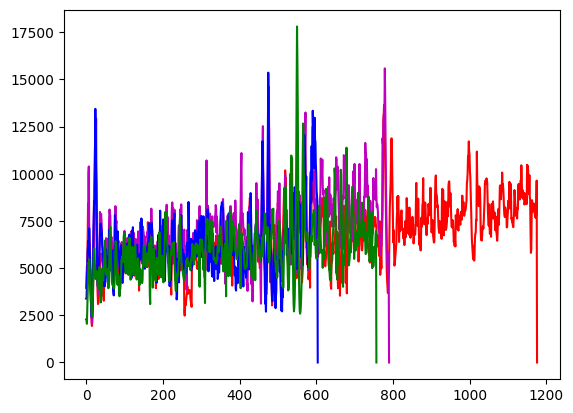

In [ ]:
aimb1 = np.genfromtxt('/content/aimbmanual1.txt', delimiter=',')
aimb2_ = np.genfromtxt('/content/ai2bmanual.txt', delimiter=',')
aimb3 = np.genfromtxt('/content/ai3bmanual.txt', delimiter=',')
aimb6 = np.genfromtxt('/content/ai6bmanual.txt', delimiter=',')
aimb2 = aimb2_[:791]
plt.plot(aimb1, '-r')
plt.plot(aimb2, '-m')
plt.plot(aimb3, '-b')
plt.plot(aimb6, '-g')

Combined NumPy array shape: (3331,)
Combined list of arrays length: 4


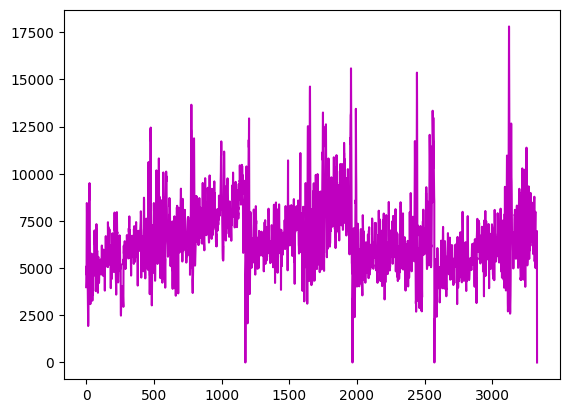

In [ ]:
aigabung_np = np.concatenate((aimb1, aimb2, aimb3, aimb6))
print("Combined NumPy array shape:", aigabung_np.shape)

# If you want to store them in a list:
aigabung_list = [aimb1, aimb2, aimb3, aimb6]
print("Combined list of arrays length:", len(aigabung_list))
plt.plot(aigabung_np, '-m')

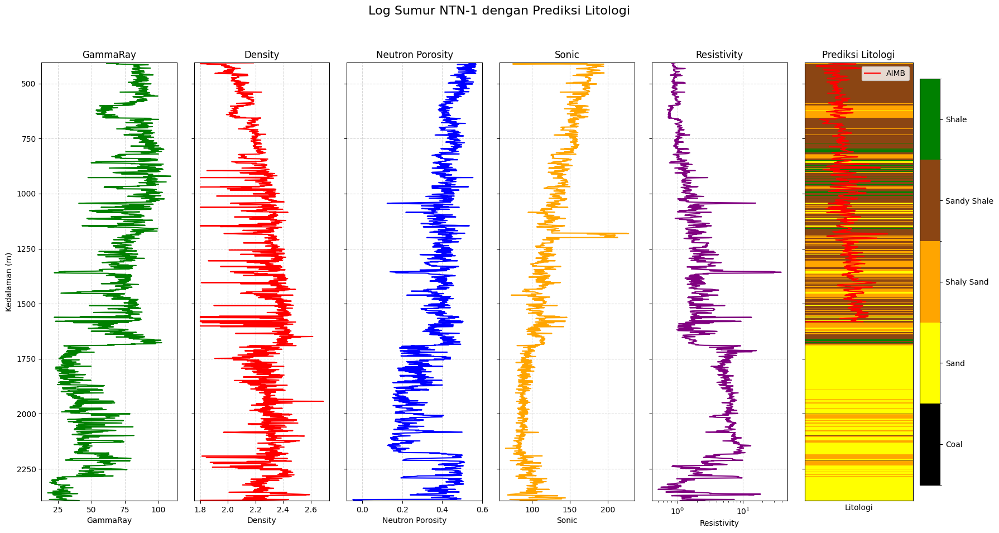

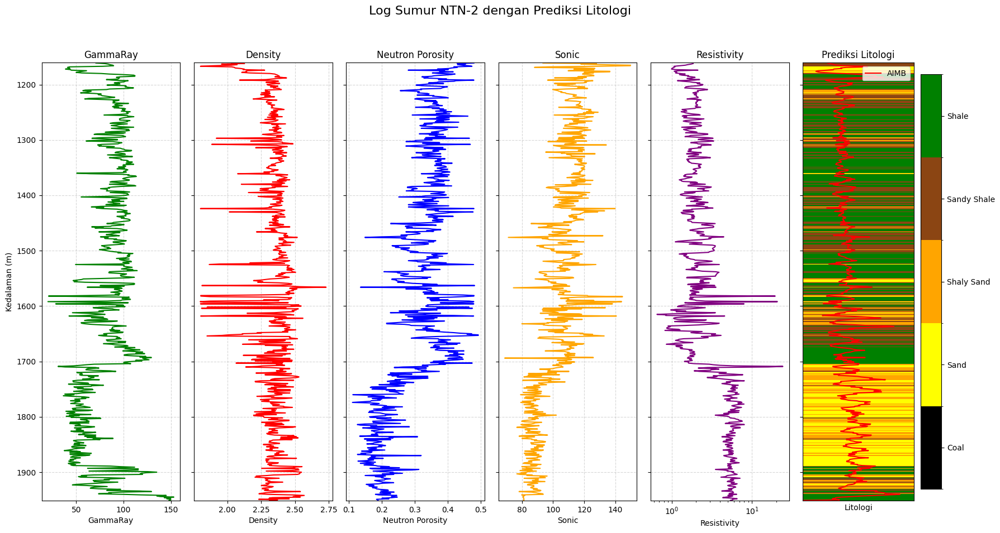

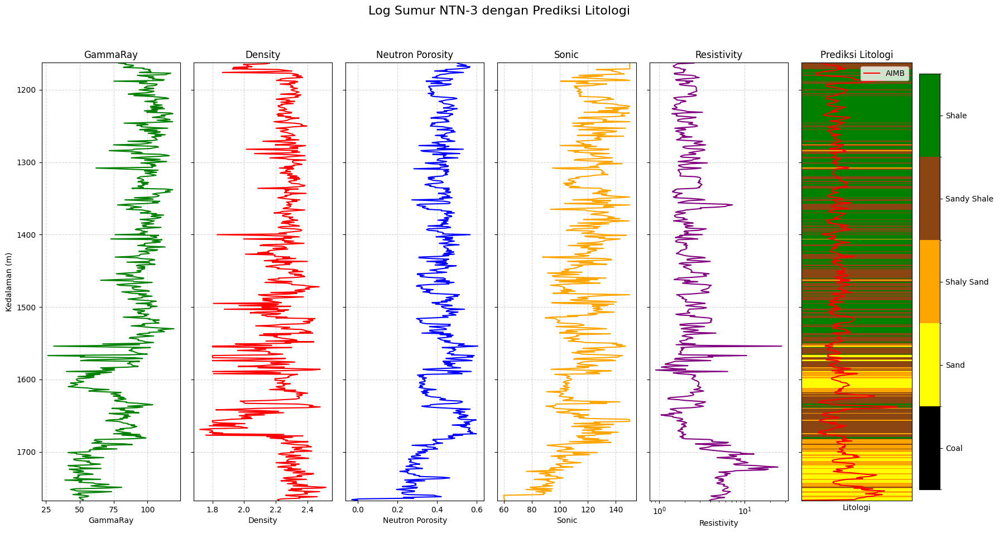

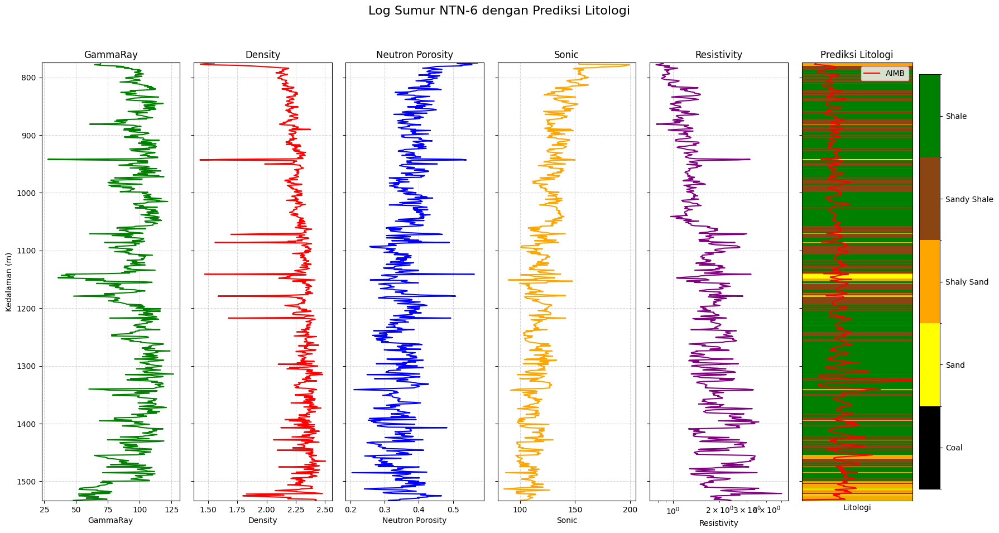

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch

# Assuming axs_full is the array of axes for the full log plot (from the previous section)
# And axs_full[6] is the axis for the True Lithology track.

# # Check if fig_full and axs_full are defined from the previous plotting block
# if 'fig_full' in locals() and 'axs_full' in locals():

#     # Ensure aigabung_np and depthcnn are defined and have compatible lengths.
#     # You need to ensure depthcnn corresponds to the depth range of aigabung_np.
#     # If aigabung_np covers the entire depth range of df_all_cleaned,
#     # you should use depth_full_cleaned_sorted for alignment.

#     if 'aigabung_np' in locals() and 'depthcnn' in locals() and len(depthcnn) == len(aigabung_np):
#         # Plot aigabung_np on the True Lithology track (axs_full[6])
#         # Normalize aigabung_np to fit within the track width (0 to 1)
#         min_aigabung = np.min(aigabung_np)
#         max_aigabung = np.max(aigabung_np)

#         # Avoid division by zero if all values are the same
#         if max_aigabung > min_aigabung:
#             # Scale aigabung_np to the range [0, 1]
#             scaled_aigabung = (aigabung_np - min_aigabung) / (max_aigabung - min_aigabung)
#         else:
#             scaled_aigabung = np.zeros_like(aigabung_np) # Plot as a line at x=0 if no variation

#         # Plot the scaled aigabung_np against depthcnn on the 7th subplot (index 6)
#         # Assuming depthcnn is the correct depth array for aigabung_np.
#         axs_full[6].plot(scaled_aigabung, depthcnn, color='red', linestyle='-', label='AIGabung')

#         # Add a legend to this subplot
#         axs_full[6].legend(loc='upper right')

#         # Redraw the plot to show the added line
#         fig_full.canvas.draw_idle()
#         plt.show() # Explicitly show the modified figure

#     else:
#         print("Skipping plotting of aigabung_np on the full log: aigabung_np or depthcnn not defined, or lengths mismatch.")

# else:
#     print("Skipping plotting of aigabung_np: Full log figure (fig_full, axs_full) not defined.")

# Function to plot logs and predicted lithology for a single well
# This function is repeated from the previous block, keeping it for potential standalone use
def plot_well_prediction_with_aimb(df_well_with_pred, well_name, feature_cols, lithology_labels_plot, aimb_data=None, aimb_depth=None):
    # Ensure 'DEPT' and prediction columns exist
    if 'DEPT' not in df_well_with_pred.columns or 'predicted_kode_lito' not in df_well_with_pred.columns:
        print(f"Skipping plot for {well_name}: Required columns ('DEPT', 'predicted_kode_lito') not found.")
        return

    # Drop rows where features or prediction are NaN to get clean data for plotting
    cols_to_check = feature_cols + ['predicted_kode_lito', 'DEPT']
    df_plot = df_well_with_pred[cols_to_check].dropna()

    if df_plot.empty:
        print(f"No valid data for plotting in {well_name} after dropping NaNs.")
        return

    # Sort by depth for correct plotting
    df_plot = df_plot.sort_values(by='DEPT')

    depth_data = df_plot['DEPT'].values
    X_data = df_plot[feature_cols].values
    y_pred_classes = df_plot['predicted_kode_lito'].values

    num_features = X_data.shape[1]
    num_plots = num_features + 1 # Features + Classification track

    fig, axs = plt.subplots(1, num_plots, figsize=(3 * num_plots, 10), sharey=True)
    fig.suptitle(f'Log Sumur {well_name} dengan Prediksi Litologi', fontsize=16)

    # Plot Log Tracks
    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']

    for i in range(num_features):
        axs[i].plot(X_data[:, i], depth_data, color=log_colors[i], label=feature_cols[i]) # Use feature_cols for label
        axs[i].invert_yaxis()
        axs[i].set_title(log_labels[i])
        axs[i].set_xlabel(log_labels[i])
        if i == 0: # Only set ylabel for the first track
            axs[i].set_ylabel('Kedalaman (m)')
        axs[i].grid(True, linestyle='--', alpha=0.5)
        if log_labels[i] == 'Resistivity':
            axs[i].set_xscale('log')


    # Plot Predicted Lithology Column
    cmap = cmap_plot
    norm = norm_plot
    lithology_labels = lithology_labels_plot
    num_classes = len(lithology_labels)

    # Create meshgrid for pcolormesh
    dummy_x = np.array([0, 1])
    if len(depth_data) > 1:
        depth_boundaries_plot = np.concatenate([depth_data[0:1] - (depth_data[1] - depth_data[0])/2,
                                            (depth_data[:-1] + depth_data[1:]) / 2,
                                            depth_data[-1:] + (depth_data[-1] - depth_data[-2])/2])
    else: # Handle case with only one data point
         depth_boundaries_plot = np.array([depth_data[0] - 0.5, depth_data[0] + 0.5])

    X_mesh, Y_mesh = np.meshgrid(dummy_x, depth_boundaries_plot)
    C_mesh = y_pred_classes.reshape(-1, 1)

    mesh = axs[num_features].pcolormesh(X_mesh, Y_mesh, C_mesh, cmap=cmap, norm=norm, shading='flat')

    axs[num_features].set_title('Prediksi Litologi')
    axs[num_features].set_xlabel('Litologi')
    axs[num_features].set_xticks([]) # Hide x-axis ticks
    # axs[num_features].invert_yaxis()
    axs[num_features].grid(False)

    # Add the AIGabung plot on the lithology track if data is provided
    if aimb_data is not None and aimb_depth is not None and len(aimb_data) == len(aimb_depth):
         # Find corresponding depths in the current well's depth array
         # This is a simplified alignment. For precise alignment, consider resampling.
         closest_indices_in_well_depth = np.searchsorted(depth_data, aimb_depth)
         closest_indices_in_well_depth = np.clip(closest_indices_in_well_depth, 0, len(depth_data) - 1)
         aligned_aimb_depth = depth_data[closest_indices_in_well_depth]

         # Normalize aimb_data to fit within the lithology track width (0 to 1)
         # Using the overall min/max for consistency if plotting multiple AIMBs
         min_aigabung = np.min(aigabung_np) # Use the min from the combined array
         max_aigabung = np.max(aigabung_np) # Use the max from the combined array

         if max_aigabung > min_aigabung:
             scaled_aimb = (aimb_data - min_aigabung) / (max_aigabung - min_aigabung)
         else:
             scaled_aimb = np.zeros_like(aimb_data)

         # Plot the scaled AIMB data on the lithology track
         axs[num_features].plot(scaled_aimb, aligned_aimb_depth, color='red', linestyle='-', label='AIMB')
         axs[num_features].legend(loc='upper right')


    # Add a colorbar
    cbar = fig.colorbar(mesh, ax=axs[num_features], ticks=np.arange(num_classes) + 0.5)
    cbar.ax.set_yticklabels(lithology_labels)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to make room for suptitle
    plt.show()

# Plot results for each well, now including the respective AIMB data
# You need to define depth arrays for each aimb (aimb1_depth, aimb2_depth, etc.)
# based on the depth range covered by each well's original data.
# For simplicity, let's assume each AIMB corresponds to the entire depth range of its well
# in the *cleaned* data after dropping NaNs for that well.

# Get the depth data for each cleaned well individually
df1_plot_data = df1_with_pred.dropna(subset=feature_cols + ['predicted_kode_lito', 'DEPT']).sort_values(by='DEPT')
df1_plot_depth_ = df1_plot_data['DEPT'].values
df1_plot_depth = df1_plot_depth_[0:1177]
df2_plot_data = df2_with_pred.dropna(subset=feature_cols + ['predicted_kode_lito', 'DEPT']).sort_values(by='DEPT')
df2_plot_depth = df2_plot_data['DEPT'].values
df3_plot_data = df3_with_pred.dropna(subset=feature_cols + ['predicted_kode_lito', 'DEPT']).sort_values(by='DEPT')
df3_plot_depth = df3_plot_data['DEPT'].values
df6_plot_data = df6_with_pred.dropna(subset=feature_cols + ['predicted_kode_lito', 'DEPT']).sort_values(by='DEPT')
df6_plot_depth_ = df6_plot_data['DEPT'].values
df6_plot_depth = df6_plot_depth_[0:758]


# Ensure AIMB data lengths match their respective depth data lengths
# This might require resampling or checking data consistency beforehand.
# Assuming they are already aligned:
if len(aimb1) == len(df1_plot_depth):
    plot_well_prediction_with_aimb(df1_with_pred, "NTN-1", feature_cols, lithology_labels_plot, aimb_data=aimb1, aimb_depth=df1_plot_depth)
else:
    print(f"Skipping plotting AIMB for NTN-1: Length mismatch between aimb1 ({len(aimb1)}) and plot depth ({len(df1_plot_depth)}).")


if len(aimb2) == len(df2_plot_depth):
    plot_well_prediction_with_aimb(df2_with_pred, "NTN-2", feature_cols, lithology_labels_plot, aimb_data=aimb2, aimb_depth=df2_plot_depth)
else:
     print(f"Skipping plotting AIMB for NTN-2: Length mismatch between aimb2 ({len(aimb2)}) and plot depth ({len(df2_plot_depth)}).")


if len(aimb3) == len(df3_plot_depth):
    plot_well_prediction_with_aimb(df3_with_pred, "NTN-3", feature_cols, lithology_labels_plot, aimb_data=aimb3, aimb_depth=df3_plot_depth)
else:
     print(f"Skipping plotting AIMB for NTN-3: Length mismatch between aimb3 ({len(aimb3)}) and plot depth ({len(df3_plot_depth)}).")

if len(aimb6) == len(df6_plot_depth):
    plot_well_prediction_with_aimb(df6_with_pred, "NTN-6", feature_cols, lithology_labels_plot, aimb_data=aimb6, aimb_depth=df6_plot_depth)
else:
     print(f"Skipping plotting AIMB for NTN-6: Length mismatch between aimb6 ({len(aimb6)}) and plot depth ({len(df6_plot_depth)}).")

Saved gr_histogram(new).png
Saved gr_histogram(new).jpg
Saved gr_histogram(new).svg


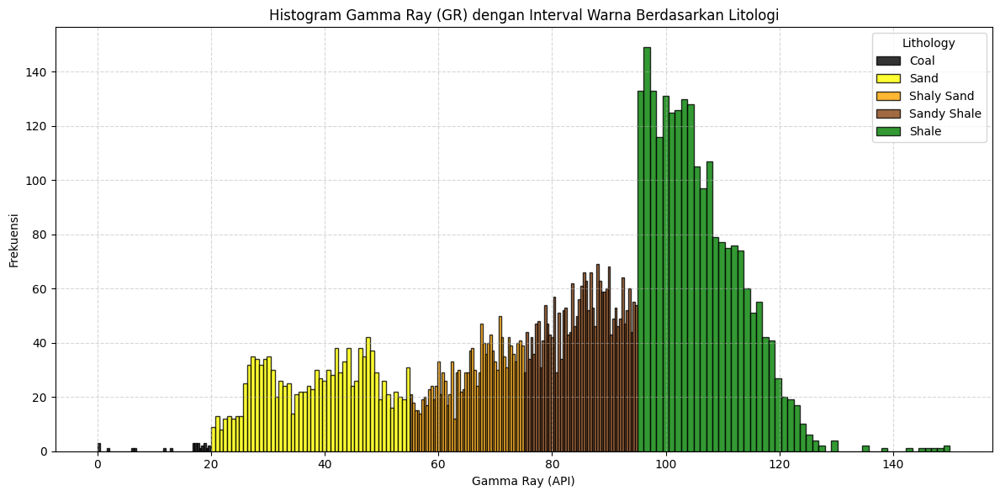

Saved lithology_distribution(new).png
Saved lithology_distribution(new).jpg
Saved lithology_distribution(new).svg


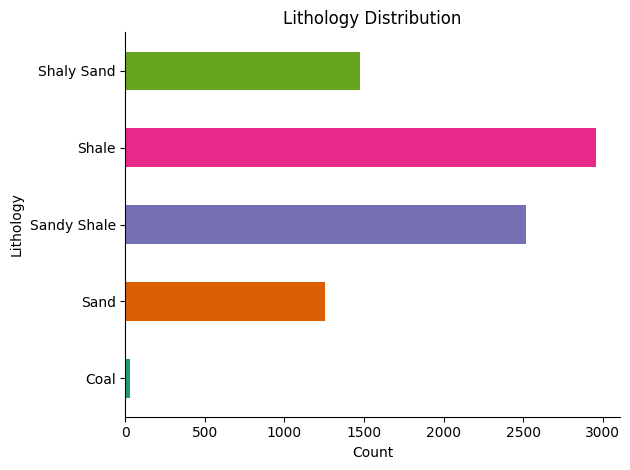

Saved accuracy_loss(new).png
Saved accuracy_loss(new).jpg
Saved accuracy_loss(new).svg


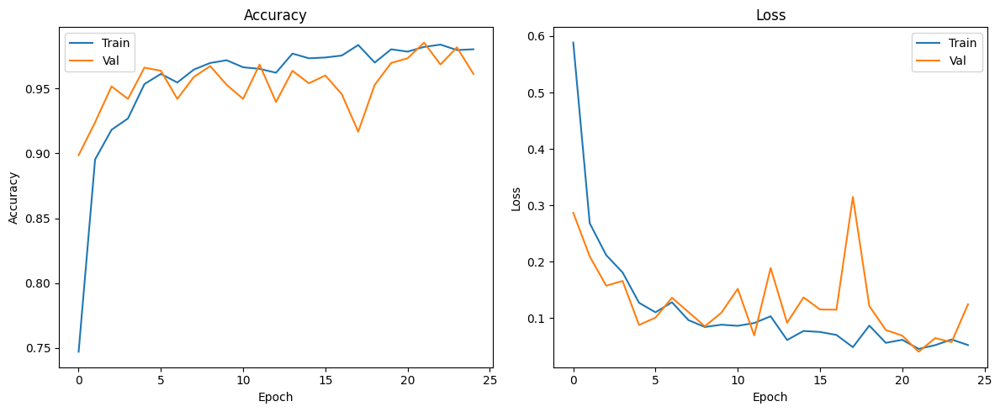


Confusion Matrix:
Saved confusion_matrix(new).png
Saved confusion_matrix(new).jpg
Saved confusion_matrix(new).svg


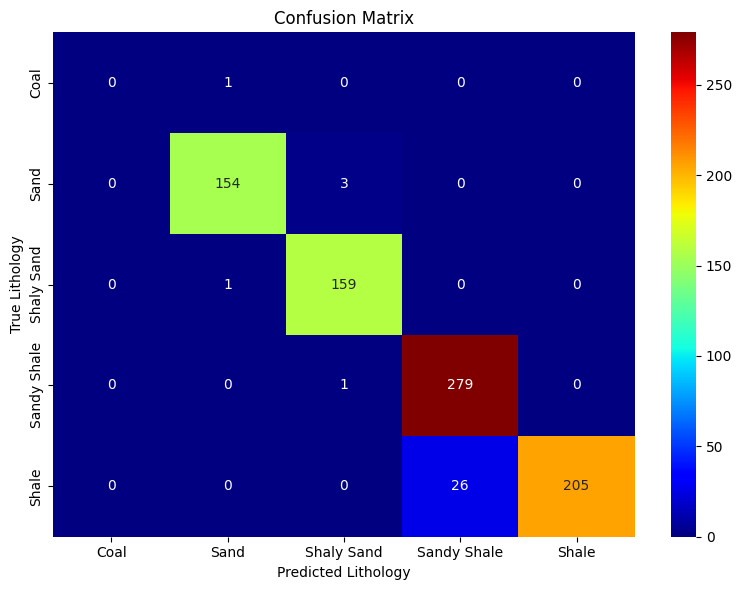

Saved test_set_prediction_log(new).png
Saved test_set_prediction_log(new).jpg
Saved test_set_prediction_log(new).svg


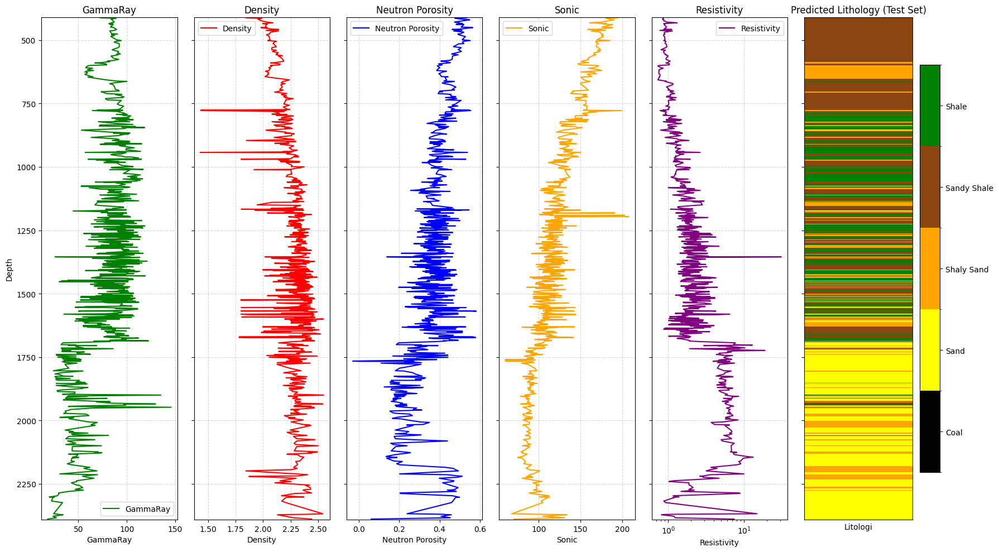

130/130 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step
Saved full_cleaned_data_log_prediction(new).png
Saved full_cleaned_data_log_prediction(new).jpg
Saved full_cleaned_data_log_prediction(new).svg


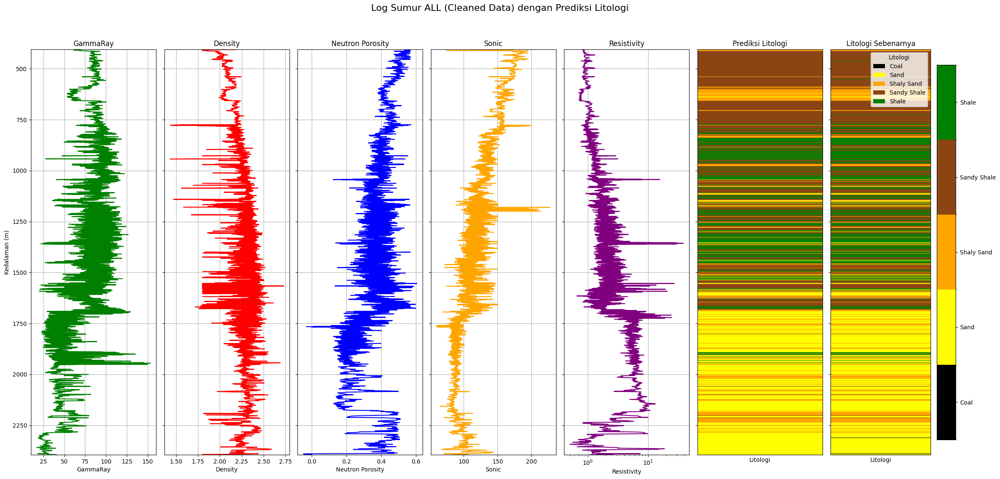

Saved well_NTN-1_prediction_log(new).png
Saved well_NTN-1_prediction_log(new).jpg
Saved well_NTN-1_prediction_log(new).svg


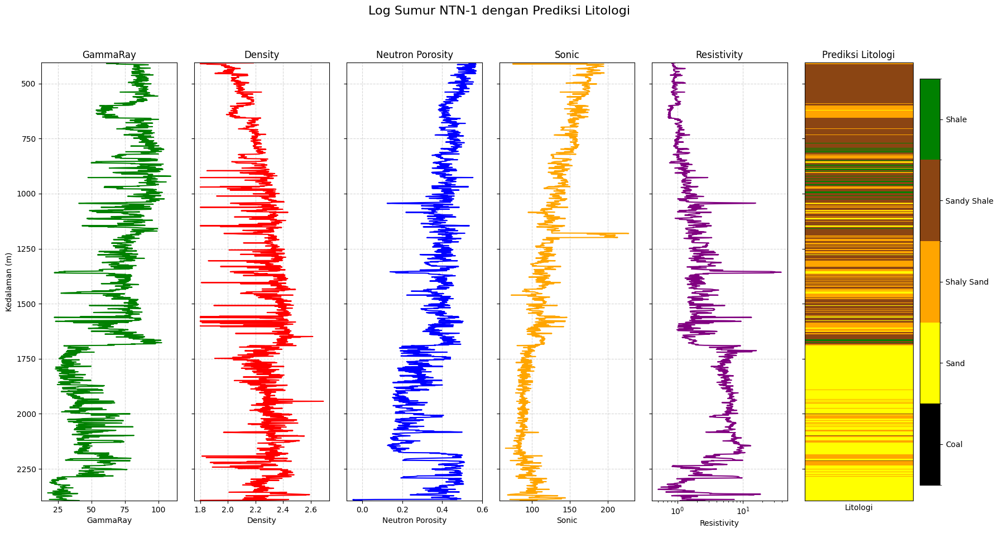

Saved well_NTN-2_prediction_log(new).png
Saved well_NTN-2_prediction_log(new).jpg
Saved well_NTN-2_prediction_log(new).svg


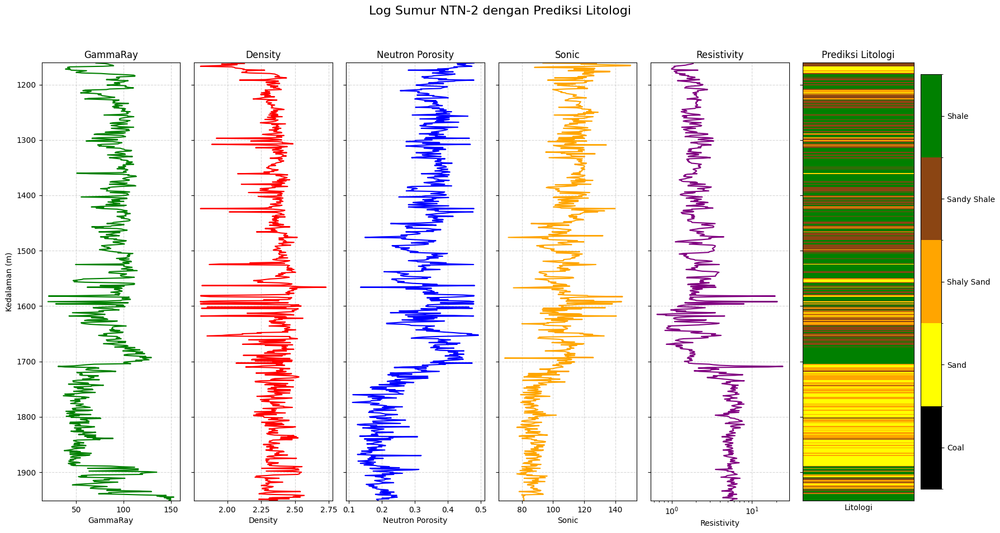

Saved well_NTN-3_prediction_log(new).png
Saved well_NTN-3_prediction_log(new).jpg
Saved well_NTN-3_prediction_log(new).svg


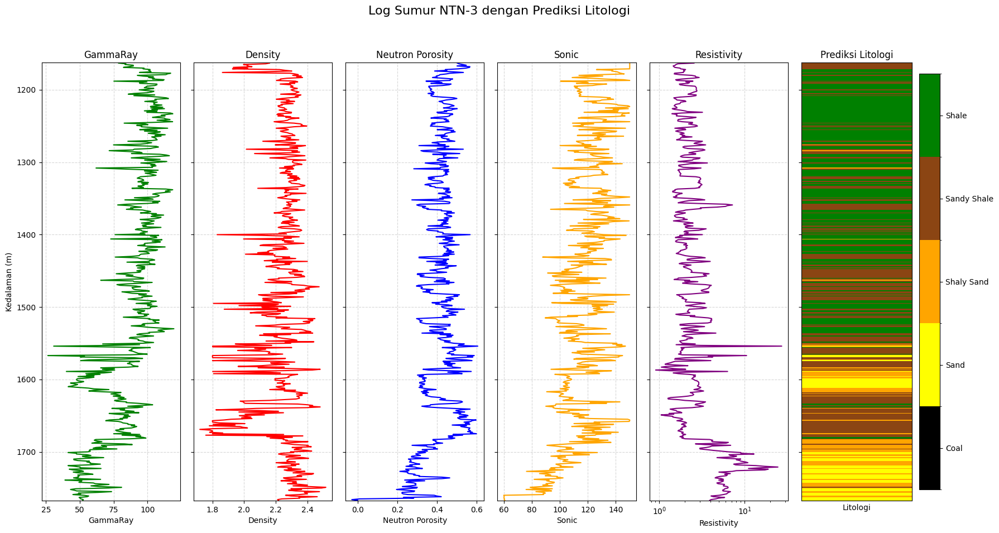

Saved well_NTN-6_prediction_log(new).png
Saved well_NTN-6_prediction_log(new).jpg
Saved well_NTN-6_prediction_log(new).svg


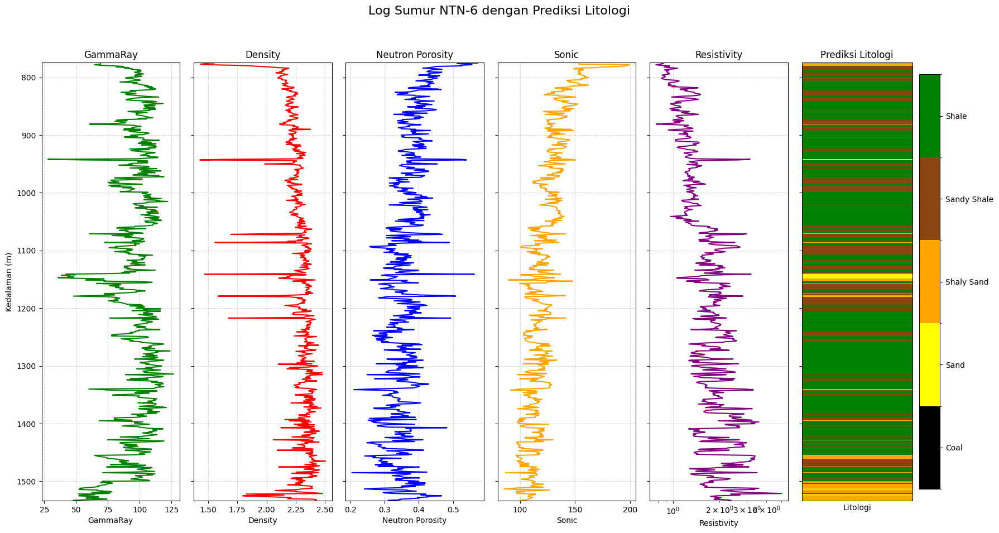

Saved correlation_matrix(new).png
Saved correlation_matrix(new).jpg
Saved correlation_matrix(new).svg


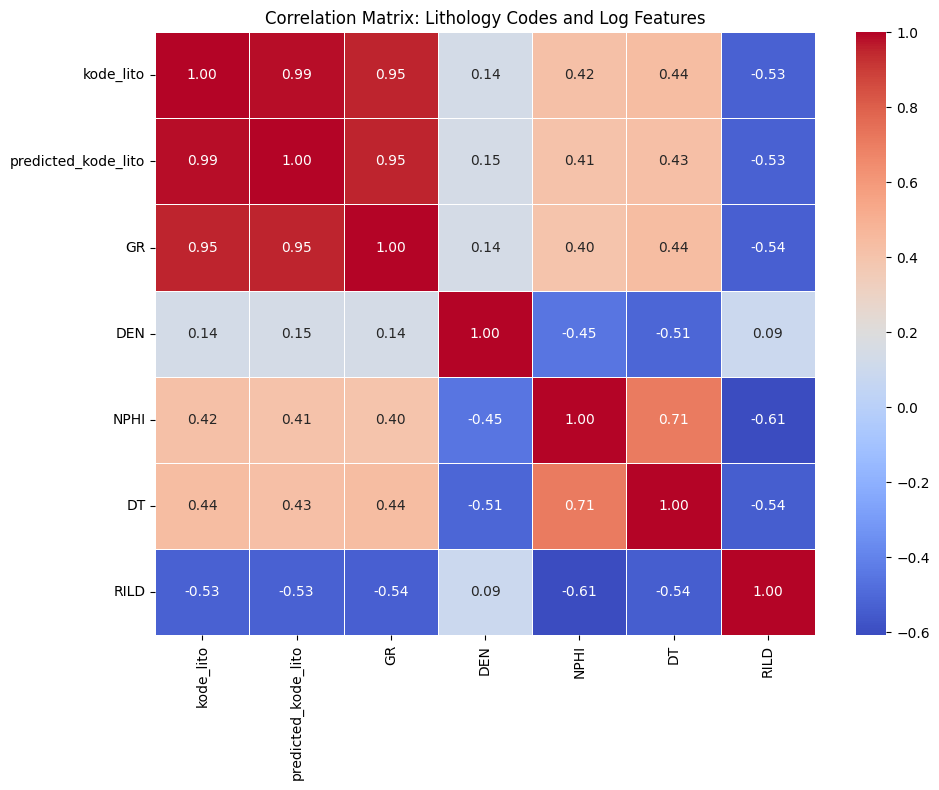

Saved well_NTN-1_prediction_log_with_aimb(new).png
Saved well_NTN-1_prediction_log_with_aimb(new).jpg
Saved well_NTN-1_prediction_log_with_aimb(new).svg


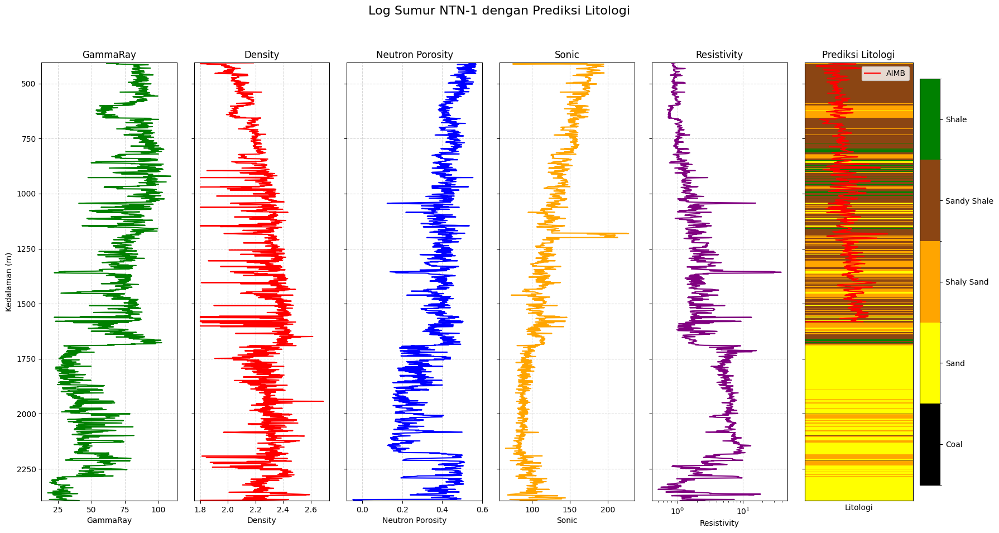

Saved well_NTN-2_prediction_log_with_aimb(new).png
Saved well_NTN-2_prediction_log_with_aimb(new).jpg
Saved well_NTN-2_prediction_log_with_aimb(new).svg


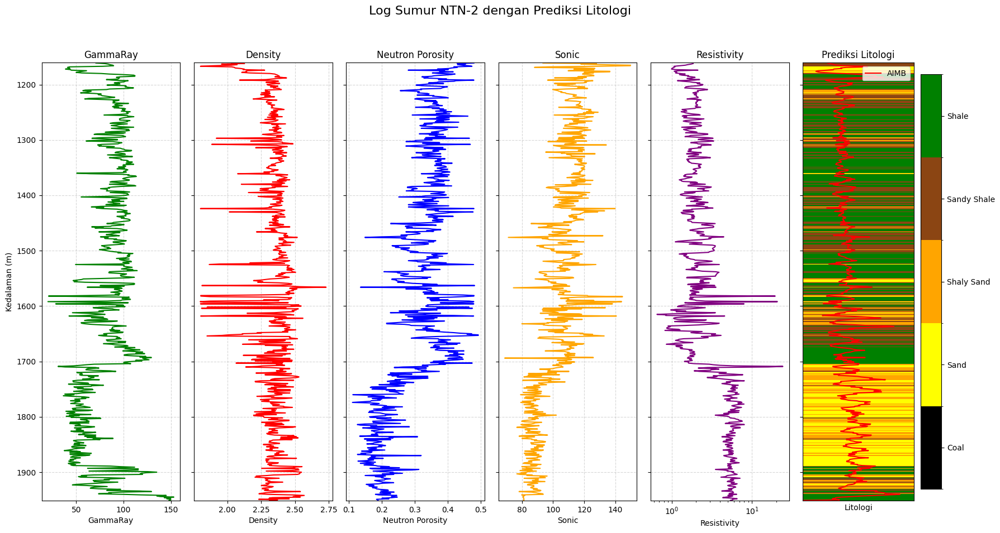

Saved well_NTN-3_prediction_log_with_aimb(new).png
Saved well_NTN-3_prediction_log_with_aimb(new).jpg
Saved well_NTN-3_prediction_log_with_aimb(new).svg


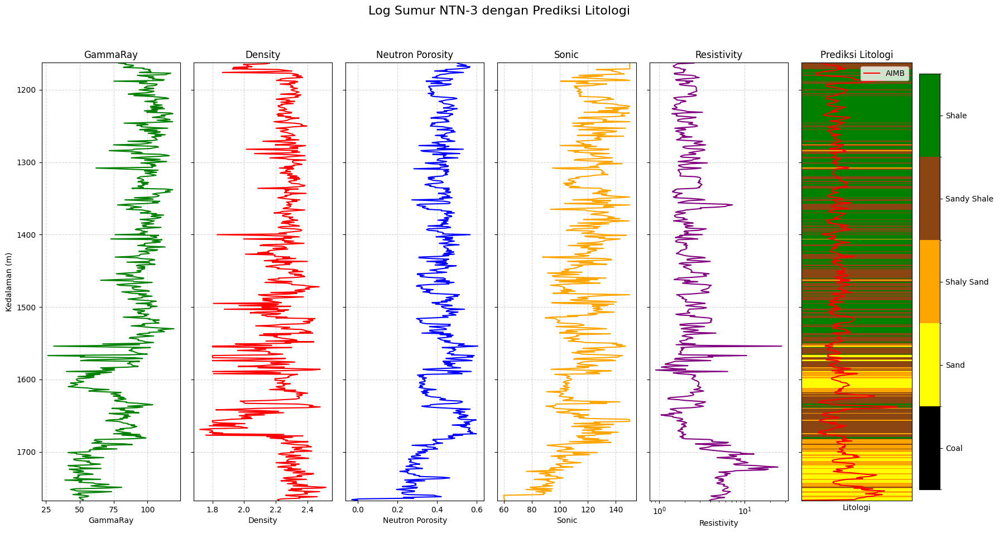

Saved well_NTN-6_prediction_log_with_aimb(new).png
Saved well_NTN-6_prediction_log_with_aimb(new).jpg
Saved well_NTN-6_prediction_log_with_aimb(new).svg


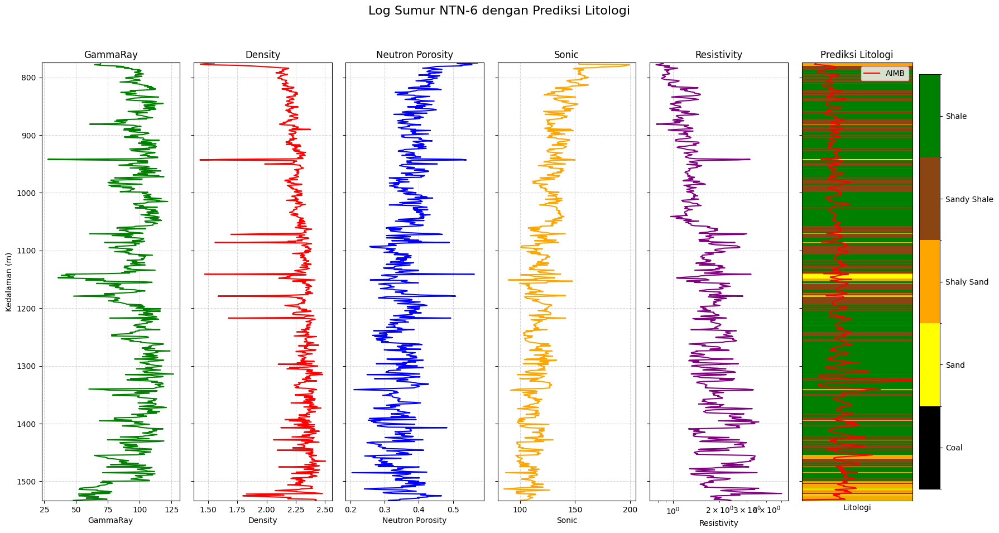

In [ ]:
#Save New
import matplotlib.pyplot as plt
import numpy as np
# Modify the plot functions to save the figures in different formats

# Function to plot logs and classification and save the figure
def plot_logs_and_classification(X_data, depth_data, y_true=None, y_pred_classes=None, title_suffix="", lithology_to_code=None, filename=None, formats=['png']):
    num_features = X_data.shape[1]
    num_plots = num_features + 1 # Features + Classification track

    fig, axs = plt.subplots(1, num_plots, figsize=(3 * num_plots, 10), sharey=True)

    # Plot Log Tracks
    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']

    for i in range(num_features):
        axs[i].plot(X_data[:, i], depth_data, color=log_colors[i], label=log_labels[i])
        axs[i].set_title(log_labels[i])
        axs[i].set_xlabel(log_labels[i])
        if i == 0:
            axs[i].set_ylabel('Depth')
        axs[i].legend()
        axs[i].grid(True, linestyle='--', alpha=0.5)
        if log_labels[i] == 'Resistivity':
            axs[i].set_xscale('log')


    # Plot Classification Track
    cmap = cmap_plot
    norm = norm_plot
    lithology_labels = lithology_labels_plot
    num_classes = len(lithology_labels)

    if lithology_to_code is None:
         code_to_lithology = {i: label for i, label in enumerate(lithology_labels)}
    else:
         code_to_lithology = {v: k for k, v in lithology_to_code.items()}
         sorted_codes = sorted(lithology_to_code.values())
         lithology_labels = [k for k, v in sorted(lithology_to_code.items(), key=lambda item: item[1])]


    sort_indices = np.argsort(depth_data)
    depth_data_sorted = depth_data[sort_indices]

    if y_pred_classes is not None:
        classification_data = y_pred_classes[sort_indices].reshape(-1, 1)
        title = f'Predicted Lithology {title_suffix}'
    elif y_true is not None:
        classification_data = y_true[sort_indices].reshape(-1, 1)
        title = f'True Lithology {title_suffix}'
    else:
        title = 'Classification'
        classification_data = np.zeros((len(depth_data_sorted), 1))


    dummy_x = np.array([0, 1])
    if len(depth_data_sorted) > 1:
        depth_boundaries = np.concatenate([depth_data_sorted[0:1] - (depth_data_sorted[1] - depth_data_sorted[0])/2,
                                            (depth_data_sorted[:-1] + depth_data_sorted[1:]) / 2,
                                            depth_data_sorted[-1:] + (depth_data_sorted[-1] - depth_data_sorted[-2])/2])
    else:
         depth_boundaries = np.array([depth_data_sorted[0] - 0.5, depth_data_sorted[0] + 0.5])


    X_mesh, Y_mesh = np.meshgrid(dummy_x, depth_boundaries)


    mesh = axs[num_features].pcolormesh(X_mesh, Y_mesh, classification_data, cmap=cmap, norm=norm, shading='flat')

    axs[num_features].set_title(title)
    axs[num_features].set_xlabel('Litologi')
    axs[num_features].set_xticks([])
    axs[num_features].invert_yaxis()
    axs[num_features].grid(False)

    cbar = fig.colorbar(mesh, ax=axs[num_features], ticks=np.arange(num_classes) + 0.5)
    cbar.ax.set_yticklabels(lithology_labels)

    plt.tight_layout()

    # Save the figure in specified formats
    if filename:
        base_filename, _ = os.path.splitext(filename) # Remove original extension if present
        for fmt in formats:
             save_filename = f"{base_filename}(new).{fmt}"
             plt.savefig(save_filename, dpi=300, bbox_inches='tight')
             print(f"Saved {save_filename}")


    plt.show()

# Function to plot logs and predicted lithology for a single well and save the figure
def plot_well_prediction(df_well_with_pred, well_name, feature_cols, lithology_labels_plot, filename=None, formats=['png']):
    if 'DEPT' not in df_well_with_pred.columns or 'predicted_kode_lito' not in df_well_with_pred.columns:
        print(f"Skipping plot for {well_name}: Required columns ('DEPT', 'predicted_kode_lito') not found.")
        return

    cols_to_check = feature_cols + ['predicted_kode_lito', 'DEPT']
    df_plot = df_well_with_pred[cols_to_check].dropna()

    if df_plot.empty:
        print(f"No valid data for plotting in {well_name} after dropping NaNs.")
        return

    df_plot = df_plot.sort_values(by='DEPT')

    depth_data = df_plot['DEPT'].values
    X_data = df_plot[feature_cols].values
    y_pred_classes = df_plot['predicted_kode_lito'].values

    num_features = X_data.shape[1]
    num_plots = num_features + 1

    fig, axs = plt.subplots(1, num_plots, figsize=(3 * num_plots, 10), sharey=True)
    fig.suptitle(f'Log Sumur {well_name} dengan Prediksi Litologi', fontsize=16)

    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']

    for i in range(num_features):
        axs[i].plot(X_data[:, i], depth_data, color=log_colors[i], label=feature_cols[i])
        axs[i].set_title(log_labels[i])
        axs[i].set_xlabel(log_labels[i])
        if i == 0:
            axs[i].set_ylabel('Kedalaman (m)')
        axs[i].grid(True, linestyle='--', alpha=0.5)
        if log_labels[i] == 'Resistivity':
            axs[i].set_xscale('log')


    cmap = cmap_plot
    norm = norm_plot
    lithology_labels = lithology_labels_plot
    num_classes = len(lithology_labels)

    dummy_x = np.array([0, 1])
    if len(depth_data) > 1:
        depth_boundaries_plot = np.concatenate([depth_data[0:1] - (depth_data[1] - depth_data[0])/2,
                                            (depth_data[:-1] + depth_data[1:]) / 2,
                                            depth_data[-1:] + (depth_data[-1] - depth_data[-2])/2])
    else:
         depth_boundaries_plot = np.array([depth_data[0] - 0.5, depth_data[0] + 0.5])

    X_mesh, Y_mesh = np.meshgrid(dummy_x, depth_boundaries_plot)
    C_mesh = y_pred_classes.reshape(-1, 1)

    mesh = axs[num_features].pcolormesh(X_mesh, Y_mesh, C_mesh, cmap=cmap, norm=norm, shading='flat')

    axs[num_features].set_title('Prediksi Litologi')
    axs[num_features].set_xlabel('Litologi')
    axs[num_features].set_xticks([])
    axs[num_features].invert_yaxis()
    axs[num_features].grid(False)

    cbar = fig.colorbar(mesh, ax=axs[num_features], ticks=np.arange(num_classes) + 0.5)
    cbar.ax.set_yticklabels(lithology_labels)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Save the figure in specified formats
    if filename:
        base_filename, _ = os.path.splitext(filename) # Remove original extension if present
        for fmt in formats:
             save_filename = f"{base_filename}(new).{fmt}"
             plt.savefig(save_filename, dpi=300, bbox_inches='tight')
             print(f"Saved {save_filename}")

    plt.show()


# Function to plot the full cleaned data log with predicted and true lithology and save the figure
def plot_full_log_with_prediction(X_data, depth_data, y_true, y_pred_classes, feature_cols, lithology_labels_plot, aigabung_np=None, depthcnn=None, filename=None, formats=['png']):
    sort_indices_full = np.argsort(depth_data)
    X_full_cleaned_sorted = X_data[sort_indices_full]
    depth_full_cleaned_sorted = depth_data[sort_indices_full]
    y_full_cleaned_true_sorted = y_true[sort_indices_full]
    y_pred_full_cleaned_classes_sorted = y_pred_classes[sort_indices_full]

    fig_full, axs_full = plt.subplots(1, 7, figsize=(24, 12), sharey=True)
    fig_full.suptitle('Log Sumur ALL (Cleaned Data) dengan Prediksi Litologi', fontsize=16)

    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']
    for i in range(X_full_cleaned_sorted.shape[1]):
        axs_full[i].plot(X_full_cleaned_sorted[:, i], depth_full_cleaned_sorted, color=log_colors[i])
        axs_full[i].set_title(log_labels[i])
        axs_full[i].set_xlabel(log_labels[i])
        if i == 0:
            axs_full[i].set_ylabel('Kedalaman (m)')
        axs_full[i].invert_yaxis()
        axs_full[i].grid(True)
        if log_labels[i] == 'Resistivity':
            axs_full[i].set_xscale('log')

    cmap = cmap_plot
    norm = norm_plot
    lithology_labels = lithology_labels_plot
    num_classes = len(lithology_labels)

    dummy_x_full = np.array([0, 1])
    if len(depth_full_cleaned_sorted) > 1:
        depth_boundaries_full_plot = np.concatenate([depth_full_cleaned_sorted[0:1] - (depth_full_cleaned_sorted[1] - depth_full_cleaned_sorted[0])/2,
                                                    (depth_full_cleaned_sorted[:-1] + depth_full_cleaned_sorted[1:]) / 2,
                                                    depth_full_cleaned_sorted[-1:] + (depth_full_cleaned_sorted[-1] - depth_full_cleaned_sorted[-2])/2])
    else:
         depth_boundaries_full_plot = np.array([depth_full_cleaned_sorted[0] - 0.5, depth_full_cleaned_sorted[0] + 0.5])

    X_mesh_full_pred, Y_mesh_full_pred = np.meshgrid(dummy_x_full, depth_boundaries_full_plot)
    C_mesh_full_pred = y_pred_full_cleaned_classes_sorted.reshape(-1, 1)

    mesh_full_pred = axs_full[5].pcolormesh(X_mesh_full_pred, Y_mesh_full_pred, C_mesh_full_pred, cmap=cmap, norm=norm, shading='flat')

    axs_full[5].set_title('Prediksi Litologi')
    axs_full[5].set_xlabel('Litologi')
    axs_full[5].set_xticks([])
    axs_full[5].invert_yaxis()
    axs_full[5].grid(False)

    C_mesh_full_true = y_full_cleaned_true_sorted.reshape(-1, 1)
    mesh_full_true = axs_full[6].pcolormesh(X_mesh_full_pred, Y_mesh_full_pred, C_mesh_full_true, cmap=cmap, norm=norm, shading='flat')

    if aigabung_np is not None and depthcnn is not None and len(depthcnn) == len(aigabung_np):
        closest_indices_in_full_depth = np.searchsorted(depth_full_cleaned_sorted, depthcnn)
        closest_indices_in_full_depth = np.clip(closest_indices_in_full_depth, 0, len(depth_full_cleaned_sorted) - 1)
        aligned_aigabung_depth = depth_full_cleaned_sorted[closest_indices_in_full_depth]

        min_aigabung = np.min(aigabung_np)
        max_aigabung = np.max(aigabung_np)
        if max_aigabung > min_aigabung:
            normalized_aigabung = (aigabung_np - min_aigabung) / (max_aigabung - min_aigabung)
        else:
            normalized_aigabung = np.zeros_like(aigabung_np)

        x_position_aigabung = normalized_aigabung
        axs_full[6].plot(x_position_aigabung, aligned_aigabung_depth, color='red', linestyle='-', label='AIGabung')
        axs_full[6].legend(loc='upper right')

    axs_full[6].set_title('Litologi Sebenarnya')
    axs_full[6].set_xlabel('Litologi')
    axs_full[6].set_xticks([])
    axs_full[6].invert_yaxis()
    axs_full[6].grid(False)

    legend_elements_full = [Patch(facecolor=color, label=label) for label, color in zip(lithology_labels_plot, lithology_colors_plot)]
    cbar_full_true = fig_full.colorbar(mesh_full_true, ax=axs_full[6], ticks=np.arange(len(lithology_labels_plot)) + 0.5)
    cbar_full_true.ax.set_yticklabels(lithology_labels_plot)

    axs_full[6].legend(handles=legend_elements_full, loc='upper right', title='Litologi')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Save the figure in specified formats
    if filename:
        base_filename, _ = os.path.splitext(filename) # Remove original extension if present
        for fmt in formats:
             save_filename = f"{base_filename}(new).{fmt}"
             plt.savefig(save_filename, dpi=300, bbox_inches='tight')
             print(f"Saved {save_filename}")

    plt.show()

# Function to plot logs and predicted lithology for a single well with AIMB and save the figure
def plot_well_prediction_with_aimb(df_well_with_pred, well_name, feature_cols, lithology_labels_plot, aimb_data=None, aimb_depth=None, filename=None, formats=['png']):
    if 'DEPT' not in df_well_with_pred.columns or 'predicted_kode_lito' not in df_well_with_pred.columns:
        print(f"Skipping plot for {well_name}: Required columns ('DEPT', 'predicted_kode_lito') not found.")
        return

    cols_to_check = feature_cols + ['predicted_kode_lito', 'DEPT']
    df_plot = df_well_with_pred[cols_to_check].dropna()

    if df_plot.empty:
        print(f"No valid data for plotting in {well_name} after dropping NaNs.")
        return

    df_plot = df_plot.sort_values(by='DEPT')

    depth_data = df_plot['DEPT'].values
    X_data = df_plot[feature_cols].values
    y_pred_classes = df_plot['predicted_kode_lito'].values

    num_features = X_data.shape[1]
    num_plots = num_features + 1

    fig, axs = plt.subplots(1, num_plots, figsize=(3 * num_plots, 10), sharey=True)
    fig.suptitle(f'Log Sumur {well_name} dengan Prediksi Litologi', fontsize=16)

    log_labels = ['GammaRay', 'Density', 'Neutron Porosity', 'Sonic', 'Resistivity']
    log_colors = ['green', 'red', 'blue', 'orange', 'purple']

    for i in range(num_features):
        axs[i].plot(X_data[:, i], depth_data, color=log_colors[i], label=feature_cols[i])
        axs[i].invert_yaxis()
        axs[i].set_title(log_labels[i])
        axs[i].set_xlabel(log_labels[i])
        if i == 0:
            axs[i].set_ylabel('Kedalaman (m)')
        axs[i].grid(True, linestyle='--', alpha=0.5)
        if log_labels[i] == 'Resistivity':
            axs[i].set_xscale('log')

    cmap = cmap_plot
    norm = norm_plot
    lithology_labels = lithology_labels_plot
    num_classes = len(lithology_labels)

    dummy_x = np.array([0, 1])
    if len(depth_data) > 1:
        depth_boundaries_plot = np.concatenate([depth_data[0:1] - (depth_data[1] - depth_data[0])/2,
                                            (depth_data[:-1] + depth_data[1:]) / 2,
                                            depth_data[-1:] + (depth_data[-1] - depth_data[-2])/2])
    else:
         depth_boundaries_plot = np.array([depth_data[0] - 0.5, depth_data[0] + 0.5])

    X_mesh, Y_mesh = np.meshgrid(dummy_x, depth_boundaries_plot)
    C_mesh = y_pred_classes.reshape(-1, 1)

    mesh = axs[num_features].pcolormesh(X_mesh, Y_mesh, C_mesh, cmap=cmap, norm=norm, shading='flat')

    axs[num_features].set_title('Prediksi Litologi')
    axs[num_features].set_xlabel('Litologi')
    axs[num_features].set_xticks([])
    # axs[num_features].invert_yaxis()
    axs[num_features].grid(False)

    if aimb_data is not None and aimb_depth is not None and len(aimb_data) == len(aimb_depth):
         closest_indices_in_well_depth = np.searchsorted(depth_data, aimb_depth)
         closest_indices_in_well_depth = np.clip(closest_indices_in_well_depth, 0, len(depth_data) - 1)
         aligned_aimb_depth = depth_data[closest_indices_in_well_depth]

         min_aigabung = np.min(aigabung_np)
         max_aigabung = np.max(aigabung_np)

         if max_aigabung > min_aigabung:
             scaled_aimb = (aimb_data - min_aigabung) / (max_aigabung - min_aigabung)
         else:
             scaled_aimb = np.zeros_like(aimb_data)

         axs[num_features].plot(scaled_aimb, aligned_aimb_depth, color='red', linestyle='-', label='AIMB')
         axs[num_features].legend(loc='upper right')

    cbar = fig.colorbar(mesh, ax=axs[num_features], ticks=np.arange(num_classes) + 0.5)
    cbar.ax.set_yticklabels(lithology_labels)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Save the figure in specified formats
    if filename:
        base_filename, _ = os.path.splitext(filename) # Remove original extension if present
        for fmt in formats:
             save_filename = f"{base_filename}(new).{fmt}"
             plt.savefig(save_filename, dpi=300, bbox_inches='tight')
             print(f"Saved {save_filename}")

    plt.show()


import os # Import os for path manipulation

# --- Save the first histogram plot ---
plt.figure(figsize=(12, 6))
intervals = [
    (0, 20, 'black', 'Coal'),
    (20, 55, 'yellow', 'Sand'),
    (55, 75, 'orange', 'Shaly Sand'),
    (75, 95, 'saddlebrown', 'Sandy Shale'),
    (95, 150, 'green', 'Shale')
]
for lower, upper, color, label in intervals:
    mask = (df_all['GR'] >= lower) & (df_all['GR'] < upper)
    plt.hist(df_all['GR'][mask], bins=50, color=color, edgecolor='k', alpha=0.8, label=label)

plt.title("Histogram Gamma Ray (GR) dengan Interval Warna Berdasarkan Litologi")
plt.xlabel("Gamma Ray (API)")
plt.ylabel("Frekuensi")
plt.legend(title="Lithology")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
# Save histogram in different formats
for fmt in ['png', 'jpg', 'svg']: # Add more formats as needed
    plt.savefig(f'gr_histogram(new).{fmt}', dpi=300, bbox_inches='tight')
    print(f"Saved gr_histogram(new).{fmt}")
plt.show()

# --- Save the Lithology count bar chart ---
plt.figure()
df_all.groupby('Lithology').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.title('Lithology Distribution')
plt.xlabel('Count')
plt.ylabel('Lithology')
plt.tight_layout()
# Save bar chart in different formats
for fmt in ['png', 'jpg', 'svg']:
    plt.savefig(f'lithology_distribution(new).{fmt}', dpi=300, bbox_inches='tight')
    print(f"Saved lithology_distribution(new).{fmt}")
plt.show()


# --- Save the Accuracy and Loss plot ---
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
# Save accuracy/loss plot in different formats
for fmt in ['png', 'jpg', 'svg']:
    plt.savefig(f'accuracy_loss(new).{fmt}', dpi=300, bbox_inches='tight')
    print(f"Saved accuracy_loss(new).{fmt}")
plt.show()


# --- Save the Confusion Matrix plot ---
print("\nConfusion Matrix:")
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred_classes), annot=True, fmt='d', cmap='jet',
            xticklabels=lithology_to_code.keys(), yticklabels=lithology_to_code.keys())
plt.xlabel('Predicted Lithology')
plt.ylabel('True Lithology')
plt.title('Confusion Matrix')
plt.tight_layout()
# Save confusion matrix in different formats
for fmt in ['png', 'jpg', 'svg']:
    plt.savefig(f'confusion_matrix(new).{fmt}', dpi=300, bbox_inches='tight')
    print(f"Saved confusion_matrix(new).{fmt}")
plt.show()


# Plot and Save results for the test set
sort_indices_test = np.argsort(depth_test)
X_test_sorted = X_test[sort_indices_test]
depth_test_sorted = depth_test[sort_indices_test]
y_test_sorted = y_test[sort_indices_test]
y_pred_classes_sorted = y_pred_classes[sort_indices_test]

plot_logs_and_classification(X_test_sorted, depth_test_sorted, y_true=y_test_sorted, y_pred_classes=y_pred_classes_sorted, title_suffix="(Test Set)", lithology_to_code=lithology_to_code, filename='test_set_prediction_log.png', formats=['png', 'jpg', 'svg'])


# Plot and Save the full cleaned data log with predicted and true lithology
if 'DEPT' in Df_clean.columns:
    X_full_cleaned = Df_clean[feature_cols].values
    depth_full_cleaned = Df_clean['DEPT'].values
    y_full_cleaned_true = Df_clean[target_col].values

    X_full_cleaned_scaled = scaler.transform(X_full_cleaned)
    X_full_cleaned_reshaped = X_full_cleaned_scaled.reshape((X_full_cleaned_scaled.shape[0], X_full_cleaned_scaled.shape[1], 1))

    y_pred_full_cleaned_prob = model.predict(X_full_cleaned_reshaped)
    y_pred_full_cleaned_classes = np.argmax(y_pred_full_cleaned_prob, axis=1)

    aigabung_exists = 'aigabung_np' in locals() and isinstance(aigabung_np, np.ndarray)
    depthcnn_exists = 'depthcnn' in locals() and isinstance(depthcnn, np.ndarray)

    if aigabung_exists and depthcnn_exists:
         plot_full_log_with_prediction(X_full_cleaned, depth_full_cleaned, y_full_cleaned_true, y_pred_full_cleaned_classes, feature_cols, lithology_labels_plot, aigabung_np=aigabung_np, depthcnn=depthcnn, filename='full_cleaned_data_log_prediction.png', formats=['png', 'jpg', 'svg'])
    else:
         print("Skipping plotting aigabung_np on full log plot: aigabung_np or depthcnn not defined or are not numpy arrays.")
         plot_full_log_with_prediction(X_full_cleaned, depth_full_cleaned, y_full_cleaned_true, y_pred_full_cleaned_classes, feature_cols, lithology_labels_plot, filename='full_cleaned_data_log_prediction.png', formats=['png', 'jpg', 'svg'])

else:
    print("Skipping full log plot as 'DEPT' column is not available in cleaned data.")


# Plot and Save results for each well
plot_well_prediction(df1_with_pred, "NTN-1", feature_cols, lithology_labels_plot, filename='well_NTN-1_prediction_log.png', formats=['png', 'jpg', 'svg'])
plot_well_prediction(df2_with_pred, "NTN-2", feature_cols, lithology_labels_plot, filename='well_NTN-2_prediction_log.png', formats=['png', 'jpg', 'svg'])
plot_well_prediction(df3_with_pred, "NTN-3", feature_cols, lithology_labels_plot, filename='well_NTN-3_prediction_log.png', formats=['png', 'jpg', 'svg'])
plot_well_prediction(df6_with_pred, "NTN-6", feature_cols, lithology_labels_plot, filename='well_NTN-6_prediction_log.png', formats=['png', 'jpg', 'svg'])


# --- Save the Correlation Matrix plot ---
# Ensure df_eval and df_correlation are created from the previous cell
# If not, re-run the relevant parts of the previous cell first
# Assuming df_correlation is available:
if 'df_correlation' in locals() and not df_correlation.empty:
    correlation_matrix = df_correlation.corr()

    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
    plt.title('Correlation Matrix: Lithology Codes and Log Features')
    plt.tight_layout()
    # Save correlation matrix in different formats
    for fmt in ['png', 'jpg', 'svg']:
        plt.savefig(f'correlation_matrix(new).{fmt}', dpi=300, bbox_inches='tight')
        print(f"Saved correlation_matrix(new).{fmt}")
    plt.show()
else:
     print("Skipping correlation matrix plot: df_correlation not found or is empty.")

# Plot results for each well, now including the respective AIMB data and saving
# Need to ensure aimb_depth arrays are correctly generated for each well's plot range.
# Re-calculating depth data for each cleaned well plot for safety
df1_plot_data = df1_with_pred.dropna(subset=feature_cols + ['predicted_kode_lito', 'DEPT']).sort_values(by='DEPT')
if not df1_plot_data.empty:
    df1_plot_depth_ = df1_plot_data['DEPT'].values
    # Assuming aimb1 corresponds to the first 1177 points of the cleaned depth for NTN-1
    # This might need adjustment based on actual data
    if len(df1_plot_depth_) >= 1177:
        df1_plot_depth = df1_plot_depth_[0:1177]
        if len(aimb1) == len(df1_plot_depth):
             plot_well_prediction_with_aimb(df1_with_pred, "NTN-1", feature_cols, lithology_labels_plot, aimb_data=aimb1, aimb_depth=df1_plot_depth, filename='well_NTN-1_prediction_log_with_aimb.png', formats=['png', 'jpg', 'svg'])
        else:
             print(f"Skipping plotting AIMB for NTN-1: Length mismatch between aimb1 ({len(aimb1)}) and adjusted plot depth ({len(df1_plot_depth)}).")
    else:
        print(f"Skipping plotting AIMB for NTN-1: Cleaned data for NTN-1 is shorter than expected ({len(df1_plot_depth_)} < 1177).")
else:
    print("Skipping plotting AIMB for NTN-1: No valid data for plotting NTN-1.")


df2_plot_data = df2_with_pred.dropna(subset=feature_cols + ['predicted_kode_lito', 'DEPT']).sort_values(by='DEPT')
if not df2_plot_data.empty:
    df2_plot_depth = df2_plot_data['DEPT'].values
    if len(aimb2) == len(df2_plot_depth):
         plot_well_prediction_with_aimb(df2_with_pred, "NTN-2", feature_cols, lithology_labels_plot, aimb_data=aimb2, aimb_depth=df2_plot_depth, filename='well_NTN-2_prediction_log_with_aimb.png', formats=['png', 'jpg', 'svg'])
    else:
         print(f"Skipping plotting AIMB for NTN-2: Length mismatch between aimb2 ({len(aimb2)}) and plot depth ({len(df2_plot_depth)}).")
else:
    print("Skipping plotting AIMB for NTN-2: No valid data for plotting NTN-2.")


df3_plot_data = df3_with_pred.dropna(subset=feature_cols + ['predicted_kode_lito', 'DEPT']).sort_values(by='DEPT')
if not df3_plot_data.empty:
    df3_plot_depth = df3_plot_data['DEPT'].values
    if len(aimb3) == len(df3_plot_depth):
         plot_well_prediction_with_aimb(df3_with_pred, "NTN-3", feature_cols, lithology_labels_plot, aimb_data=aimb3, aimb_depth=df3_plot_depth, filename='well_NTN-3_prediction_log_with_aimb.png', formats=['png', 'jpg', 'svg'])
    else:
         print(f"Skipping plotting AIMB for NTN-3: Length mismatch between aimb3 ({len(aimb3)}) and plot depth ({len(df3_plot_depth)}).")
else:
    print("Skipping plotting AIMB for NTN-3: No valid data for plotting NTN-3.")


df6_plot_data = df6_with_pred.dropna(subset=feature_cols + ['predicted_kode_lito', 'DEPT']).sort_values(by='DEPT')
if not df6_plot_data.empty:
    df6_plot_depth_ = df6_plot_data['DEPT'].values
    # Assuming aimb6 corresponds to the first 758 points of the cleaned depth for NTN-6
    # This might need adjustment based on actual data
    if len(df6_plot_depth_) >= 758:
        df6_plot_depth = df6_plot_depth_[0:758]
        if len(aimb6) == len(df6_plot_depth):
             plot_well_prediction_with_aimb(df6_with_pred, "NTN-6", feature_cols, lithology_labels_plot, aimb_data=aimb6, aimb_depth=df6_plot_depth, filename='well_NTN-6_prediction_log_with_aimb.png', formats=['png', 'jpg', 'svg'])
        else:
             print(f"Skipping plotting AIMB for NTN-6: Length mismatch between aimb6 ({len(aimb6)}) and adjusted plot depth ({len(df6_plot_depth)}).")
    else:
        print(f"Skipping plotting AIMB for NTN-6: Cleaned data for NTN-6 is shorter than expected ({len(df6_plot_depth_)} < 758).")

else:
    print("Skipping plotting AIMB for NTN-6: No valid data for plotting NTN-6.")



Skipping plotting AIMB for NTN-1: Length mismatch between aimb1 (1177) and plot depth (1989).


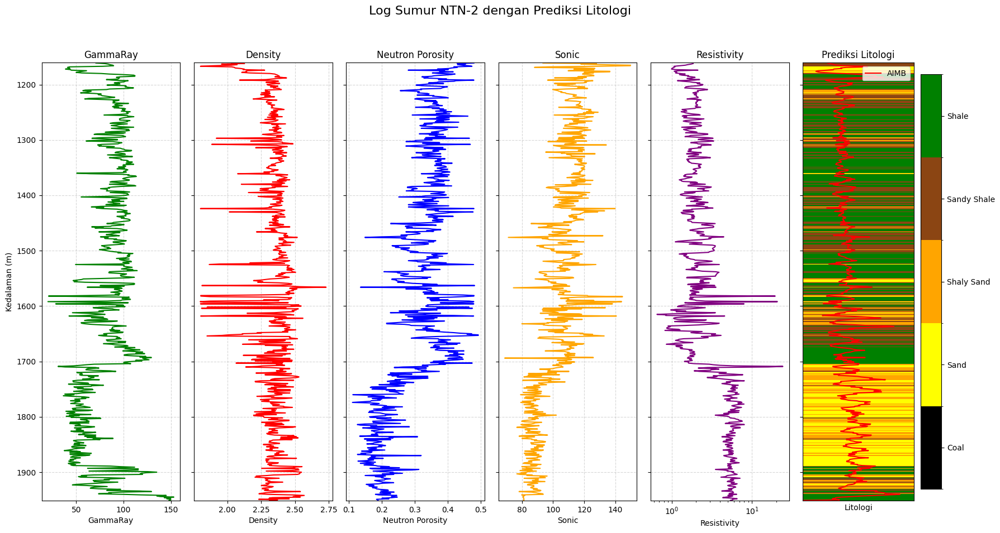

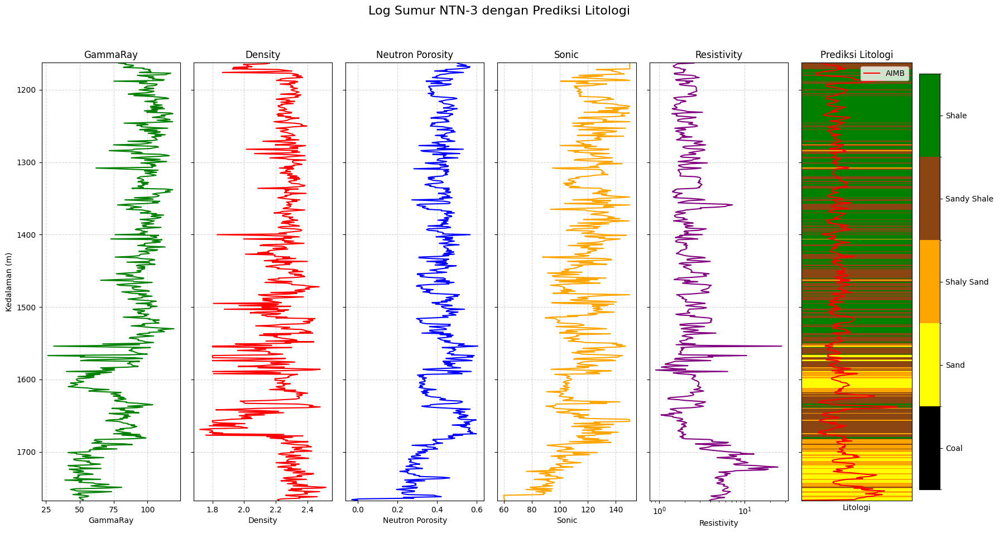

Skipping plotting AIMB for NTN-6: Length mismatch between aimb6 (758) and plot depth (759).


In [ ]:
# prompt: make display yang tinggi dibawah yang kecil diatas(make y invert
# plotkan AIMB persumur juga

# Plot results for each well, now including the respective AIMB data
# You need to define depth arrays for each aimb (aimb1_depth, aimb2_depth, etc.)
# based on the depth range covered by each well's original data.
# For simplicity, let's assume each AIMB corresponds to the entire depth range of its well
# in the *cleaned* data after dropping NaNs.

# Get the depth data for each cleaned well individually
# Ensure these DataFrames (df1_with_pred, etc.) are available and contain 'DEPT' and predicted lithology
df1_plot_data = df1_with_pred.dropna(subset=feature_cols + ['predicted_kode_lito', 'DEPT']).sort_values(by='DEPT')
df1_plot_depth = df1_plot_data['DEPT'].values
df2_plot_data = df2_with_pred.dropna(subset=feature_cols + ['predicted_kode_lito', 'DEPT']).sort_values(by='DEPT')
df2_plot_depth = df2_plot_data['DEPT'].values
df3_plot_data = df3_with_pred.dropna(subset=feature_cols + ['predicted_kode_lito', 'DEPT']).sort_values(by='DEPT')
df3_plot_depth = df3_plot_data['DEPT'].values
df6_plot_data = df6_with_pred.dropna(subset=feature_cols + ['predicted_kode_lito', 'DEPT']).sort_values(by='DEPT')
df6_plot_depth = df6_plot_data['DEPT'].values


# Ensure AIMB data lengths match their respective depth data lengths
# This might require resampling or checking data consistency beforehand.
# Assuming they are already aligned:
if len(aimb1) == len(df1_plot_depth):
    plot_well_prediction_with_aimb(df1_with_pred, "NTN-1", feature_cols, lithology_labels_plot, aimb_data=aimb1, aimb_depth=df1_plot_depth)
else:
    print(f"Skipping plotting AIMB for NTN-1: Length mismatch between aimb1 ({len(aimb1)}) and plot depth ({len(df1_plot_depth)}).")


if len(aimb2) == len(df2_plot_depth):
    plot_well_prediction_with_aimb(df2_with_pred, "NTN-2", feature_cols, lithology_labels_plot, aimb_data=aimb2, aimb_depth=df2_plot_depth)
else:
     print(f"Skipping plotting AIMB for NTN-2: Length mismatch between aimb2 ({len(aimb2)}) and plot depth ({len(df2_plot_depth)}).")


if len(aimb3) == len(df3_plot_depth):
    plot_well_prediction_with_aimb(df3_with_pred, "NTN-3", feature_cols, lithology_labels_plot, aimb_data=aimb3, aimb_depth=df3_plot_depth)
else:
     print(f"Skipping plotting AIMB for NTN-3: Length mismatch between aimb3 ({len(aimb3)}) and plot depth ({len(df3_plot_depth)}).")

if len(aimb6) == len(df6_plot_depth):
    plot_well_prediction_with_aimb(df6_with_pred, "NTN-6", feature_cols, lithology_labels_plot, aimb_data=aimb6, aimb_depth=df6_plot_depth)
else:
     print(f"Skipping plotting AIMB for NTN-6: Length mismatch between aimb6 ({len(aimb6)}) and plot depth ({len(df6_plot_depth)}).")

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch

# Assuming you have your predicted lithology codes in a numpy array named 'predicted_lithology_codes'
# and corresponding depth values in a numpy array named 'depth_values'.
# For this simple example, let's create some dummy data:
num_points = 100
depth_values_simple = np.linspace(0, 100, num_points)
# Create some dummy discrete lithology codes (e.g., 0, 1, 2, 3, 4)
predicted_lithology_codes_simple = np.random.randint(0, 5, num_points)


# Define your lithology colors and labels
lithology_colors_simple = {
    0: 'black', # Coal
    1: 'yellow', # Sand
    2: 'orange', # Shaly Sand
    3: 'saddlebrown', # Sandy Shale
    4: 'green'  # Shale
}
lithology_labels_simple = ['Coal', 'Sand', 'Shaly Sand', 'Sandy Shale', 'Shale']

# Create a colormap and boundary norm for discrete colors
colors_simple = [lithology_colors_simple[i] for i in sorted(lithology_colors_simple.keys())]
cmap_simple = ListedColormap(colors_simple)
bounds_simple = np.arange(-0.5, len(lithology_colors_simple))
norm_simple = BoundaryNorm(bounds_simple, cmap_simple.N)

# Create a figure and an axes for the lithology plot
fig_simple, ax_simple = plt.subplots(figsize=(3, 8))

# Use pcolormesh to create colored bands
# We need to create the vertices for shading='flat'
# For vertical bands, X will have 2 columns and Y will have N+1 rows (where N is num_points)
X_grid_simple = np.array([[0, 1]] * (num_points + 1)) # Create x-vertices (0 and 1) for each depth boundary
# Create y-vertices by adding a boundary point at the end
y_boundaries_simple = np.append(depth_values_simple, depth_values_simple[-1] + (depth_values_simple[-1] - depth_values_simple[-2]))
Y_grid_simple = np.vstack([y_boundaries_simple, y_boundaries_simple]).T # Create y-vertices

# The Z data should have shape (num_points, 1) for shading='flat' with 2 columns in X and Y
C_grid_simple = predicted_lithology_codes_simple.reshape(-1, 1)


# Create the pcolormesh plot
mesh_simple = ax_simple.pcolormesh(X_grid_simple, Y_grid_simple, C_grid_simple,
                                   cmap=cmap_simple, norm=norm_simple, shading='flat')


# Add elements to the plot
ax_simple.set_title('Discrete Classification')
ax_simple.set_xlabel('Classification') # Or 'Lithology' in your case
ax_simple.set_xticks([]) # Hide x-axis ticks as they represent arbitrary values
ax_simple.set_ylabel('Depth')
ax_simple.invert_yaxis() # Invert y-axis for depth

# Add a colorbar with discrete labels
colorbar_simple = fig_simple.colorbar(mesh_simple, ax=ax_simple, ticks=np.arange(len(lithology_labels_simple)) + 0.5) # Ticks centered between colors
colorbar_simple.ax.set_yticklabels(lithology_labels_simple)
colorbar_simple.set_label('Classification Type') # Or 'Lithology Type'

plt.tight_layout()
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Display some example colormaps
print("Sequential Colormaps:")
sns.color_palette("viridis", as_cmap=True)
plt.show()

print("\nDiverging Colormaps:")
sns.color_palette("RdBu", as_cmap=True)
plt.show()

print("\nQualitative Colormaps:")
sns.color_palette("tab10", as_cmap=True)
plt.show()

# To see a full list of colormaps, you can refer to the Seaborn documentation:
# https://seaborn.pydata.org/tutorial/color_palettes.html

In [ ]:
# prompt: simpan hasil prediksi litologi ke txt seratakan dept, gr, den, dll serta litologi sebenarnya

# Save the relevant columns to a text file
output_filename = 'hasil_prediksi_litologi.txt'

# Select columns to include in the output file.
# Ensure 'DEPT', 'GR', 'DEN', 'NPHI', 'DT', 'RILD', 'Lithology' (true), and 'predicted_lithology' are included.
# Check if these columns exist in the DataFrame before selecting.
required_cols = ['DEPT', 'GR', 'DEN', 'NPHI', 'DT', 'RILD', 'Lithology', 'predicted_lithology']
available_cols = [col for col in required_cols if col in df_all.columns]

if 'predicted_lithology' not in df_all.columns:
    print("Error: 'predicted_lithology' column not found in df_all. Please ensure predictions are made and added.")
elif 'Lithology' not in df_all.columns:
     print("Error: 'Lithology' (true) column not found in df_all.")
elif 'DEPT' not in df_all.columns:
    print("Error: 'DEPT' column not found in df_all.")
else:
    # Select the data to be saved
    output_data = df_all[available_cols]

    # Write the header to the file
    header = "\t".join(available_cols) # Use tab as delimiter
    with open(output_filename, 'w') as f:
        f.write(header + '\n')

    # Write the data rows to the file
    # Use .to_csv with sep='\t', index=False, header=False for easy saving
    output_data.to_csv(output_filename, sep='\t', index=False, header=False, mode='a')

    print(f"Hasil prediksi litologi beserta data log dan litologi sebenarnya telah disimpan ke '{output_filename}'")

# Optional: Display the first few lines of the created file to verify
!head {output_filename}
